In [4]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

## 1. Read raw datacube and remove background & fringe

In [2]:
Raw_Datacube = Read_Raw_Datacube("/home/qliu/data/A2390F/A2390NWC4.fits",name="A2390NW")
Raw_Datacube.header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                  -32 / Bits per pixel                                 
NAXIS   =                    3 / Number of axes                                 
NAXIS1  =                 2048 / Axis length                                    
NAXIS2  =                 2064 / Axis length                                    
NAXIS3  =                  150 / Axis length                                    
EXTEND  =                    T / File may contain extensions                    
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
IRAF-TLM= '2017-11-09T22:04:20' / Time of last modification                     
PROGRAM = 'ORB v3.1.2'         / Thomas Martin: thomas.martin.1@ulaval.ca       
DATE    = '2017-11-09T22:05:11' / Creation date                                 
MASK    = 'False   '                                                            
FILETYPE= 'Calibrated Spectr

In [3]:
Raw_Datacube.hdu[0].shape

(150, 2064, 2048)

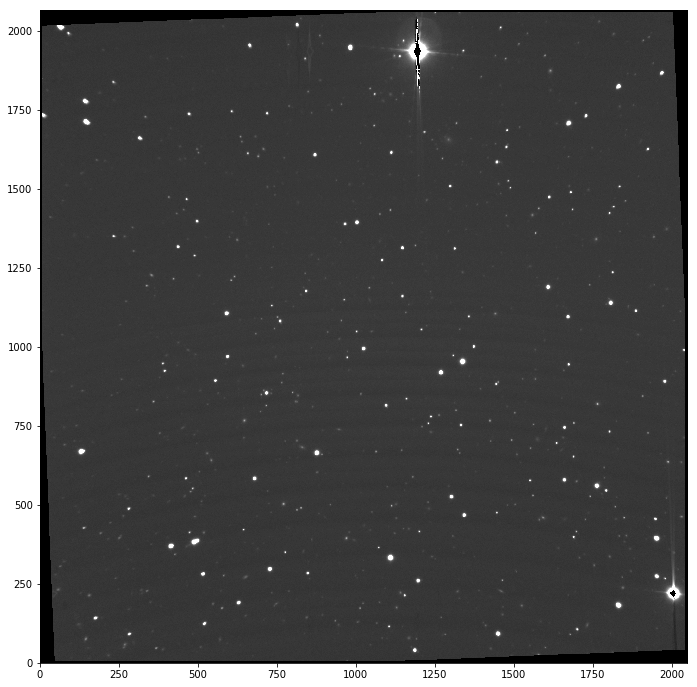

In [5]:
Raw_Datacube.display(Raw_Datacube.raw_stack_field)

In [4]:
Raw_Datacube.save_mask_edge(save_path='/home/qliu/data/A2390F/')

In [5]:
Raw_Datacube.remove_background(save_path='./A2390NW/fig/bkg/', plot=False)

Removing background...Frame: 10
Removing background...Frame: 20
Removing background...Frame: 30
Removing background...Frame: 40
Removing background...Frame: 50
Removing background...Frame: 60


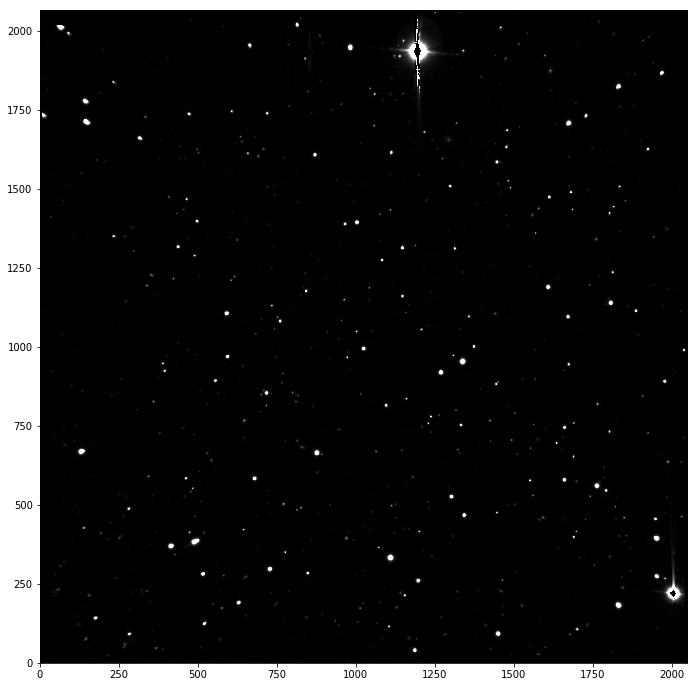

In [8]:
Raw_Datacube.display(Raw_Datacube.stack_field)

In [9]:
Raw_Datacube.wavl.shape

(69,)

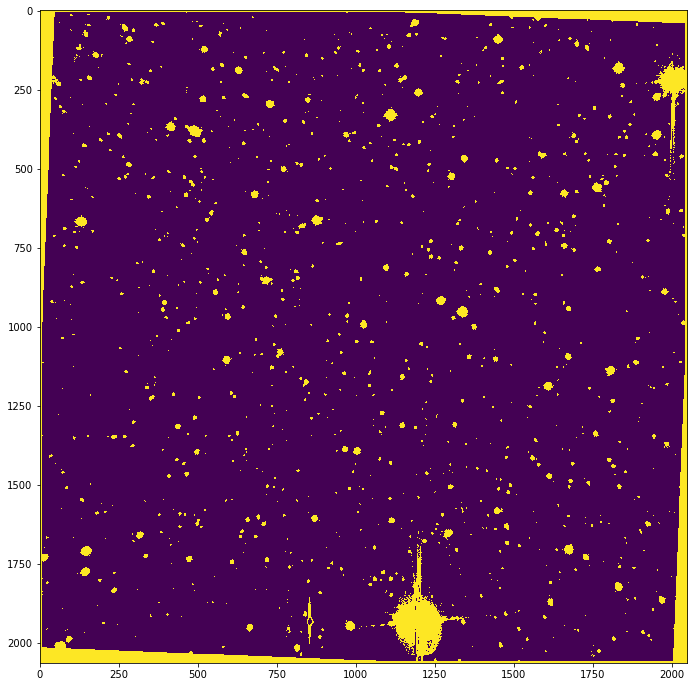

In [9]:
mask_source = Raw_Datacube.stack_field > 3*mad_std(Raw_Datacube.stack_field)
plt.figure(figsize=(12,12))
plt.imshow(np.logical_or(mask_source,Raw_Datacube.mask_edge))

In [6]:
Raw_Datacube.remove_fringe(box_size=4, save_path='./A2390NW/fig/fringe/', plot=True)

Removing fringe...Frame: 10
Removing fringe...Frame: 20
Removing fringe...Frame: 30
Removing fringe...Frame: 40
Removing fringe...Frame: 50
Removing fringe...Frame: 60


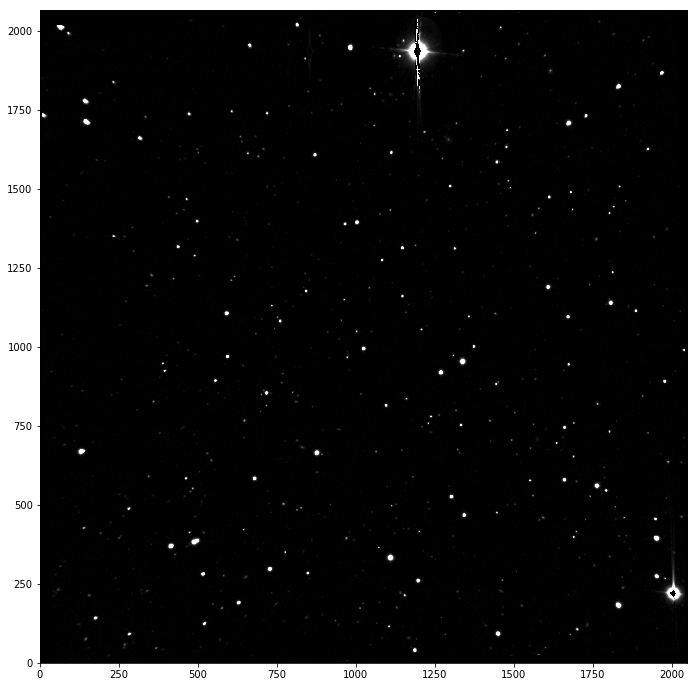

In [7]:
Raw_Datacube.display(Raw_Datacube.stack_field)

In [8]:
# Raw_Datacube.save_fits(save_path='/home/qliu/data/A2390F/',suffix="_nofringe")
Raw_Datacube.save_fits(save_path='/home/qliu/data/A2390F/')

Saving background & fringe subtracted datacube and stacked field...


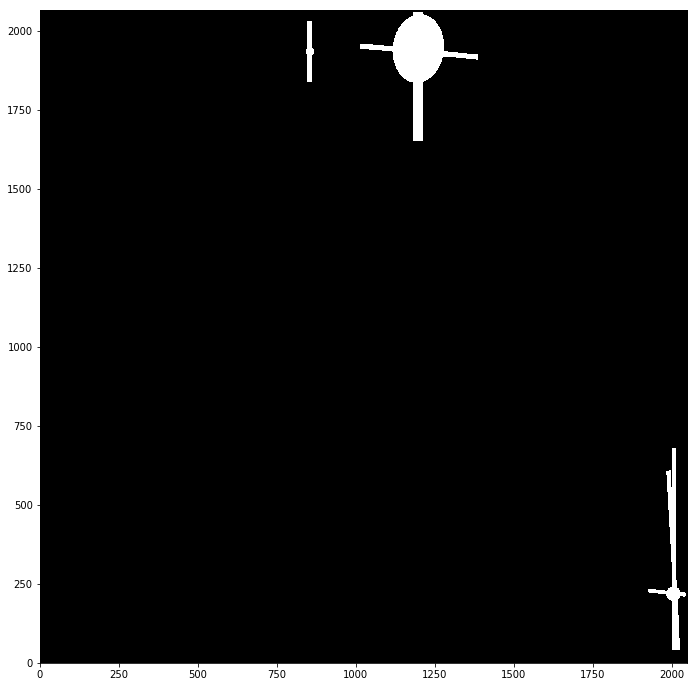

In [9]:
Raw_Datacube.save_weight_map(region_path="./A2390NW/SE/A2390NW.reg", weight=0.01, 
                             save_path = './A2390NW/SE/')
Raw_Datacube.display(Raw_Datacube.mymask,vmax=None)

## 2. Calculate seeing FWHM

In [12]:
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits",name="A2390NW",SE_catalog="./A2390NW/SE/A2390NW_run1.cat")

(array([687.,  82.,  46.,  30.,  77.,  89.,  61.,  27.,  21.,  55.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

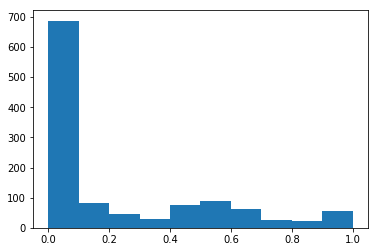

In [23]:
plt.hist(Datacube.Tab_SE["CLASS_STAR"])

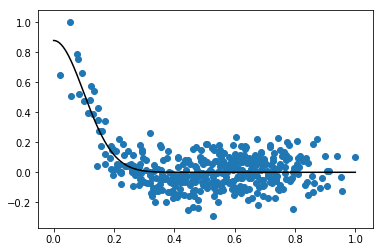

1.1177657634918583


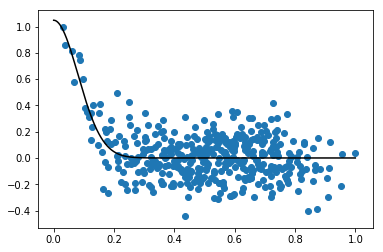

0.9169918187348405


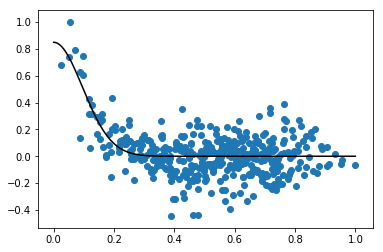

1.0743895297682897


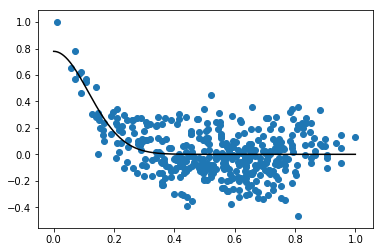

1.2420452029393854


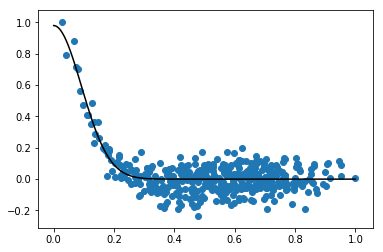

1.010366033412462


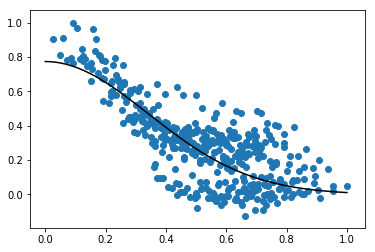

3.8264559759390577


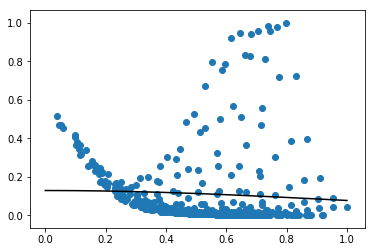

11.024371435788213


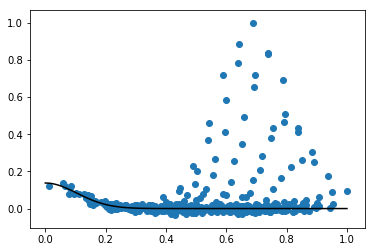

1.1334245256791515


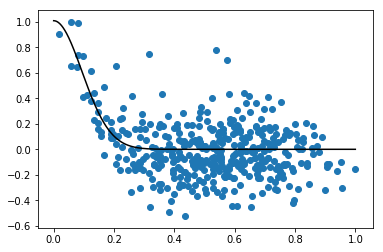

1.056021984343082


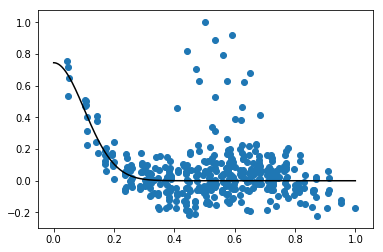

1.1347670243342132


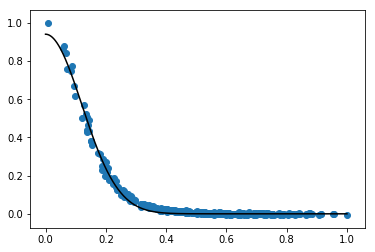

1.4119328823134758


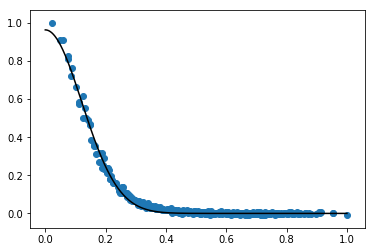

1.3993202029950373


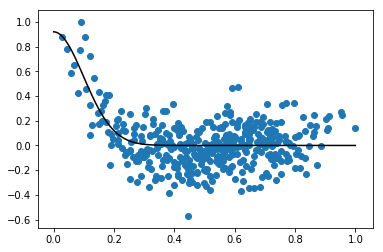

1.1394157793934698


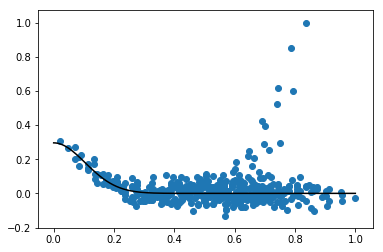

1.1597303785098325


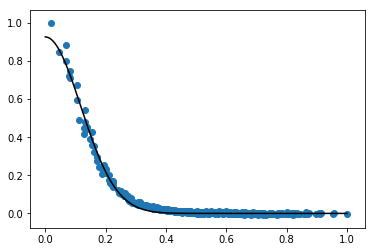

1.3709523197254185


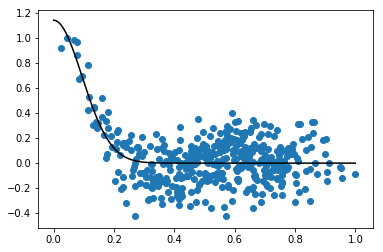

1.0464938311712468


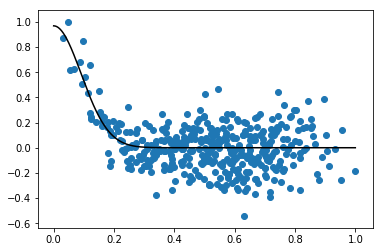

1.0200403611742264


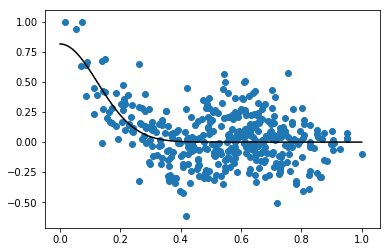

1.352526328519247


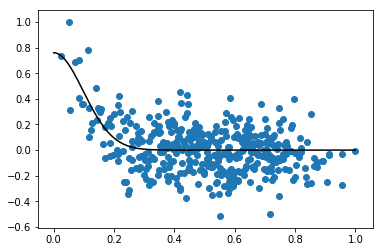

1.130183637550547


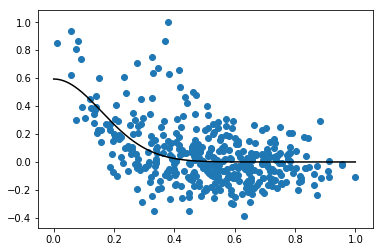

1.8520779873450908


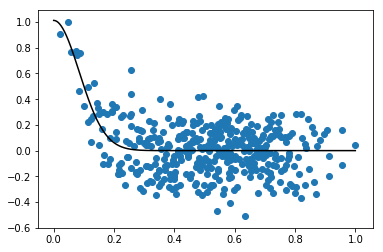

0.9764831656867352


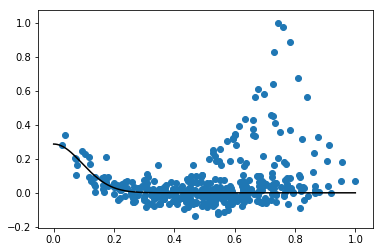

1.0806710932054198


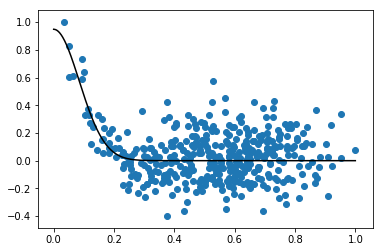

0.9397064894943061


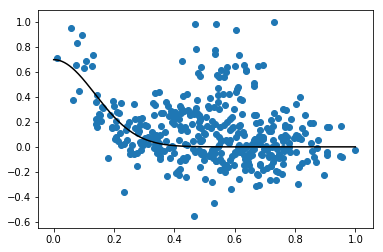

1.5383968084310535


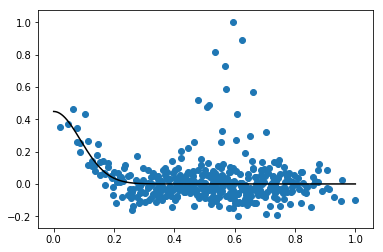

1.008071043806984


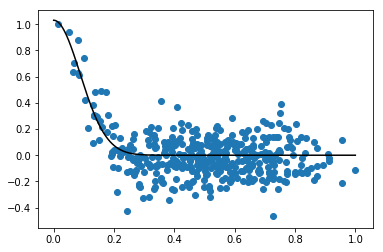

1.0173586287022929


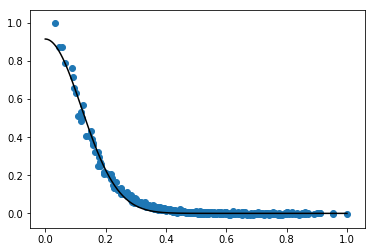

1.3731818079250622


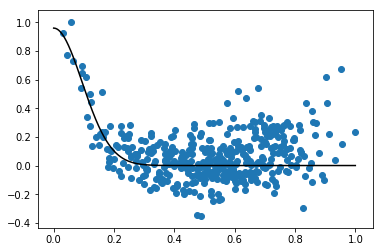

1.0565654227220136


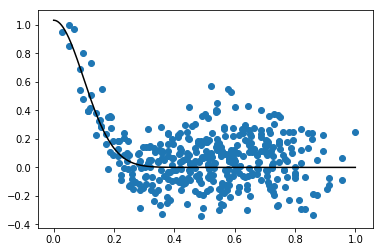

1.1385713268772522


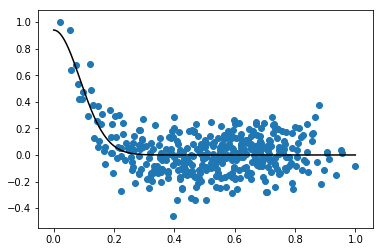

0.9838633559383201


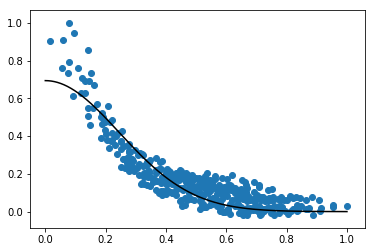

2.8374834871748997


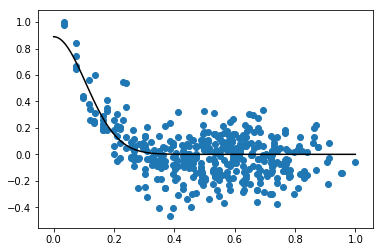

1.2258651614534601


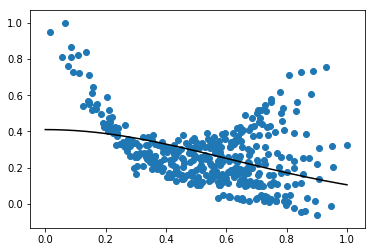

6.597179394306374


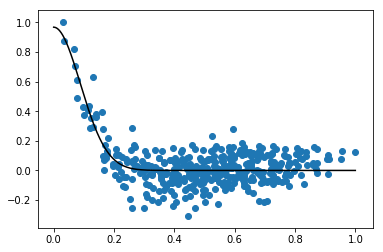

1.015566354309049
Median seeing FWHM in arcsec: 1.134


In [24]:
Datacube.calculate_seeing(mag_cut=1., plot=True)

## 3. Spectra Extraction

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits",name="A2390NW",SE_catalog="./A2390NW/SE/A2390NW_run2.cat")
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE/segment_run2.fits')

In [2]:
Datacube.wavl.shape

(69,)

Optimal Aperture: 1.6 Rp, SNR = 33.4876


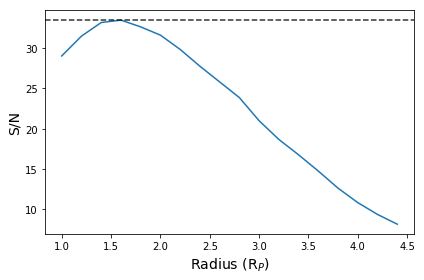

Optimal Aperture: 2.2 Rp, SNR = 11.7153


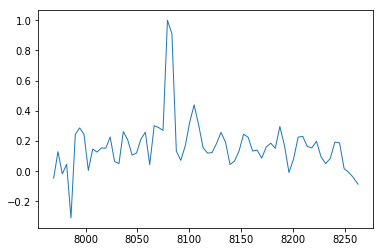

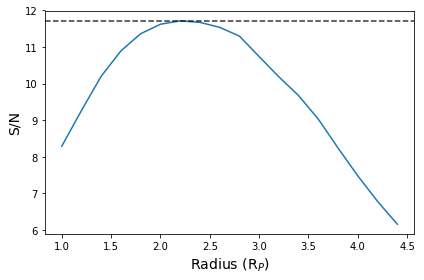

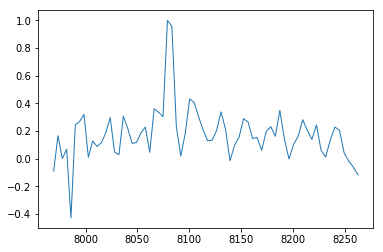

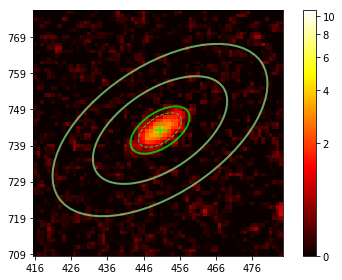

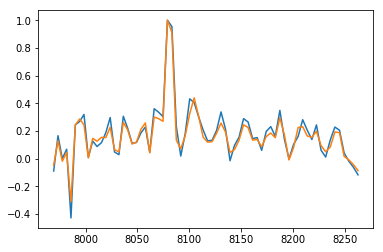

In [6]:
# Example
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=662, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=662, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

In [8]:
# Pipe
Datacube.spec_extraction_all(ks = np.arange(1.,4.6,0.1), k1=5., k2=8., save_path='./A2390NW/fig/img_thumb/', display=True)

#1 spectra extracted
#2 spectra extracted
#3 spectra extracted
#4 spectra extracted
#5 spectra extracted
#6 spectra extracted
#7 spectra extracted
#8 spectra extracted
#9 spectra extracted
#10 spectra extracted
#11 spectra extracted
#12 spectra extracted
#13 spectra extracted
#14 spectra extracted
#15 spectra extracted
#16 spectra extracted
#17 spectra extracted
#18 spectra extracted
#19 spectra extracted
#20 spectra extracted
#21 spectra extracted
#22 spectra extracted
#23 spectra extracted
#24 spectra extracted
#25 spectra extracted
#26 spectra extracted
#27 spectra extracted
#28 spectra extracted
#29 spectra extracted
#30 spectra extracted
#31 spectra extracted
#32 spectra extracted
#33 spectra extracted
#34 spectra extracted
#35 spectra extracted
#36 spectra extracted
#37 spectra extracted
#38 spectra extracted
#39 spectra extracted
#40 spectra extracted
#41 spectra extracted
#42 spectra extracted
#43 spectra extracted
#44 spectra extracted
#45 spectra extracted
#46 spectra extract

#362 spectra extracted
#363 spectra extracted
#364 spectra extracted
#365 spectra extracted
#366 spectra extracted
#367 spectra extracted
#368 spectra extracted
#369 spectra extracted
#370 spectra extracted
#371 spectra extracted
#372 spectra extracted
#373 spectra extracted
#374 spectra extracted
#375 spectra extracted
#376 spectra extracted
#377 spectra extracted
#378 spectra extracted
#379 spectra extracted
#380 spectra extracted
#381 spectra extracted
#382 spectra extracted
#383 spectra extracted
#384 spectra extracted
#385 spectra extracted
#386 spectra extracted
#387 spectra extracted
#388 spectra extracted
#389 spectra extracted
#390 spectra extracted
#391 spectra extracted
#392 spectra extracted
#393 spectra extracted
#394 spectra extracted
#395 spectra extracted
#396 spectra extracted
#397 spectra extracted
#398 spectra extracted
#399 spectra extracted
#400 spectra extracted
#401 spectra extracted
#402 spectra extracted
#403 spectra extracted
#404 spectra extracted
#405 spectr

#719 spectra extracted
#720 spectra extracted
#721 spectra extracted
#722 spectra extracted
#723 spectra extracted
#724 spectra extracted
#725 spectra extracted
#726 spectra extracted
#727 spectra extracted
#728 spectra extracted
#729 spectra extracted
#730 spectra extracted
#731 spectra extracted
#732 spectra extracted
#733 spectra extracted
#734 spectra extracted
#735 spectra extracted
#736 spectra extracted
#737 spectra extracted
#738 spectra extracted
#739 spectra extracted
#740 spectra extracted
#741 spectra extracted
#742 spectra extracted
#743 spectra extracted
#744 spectra extracted
#745 spectra extracted
#746 spectra extracted
#747 spectra extracted
#748 spectra extracted
#749 spectra extracted
#750 spectra extracted
#751 spectra extracted
#752 spectra extracted
#753 spectra extracted
#754 spectra extracted
#755 spectra extracted
#756 spectra extracted
#757 spectra extracted
#758 spectra extracted
#759 spectra extracted
#760 spectra extracted
#761 spectra extracted
#762 spectr

#1073 spectra extracted
#1074 spectra extracted
#1075 spectra extracted
#1076 spectra extracted
#1077 spectra extracted
#1078 spectra extracted
#1079 spectra extracted
#1080 spectra extracted
#1081 spectra extracted
#1082 spectra extracted
#1083 spectra extracted
#1084 spectra extracted
#1085 spectra extracted
#1086 spectra extracted
#1087 spectra extracted
#1088 spectra extracted
#1089 spectra extracted
#1090 spectra extracted
#1091 spectra extracted
#1092 spectra extracted
#1093 spectra extracted
#1094 spectra extracted
#1095 spectra extracted
#1096 spectra extracted
#1097 spectra extracted
#1098 spectra extracted
#1099 spectra extracted
#1100 spectra extracted
#1101 spectra extracted
#1102 spectra extracted
#1103 spectra extracted
#1104 spectra extracted
#1105 spectra extracted
#1106 spectra extracted
#1107 spectra extracted
#1108 spectra extracted
#1109 spectra extracted
#1110 spectra extracted
#1111 spectra extracted
#1112 spectra extracted
#1113 spectra extracted
#1114 spectra ex

#1415 spectra extracted
#1416 spectra extracted
#1417 spectra extracted
#1418 spectra extracted
#1419 spectra extracted
#1420 spectra extracted
#1421 spectra extracted
#1422 spectra extracted
#1423 spectra extracted
#1424 spectra extracted
#1425 spectra extracted
#1426 spectra extracted
#1427 spectra extracted
#1428 spectra extracted
#1429 spectra extracted
#1430 spectra extracted
#1431 spectra extracted
#1432 spectra extracted
#1433 spectra extracted
#1434 spectra extracted
#1435 spectra extracted
#1436 spectra extracted
#1437 spectra extracted
#1438 spectra extracted
#1439 spectra extracted
#1440 spectra extracted
#1441 spectra extracted
#1442 spectra extracted
#1443 spectra extracted
#1444 spectra extracted
#1445 spectra extracted
#1446 spectra extracted
#1447 spectra extracted
#1448 spectra extracted
#1449 spectra extracted
#1450 spectra extracted
#1451 spectra extracted
#1452 spectra extracted
#1453 spectra extracted
#1454 spectra extracted
#1455 spectra extracted
#1456 spectra ex

In [9]:
# Pipe
Datacube.fit_continuum_all(model='GP', plot=True, save_path='./A2390NW/fig/fit_cont/')

#1 spectra continuum fitted
#2 spectra continuum fitted
#3 spectra continuum fitted
#4 spectra continuum fitted
#5 spectra continuum fitted
#6 spectra continuum fitted
#7 spectra continuum fitted
#8 spectra continuum fitted
#9 spectra continuum fitted
#10 spectra continuum fitted
#11 spectra continuum fitted
#12 spectra continuum fitted
#13 spectra continuum fitted
#14 spectra continuum fitted
#15 spectra continuum fitted
#16 spectra continuum fitted
#17 spectra continuum fitted
#18 spectra continuum fitted
#19 spectra continuum fitted
#20 spectra continuum fitted
#21 spectra continuum fitted
#22 spectra continuum fitted
#23 spectra continuum fitted
#24 spectra continuum fitted
#25 spectra continuum fitted
#26 spectra continuum fitted
#27 spectra continuum fitted
#28 spectra continuum fitted
#29 spectra continuum fitted
#30 spectra continuum fitted
#31 spectra continuum fitted
#32 spectra continuum fitted
#33 spectra continuum fitted
#34 spectra continuum fitted
#35 spectra continuum f

#278 spectra continuum fitted
#279 spectra continuum fitted
#280 spectra continuum fitted
#281 spectra continuum fitted
#282 spectra continuum fitted
#283 spectra continuum fitted
#284 spectra continuum fitted
#285 spectra continuum fitted
#286 spectra continuum fitted
#287 spectra continuum fitted
#288 spectra continuum fitted
#289 spectra continuum fitted
#290 spectra continuum fitted
#291 spectra continuum fitted
#292 spectra continuum fitted
#293 spectra continuum fitted
#294 spectra continuum fitted
#295 spectra continuum fitted
#296 spectra continuum fitted
#297 spectra continuum fitted
#298 spectra continuum fitted
#299 spectra continuum fitted
#300 spectra continuum fitted
#301 spectra continuum fitted
#302 spectra continuum fitted
#303 spectra continuum fitted
#304 spectra continuum fitted
#305 spectra continuum fitted
#306 spectra continuum fitted
#307 spectra continuum fitted
#308 spectra continuum fitted
#309 spectra continuum fitted
#310 spectra continuum fitted
#311 spect

#553 spectra continuum fitted
#554 spectra continuum fitted
#555 spectra continuum fitted
#556 spectra continuum fitted
#557 spectra continuum fitted
#558 spectra continuum fitted
#559 spectra continuum fitted
#560 spectra continuum fitted
#561 spectra continuum fitted
#562 spectra continuum fitted
#563 spectra continuum fitted
#564 spectra continuum fitted
#565 spectra continuum fitted
#566 spectra continuum fitted
#567 spectra continuum fitted
#568 spectra continuum fitted
#569 spectra continuum fitted
#570 spectra continuum fitted
#571 spectra continuum fitted
#572 spectra continuum fitted
#573 spectra continuum fitted
#574 spectra continuum fitted
#575 spectra continuum fitted
#576 spectra continuum fitted
#577 spectra continuum fitted
#578 spectra continuum fitted
#579 spectra continuum fitted
#580 spectra continuum fitted
#581 spectra continuum fitted
#582 spectra continuum fitted
#583 spectra continuum fitted
#584 spectra continuum fitted
#585 spectra continuum fitted
#586 spect

#828 spectra continuum fitted
#829 spectra continuum fitted
#830 spectra continuum fitted
#831 spectra continuum fitted
#832 spectra continuum fitted
#833 spectra continuum fitted
#834 spectra continuum fitted
#835 spectra continuum fitted
#836 spectra continuum fitted
#837 spectra continuum fitted
#838 spectra continuum fitted
#839 spectra continuum fitted
#840 spectra continuum fitted
#841 spectra continuum fitted
#842 spectra continuum fitted
#843 spectra continuum fitted
#844 spectra continuum fitted
#845 spectra continuum fitted
#846 spectra continuum fitted
#847 spectra continuum fitted
#848 spectra continuum fitted
#849 spectra continuum fitted
#850 spectra continuum fitted
#851 spectra continuum fitted
#852 spectra continuum fitted
#853 spectra continuum fitted
#854 spectra continuum fitted
#855 spectra continuum fitted
#856 spectra continuum fitted
#857 spectra continuum fitted
#858 spectra continuum fitted
#859 spectra continuum fitted
#860 spectra continuum fitted
#861 spect

#1099 spectra continuum fitted
#1100 spectra continuum fitted
#1101 spectra continuum fitted
#1102 spectra continuum fitted
#1103 spectra continuum fitted
#1104 spectra continuum fitted
#1105 spectra continuum fitted
#1106 spectra continuum fitted
#1107 spectra continuum fitted
#1108 spectra continuum fitted
#1109 spectra continuum fitted
#1110 spectra continuum fitted
#1111 spectra continuum fitted
#1112 spectra continuum fitted
#1113 spectra continuum fitted
#1114 spectra continuum fitted
#1115 spectra continuum fitted
#1116 spectra continuum fitted
#1117 spectra continuum fitted
#1118 spectra continuum fitted
#1119 spectra continuum fitted
#1120 spectra continuum fitted
#1121 spectra continuum fitted
#1122 spectra continuum fitted
#1123 spectra continuum fitted
#1124 spectra continuum fitted
#1125 spectra continuum fitted
#1126 spectra continuum fitted
#1127 spectra continuum fitted
#1128 spectra continuum fitted
#1129 spectra continuum fitted
#1130 spectra continuum fitted
#1131 sp

#1364 spectra continuum fitted
#1365 spectra continuum fitted
#1366 spectra continuum fitted
#1367 spectra continuum fitted
#1368 spectra continuum fitted
#1369 spectra continuum fitted
#1370 spectra continuum fitted
#1371 spectra continuum fitted
#1372 spectra continuum fitted
#1373 spectra continuum fitted
#1374 spectra continuum fitted
#1375 spectra continuum fitted
#1376 spectra continuum fitted
#1377 spectra continuum fitted
#1378 spectra continuum fitted
#1379 spectra continuum fitted
#1380 spectra continuum fitted
#1381 spectra continuum fitted
#1382 spectra continuum fitted
#1383 spectra continuum fitted
#1384 spectra continuum fitted
#1385 spectra continuum fitted
#1386 spectra continuum fitted
#1387 spectra continuum fitted
#1388 spectra continuum fitted
#1389 spectra continuum fitted
#1390 spectra continuum fitted
#1391 spectra continuum fitted
#1392 spectra continuum fitted
#1393 spectra continuum fitted
#1394 spectra continuum fitted
#1395 spectra continuum fitted
#1396 sp

In [10]:
Datacube.save_spec_plot(save_path='./A2390NW/fig/spec/')
Datacube.save_spec_fits(save_path='./A2390NW/', suffix="v1")

## Cross-correlation

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits", name="A2390NW", z0=0.228, 
                         SE_catalog="./A2390NW/SE/A2390NW_run2.cat")
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE/segment_run2.fits')
Datacube.read_spec('./A2390NW/A2390NW-spec_v1.fits')

In [3]:
Datacube.generate_template(n_ratio=20, n_stddev=15, n_intp=2, sigma=4, ratio_range = (1.2, 9),
                           temp_type="Ha-NII", ratio_prior="uniform", temp_model='gauss')
Datacube.generate_template(n_ratio=8, n_stddev=15, n_intp=2, sigma=4, ratio_range = (2., 4.),
                           temp_type="Hb-OIII", ratio_prior="uniform", temp_model='gauss')
Datacube.generate_template(n_ratio=8, n_stddev=15, n_intp=2, sigma=4,
                           temp_type="OII", ratio_prior="uniform", temp_model='gauss')

Template: Ha-NII_gauss  Total Number: 300
Template: Hb-OIII_gauss  Total Number: 120
Template: OII_gauss  Total Number: 15


Best z: 0.22154817744896882 Best sigma: 1.8341303394555193
SE Object #147  z: 0.222  Peak R: 2.825  Detction S/N: 9.060 Peak S/N: 8.750


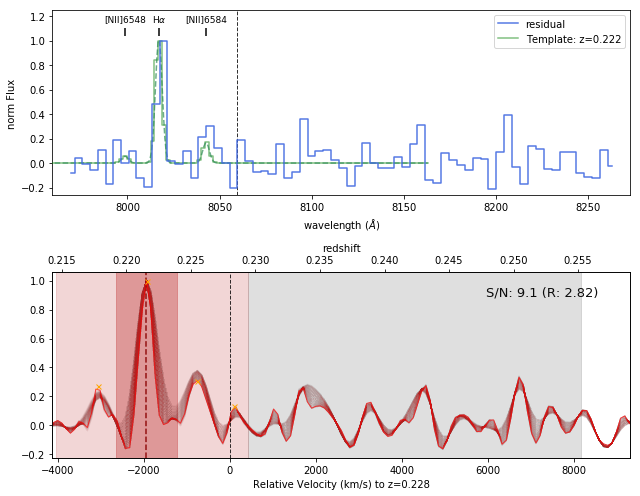

In [8]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(147, temp_type="Ha-NII", temp_model="gauss")

Best z: 0.240596454023625 Best sigma: 5.0015147835707285
SE Object #94  z: 0.241  Peak R: 3.303  Detction S/N: 13.427 Peak S/N: 9.470


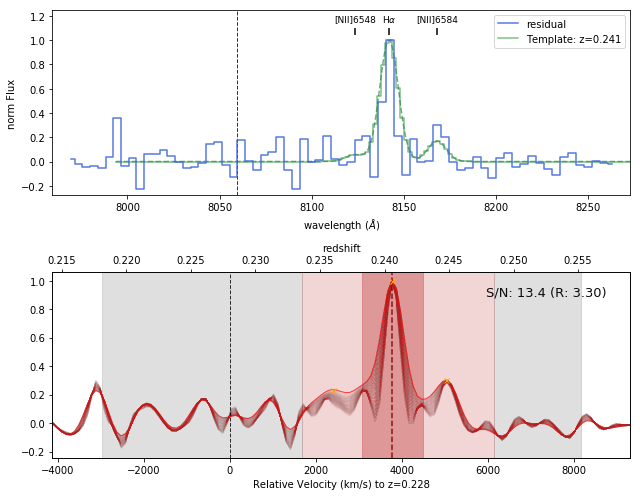

In [33]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(94, temp_type="Ha-NII", temp_model="gauss")

In [9]:
Datacube.cross_correlation_all(temp_type="Ha-NII", temp_model="gauss")  #new library

SE Object #1  z: 0.248  Peak R: 2.866  Detction S/N: 2.511 Peak S/N: 2.321
SE Object #2  z: 0.228  Peak R: 1.054  Detction S/N: 2.445 Peak S/N: 2.252
SE Object #3  z: 0.221  Peak R: 1.352  Detction S/N: 6.807 Peak S/N: 3.502
SE Object #4  z: 0.217  Peak R: 1.687  Detction S/N: 4.846 Peak S/N: 3.822
SE Object #5  z: 0.222  Peak R: 1.545  Detction S/N: 4.550 Peak S/N: 3.715
SE Object #6  z: 0.222  Peak R: 1.116  Detction S/N: 4.353 Peak S/N: 3.412
SE Object #7  z: 0.218  Peak R: 1.490  Detction S/N: 2.962 Peak S/N: 2.703
SE Object #8  z: 0.218  Peak R: 1.691  Detction S/N: 6.362 Peak S/N: 4.883
SE Object #9  z: 0.222  Peak R: 1.083  Detction S/N: 4.899 Peak S/N: 4.182
SE Object #10  z: 0.222  Peak R: 1.704  Detction S/N: 2.962 Peak S/N: 2.728
SE Object #11  z: 0.218  Peak R: 2.158  Detction S/N: 5.027 Peak S/N: 4.070
SE Object #12  z: 0.251  Peak R: 6.028  Detction S/N: 3.049 Peak S/N: 3.157
SE Object #13  z: 0.217  Peak R: 1.583  Detction S/N: 3.887 Peak S/N: 3.612
SE Object #14  z: 0.2

SE Object #109  z: 0.227  Peak R: 5.674  Detction S/N: 9.438 Peak S/N: 9.031
SE Object #110  z: 0.233  Peak R: 1.443  Detction S/N: 3.606 Peak S/N: 3.184
SE Object #111  z: 0.218  Peak R: 1.222  Detction S/N: 4.204 Peak S/N: 3.511
SE Object #112  z: 0.238  Peak R: 1.607  Detction S/N: 5.216 Peak S/N: 4.248
SE Object #113  z: 0.234  Peak R: 1.035  Detction S/N: 2.546 Peak S/N: 2.366
SE Object #114  z: 0.215  Peak R: 1.708  Detction S/N: 4.494 Peak S/N: 3.986
SE Object #115  z: 0.223  Peak R: 1.229  Detction S/N: 3.329 Peak S/N: 3.250
SE Object #116  z: 0.220  Peak R: 4.028  Detction S/N: 3.550 Peak S/N: 3.644
SE Object #117  z: 0.226  Peak R: 2.584  Detction S/N: 3.639 Peak S/N: 3.425
SE Object #118  z: 0.238  Peak R: 1.328  Detction S/N: 3.562 Peak S/N: 3.300
SE Object #119  z: 0.236  Peak R: 1.245  Detction S/N: 4.233 Peak S/N: 3.274
SE Object #120  z: 0.228  Peak R: 1.000  Detction S/N: 4.986 Peak S/N: 4.981
SE Object #121  z: 0.226  Peak R: 2.668  Detction S/N: 3.880 Peak S/N: 3.543

SE Object #217  z: 0.219  Peak R: 3.975  Detction S/N: 5.204 Peak S/N: 5.031
SE Object #218  z: 0.223  Peak R: 2.974  Detction S/N: 7.719 Peak S/N: 7.376
SE Object #219  z: 0.223  Peak R: 2.254  Detction S/N: 3.766 Peak S/N: 3.896
SE Object #220  z: 0.252  Peak R: 1.000  Detction S/N: 3.240 Peak S/N: 3.015
SE Object #221  z: 0.225  Peak R: 1.424  Detction S/N: 10.015 Peak S/N: 5.741
SE Object #222  z: 0.220  Peak R: 1.360  Detction S/N: 2.631 Peak S/N: 2.348
SE Object #223  z: 0.224  Peak R: 1.567  Detction S/N: 4.114 Peak S/N: 3.794
SE Object #224  z: 0.219  Peak R: 2.080  Detction S/N: 3.354 Peak S/N: 3.195
SE Object #225  z: 0.216  Peak R: 2.259  Detction S/N: 6.503 Peak S/N: 5.775
SE Object #226  z: 0.225  Peak R: 3.905  Detction S/N: 2.985 Peak S/N: 3.293
SE Object #227  z: 0.241  Peak R: 1.400  Detction S/N: 3.630 Peak S/N: 3.522
SE Object #228  z: 0.236  Peak R: 9.575  Detction S/N: 2.605 Peak S/N: 2.424
SE Object #229  z: 0.252  Peak R: 1.732  Detction S/N: 5.879 Peak S/N: 6.15

SE Object #325  z: 0.227  Peak R: 3.852  Detction S/N: 4.217 Peak S/N: 4.287
SE Object #326  z: 0.234  Peak R: 1.144  Detction S/N: 2.953 Peak S/N: 2.518
SE Object #327  z: 0.215  Peak R: 2.898  Detction S/N: 4.538 Peak S/N: 3.735
SE Object #328  z: 0.246  Peak R: 1.601  Detction S/N: 3.038 Peak S/N: 2.962
SE Object #329  z: 0.245  Peak R: 4.990  Detction S/N: 3.120 Peak S/N: 3.341
SE Object #330  z: 0.220  Peak R: 1.584  Detction S/N: 5.636 Peak S/N: 4.846
SE Object #331  z: 0.214  Peak R: 1.452  Detction S/N: 4.305 Peak S/N: 3.986
SE Object #332  z: 0.225  Peak R: 1.797  Detction S/N: 4.184 Peak S/N: 3.897
SE Object #333  z: 0.250  Peak R: 1.981  Detction S/N: 4.268 Peak S/N: 3.764
SE Object #334  z: 0.214  Peak R: 1.828  Detction S/N: 5.084 Peak S/N: 4.656
SE Object #335  z: 0.228  Peak R: 1.912  Detction S/N: 3.271 Peak S/N: 3.290
SE Object #336  z: 0.227  Peak R: 1.609  Detction S/N: 3.373 Peak S/N: 3.005
SE Object #337  z: 0.225  Peak R: 1.706  Detction S/N: 3.766 Peak S/N: 2.815

SE Object #433  z: 0.218  Peak R: 3.216  Detction S/N: 4.198 Peak S/N: 3.509
SE Object #434  z: 0.218  Peak R: 1.525  Detction S/N: 2.884 Peak S/N: 2.842
SE Object #435  z: 0.219  Peak R: 1.166  Detction S/N: 1.936 Peak S/N: 1.927
SE Object #436  z: 0.226  Peak R: 4.109  Detction S/N: 7.097 Peak S/N: 7.094
SE Object #437  z: 0.217  Peak R: 2.406  Detction S/N: 5.250 Peak S/N: 5.096
SE Object #438  z: 0.237  Peak R: 3.209  Detction S/N: 3.398 Peak S/N: 3.605
SE Object #439  z: 0.220  Peak R: 4.735  Detction S/N: 3.139 Peak S/N: 3.232
SE Object #440  z: 0.223  Peak R: 1.071  Detction S/N: 2.299 Peak S/N: 2.150
SE Object #441  z: 0.229  Peak R: 9.746  Detction S/N: 2.406 Peak S/N: 2.504
SE Object #442  z: 0.223  Peak R: 1.521  Detction S/N: 3.795 Peak S/N: 3.590
SE Object #443  z: 0.233  Peak R: 1.171  Detction S/N: 1.825 Peak S/N: 1.916
SE Object #444  z: 0.216  Peak R: 4.876  Detction S/N: 4.614 Peak S/N: 4.683
SE Object #445  z: 0.219  Peak R: 5.762  Detction S/N: 3.186 Peak S/N: 3.203

SE Object #540  z: 0.218  Peak R: 1.384  Detction S/N: 4.990 Peak S/N: 4.138
SE Object #541  z: 0.244  Peak R: 1.697  Detction S/N: 2.877 Peak S/N: 1.996
SE Object #542  z: 0.225  Peak R: 1.649  Detction S/N: 2.960 Peak S/N: 2.929
SE Object #543  z: 0.227  Peak R: 7.036  Detction S/N: 2.379 Peak S/N: 2.069
SE Object #544  z: 0.223  Peak R: 9.201  Detction S/N: 2.219 Peak S/N: 1.530
SE Object #545  z: 0.219  Peak R: 1.454  Detction S/N: 3.508 Peak S/N: 3.359
SE Object #546  z: 0.236  Peak R: 2.690  Detction S/N: 3.033 Peak S/N: 3.355
SE Object #547  z: 0.254  Peak R: 1.869  Detction S/N: 2.155 Peak S/N: 2.248
SE Object #548  z: 0.222  Peak R: 1.709  Detction S/N: 2.319 Peak S/N: 2.199
SE Object #549  z: 0.227  Peak R: 1.867  Detction S/N: 7.834 Peak S/N: 5.548
SE Object #550  z: 0.219  Peak R: 2.982  Detction S/N: 4.001 Peak S/N: 4.122
SE Object #551  z: 0.229  Peak R: 1.146  Detction S/N: 3.010 Peak S/N: 2.596
SE Object #552  z: 0.233  Peak R: 4.248  Detction S/N: 2.350 Peak S/N: 2.541

SE Object #648  z: 0.231  Peak R: 1.223  Detction S/N: 1.893 Peak S/N: 2.070
SE Object #649  z: 0.220  Peak R: 1.665  Detction S/N: 4.742 Peak S/N: 4.353
SE Object #650  z: 0.227  Peak R: 3.030  Detction S/N: 1.645 Peak S/N: 1.521
SE Object #651  z: 0.247  Peak R: 1.256  Detction S/N: 1.987 Peak S/N: 2.001
SE Object #652  z: 0.219  Peak R: 2.308  Detction S/N: 4.091 Peak S/N: 3.932
SE Object #653  z: 0.219  Peak R: 6.080  Detction S/N: 2.627 Peak S/N: 2.717
SE Object #654  z: 0.218  Peak R: 2.995  Detction S/N: 3.198 Peak S/N: 3.176
SE Object #655  z: 0.243  Peak R: 1.943  Detction S/N: 2.097 Peak S/N: 2.068
SE Object #656  z: 0.234  Peak R: 2.702  Detction S/N: 4.464 Peak S/N: 3.791
SE Object #657  z: 0.216  Peak R: 7.860  Detction S/N: 12.051 Peak S/N: 12.275
SE Object #658  z: 0.234  Peak R: 1.375  Detction S/N: 2.351 Peak S/N: 2.150
SE Object #659  z: 0.231  Peak R: 1.204  Detction S/N: 2.497 Peak S/N: 2.567
SE Object #660  z: 0.227  Peak R: 1.217  Detction S/N: 2.963 Peak S/N: 2.8

SE Object #755  z: 0.216  Peak R: 2.375  Detction S/N: 5.434 Peak S/N: 5.214
SE Object #756  z: 0.221  Peak R: 1.250  Detction S/N: 3.778 Peak S/N: 3.683
SE Object #757  z: 0.242  Peak R: 2.275  Detction S/N: 2.408 Peak S/N: 1.777
SE Object #758  z: 0.234  Peak R: 5.589  Detction S/N: 6.071 Peak S/N: 6.529
SE Object #759  z: 0.252  Peak R: 2.499  Detction S/N: 2.483 Peak S/N: 2.635
SE Object #760  z: 0.230  Peak R: 1.420  Detction S/N: 2.347 Peak S/N: 2.347
SE Object #761  z: 0.226  Peak R: 1.073  Detction S/N: 3.481 Peak S/N: 2.469
SE Object #762  z: 0.227  Peak R: 1.951  Detction S/N: 1.856 Peak S/N: 1.983
SE Object #763  z: 0.220  Peak R: 1.652  Detction S/N: 2.284 Peak S/N: 2.369
SE Object #764  z: 0.246  Peak R: 1.000  Detction S/N: 3.405 Peak S/N: 2.964
SE Object #765  z: 0.218  Peak R: 1.731  Detction S/N: 3.465 Peak S/N: 3.213
SE Object #766  z: 0.235  Peak R: 1.247  Detction S/N: 2.811 Peak S/N: 2.735
SE Object #767  z: 0.223  Peak R: 1.860  Detction S/N: 1.998 Peak S/N: 1.939

SE Object #863  z: 0.229  Peak R: 1.341  Detction S/N: 2.840 Peak S/N: 2.692
SE Object #864  z: 0.236  Peak R: 1.490  Detction S/N: 2.700 Peak S/N: 2.983
SE Object #865  z: 0.240  Peak R: 1.703  Detction S/N: 2.528 Peak S/N: 2.496
SE Object #866  z: 0.216  Peak R: 1.478  Detction S/N: 4.572 Peak S/N: 4.316
SE Object #867  z: 0.221  Peak R: 7.413  Detction S/N: 1.711 Peak S/N: 1.846
SE Object #868  z: 0.219  Peak R: 2.332  Detction S/N: 9.619 Peak S/N: 7.193
SE Object #869  z: 0.229  Peak R: 1.136  Detction S/N: 3.039 Peak S/N: 2.861
SE Object #870  z: 0.226  Peak R: 1.001  Detction S/N: 3.967 Peak S/N: 3.062
SE Object #871  z: 0.246  Peak R: 2.952  Detction S/N: 4.069 Peak S/N: 3.911
SE Object #872  z: 0.222  Peak R: 1.178  Detction S/N: 2.428 Peak S/N: 2.246
SE Object #873  z: 0.246  Peak R: 1.807  Detction S/N: 1.637 Peak S/N: 1.862
SE Object #874  z: 0.229  Peak R: 6.423  Detction S/N: 3.658 Peak S/N: 3.503
SE Object #875  z: 0.235  Peak R: 1.457  Detction S/N: 2.985 Peak S/N: 2.812

SE Object #971  z: 0.251  Peak R: 1.448  Detction S/N: 2.505 Peak S/N: 2.632
SE Object #972  z: 0.248  Peak R: 1.792  Detction S/N: 4.167 Peak S/N: 3.335
SE Object #973  z: 0.222  Peak R: 1.516  Detction S/N: 3.310 Peak S/N: 3.203
SE Object #974  z: 0.218  Peak R: 1.597  Detction S/N: 4.106 Peak S/N: 3.880
SE Object #975  z: 0.229  Peak R: 2.557  Detction S/N: 3.333 Peak S/N: 3.094
SE Object #976  z: 0.242  Peak R: 1.948  Detction S/N: 3.367 Peak S/N: 3.526
SE Object #977  z: 0.251  Peak R: 2.119  Detction S/N: 2.850 Peak S/N: 2.877
SE Object #978  z: 0.222  Peak R: 2.253  Detction S/N: 3.121 Peak S/N: 3.200
SE Object #979  z: 0.253  Peak R: 2.743  Detction S/N: 6.857 Peak S/N: 6.861
SE Object #980  z: 0.248  Peak R: 1.738  Detction S/N: 3.023 Peak S/N: 2.998
SE Object #981  z: 0.236  Peak R: 7.473  Detction S/N: 3.570 Peak S/N: 3.505
SE Object #982  z: 0.239  Peak R: 1.000  Detction S/N: 3.817 Peak S/N: 3.451
SE Object #983  z: 0.222  Peak R: 1.790  Detction S/N: 3.354 Peak S/N: 3.467

SE Object #1077  z: 0.228  Peak R: 2.096  Detction S/N: 3.265 Peak S/N: 3.460
SE Object #1078  z: 0.225  Peak R: 1.537  Detction S/N: 3.124 Peak S/N: 3.096
SE Object #1079  z: 0.236  Peak R: 1.352  Detction S/N: 3.445 Peak S/N: 2.814
SE Object #1080  z: 0.224  Peak R: 1.658  Detction S/N: 3.684 Peak S/N: 3.372
SE Object #1081  z: 0.233  Peak R: 3.372  Detction S/N: 2.062 Peak S/N: 2.092
SE Object #1082  z: 0.234  Peak R: 3.947  Detction S/N: 3.033 Peak S/N: 3.198
SE Object #1083  z: 0.227  Peak R: 2.536  Detction S/N: 11.850 Peak S/N: 8.280
SE Object #1084  z: 0.249  Peak R: 3.179  Detction S/N: 2.676 Peak S/N: 2.631
SE Object #1085  z: 0.253  Peak R: 4.339  Detction S/N: 3.750 Peak S/N: 3.817
SE Object #1086  z: 0.232  Peak R: 2.345  Detction S/N: 2.656 Peak S/N: 2.656
SE Object #1087  z: 0.225  Peak R: 1.929  Detction S/N: 4.830 Peak S/N: 4.076
SE Object #1088  z: 0.246  Peak R: 3.190  Detction S/N: 1.834 Peak S/N: 1.843
SE Object #1089  z: 0.225  Peak R: 2.614  Detction S/N: 3.576 P

SE Object #1183  z: 0.215  Peak R: 1.477  Detction S/N: 3.930 Peak S/N: 3.851
SE Object #1184  z: 0.220  Peak R: 2.952  Detction S/N: 3.053 Peak S/N: 2.946
SE Object #1185  z: 0.220  Peak R: 2.495  Detction S/N: 2.637 Peak S/N: 2.759
SE Object #1186  z: 0.218  Peak R: 1.269  Detction S/N: 3.108 Peak S/N: 2.949
SE Object #1187  z: 0.240  Peak R: 3.470  Detction S/N: 3.281 Peak S/N: 3.375
SE Object #1188  z: 0.217  Peak R: 1.461  Detction S/N: 2.748 Peak S/N: 2.595
SE Object #1189  z: 0.239  Peak R: 1.157  Detction S/N: 2.771 Peak S/N: 2.508
SE Object #1190  z: 0.238  Peak R: 8.782  Detction S/N: 2.171 Peak S/N: 2.210
SE Object #1191  z: 0.218  Peak R: 1.358  Detction S/N: 4.362 Peak S/N: 3.699
SE Object #1192  z: 0.226  Peak R: 9.283  Detction S/N: 12.322 Peak S/N: 12.601
SE Object #1193  z: 0.248  Peak R: 6.451  Detction S/N: 4.015 Peak S/N: 4.237
SE Object #1194  z: 0.225  Peak R: 2.600  Detction S/N: 3.239 Peak S/N: 3.052
SE Object #1195  z: 0.225  Peak R: 1.095  Detction S/N: 3.231 

SE Object #1288  z: 0.239  Peak R: 1.992  Detction S/N: 4.685 Peak S/N: 4.321
SE Object #1289  z: 0.219  Peak R: 5.968  Detction S/N: 4.358 Peak S/N: 3.293
SE Object #1290  z: 0.220  Peak R: 1.028  Detction S/N: 3.173 Peak S/N: 3.087
SE Object #1291  z: 0.240  Peak R: 1.340  Detction S/N: 2.395 Peak S/N: 2.244
SE Object #1292  z: 0.220  Peak R: 5.808  Detction S/N: 3.536 Peak S/N: 3.385
SE Object #1293  z: 0.221  Peak R: 2.044  Detction S/N: 3.640 Peak S/N: 3.414
SE Object #1294  z: 0.235  Peak R: 1.260  Detction S/N: 2.805 Peak S/N: 2.842
SE Object #1295  z: 0.220  Peak R: 1.869  Detction S/N: 3.178 Peak S/N: 3.099
SE Object #1296  z: 0.250  Peak R: 5.050  Detction S/N: 3.301 Peak S/N: 3.118
SE Object #1297  z: 0.226  Peak R: 4.502  Detction S/N: 2.964 Peak S/N: 2.712
SE Object #1298  z: 0.254  Peak R: 5.416  Detction S/N: 7.341 Peak S/N: 7.575
SE Object #1299  z: 0.255  Peak R: 3.905  Detction S/N: 5.074 Peak S/N: 5.230
SE Object #1300  z: 0.222  Peak R: 1.996  Detction S/N: 2.107 Pe

SE Object #1394  z: 0.250  Peak R: 1.956  Detction S/N: 2.856 Peak S/N: 2.704
SE Object #1395  z: 0.229  Peak R: 4.925  Detction S/N: 1.361 Peak S/N: 1.462
SE Object #1396  z: 0.226  Peak R: 4.186  Detction S/N: 3.342 Peak S/N: 3.606
SE Object #1397  z: 0.238  Peak R: 8.429  Detction S/N: 2.204 Peak S/N: 1.970
SE Object #1398  z: 0.255  Peak R: 3.815  Detction S/N: 3.450 Peak S/N: 3.688
SE Object #1399  z: 0.236  Peak R: 3.614  Detction S/N: 2.369 Peak S/N: 2.432
SE Object #1400  z: 0.233  Peak R: 2.098  Detction S/N: 5.978 Peak S/N: 5.191
SE Object #1401  z: 0.253  Peak R: 5.502  Detction S/N: 2.409 Peak S/N: 2.230
SE Object #1402  z: 0.219  Peak R: 5.901  Detction S/N: 2.917 Peak S/N: 2.780
SE Object #1403  z: 0.230  Peak R: 3.148  Detction S/N: 3.646 Peak S/N: 3.401
SE Object #1404  z: 0.224  Peak R: 1.393  Detction S/N: 2.916 Peak S/N: 2.744
SE Object #1405  z: 0.228  Peak R: 1.157  Detction S/N: 3.495 Peak S/N: 3.353
SE Object #1406  z: 0.216  Peak R: 1.978  Detction S/N: 4.843 Pe

SE Object #1499  z: 0.254  Peak R: 1.377  Detction S/N: 5.022 Peak S/N: 4.738
SE Object #1500  z: 0.229  Peak R: 1.329  Detction S/N: 4.302 Peak S/N: 3.957
SE Object #1501  z: 0.239  Peak R: 1.793  Detction S/N: 3.465 Peak S/N: 3.224
SE Object #1502  z: 0.218  Peak R: 1.994  Detction S/N: 3.433 Peak S/N: 3.305
SE Object #1503  z: 0.253  Peak R: 1.681  Detction S/N: 2.702 Peak S/N: 2.770
SE Object #1504  z: 0.250  Peak R: 4.173  Detction S/N: 2.094 Peak S/N: 2.031
SE Object #1505  z: 0.242  Peak R: 3.225  Detction S/N: 2.683 Peak S/N: 2.776
SE Object #1506  z: 0.240  Peak R: 1.832  Detction S/N: 2.251 Peak S/N: 2.337
SE Object #1507  z: 0.250  Peak R: 7.251  Detction S/N: 2.895 Peak S/N: 2.529
SE Object #1508  z: 0.252  Peak R: 1.865  Detction S/N: 1.946 Peak S/N: 1.809
SE Object #1509  z: 0.252  Peak R: 3.110  Detction S/N: 3.171 Peak S/N: 3.301
SE Object #1510  z: 0.231  Peak R: 9.605  Detction S/N: 2.651 Peak S/N: 2.959
SE Object #1511  z: 0.245  Peak R: 4.893  Detction S/N: 2.933 Pe

In [10]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v1")

Saving cross-correlation results for A2390NW using Ha-NII_gauss templates


In [11]:
Datacube.cross_correlation_all(temp_type="Hb-OIII", temp_model="gauss")  #new library

SE Object #1  z: 0.626  Peak R: 1.302  Detction S/N: 3.698 Peak S/N: 3.698
SE Object #2  z: 0.626  Peak R: 1.441  Detction S/N: 3.608 Peak S/N: 3.608
SE Object #3  z: 0.621  Peak R: 1.608  Detction S/N: 3.707 Peak S/N: 3.707
SE Object #4  z: 0.618  Peak R: 1.944  Detction S/N: 1.742 Peak S/N: 1.742
SE Object #5  z: 0.625  Peak R: 1.339  Detction S/N: 3.001 Peak S/N: 3.001
SE Object #6  z: 0.624  Peak R: 1.073  Detction S/N: 4.283 Peak S/N: 4.283
SE Object #7  z: 0.625  Peak R: 1.092  Detction S/N: 1.680 Peak S/N: 1.680
SE Object #8  z: 0.617  Peak R: 3.598  Detction S/N: 3.723 Peak S/N: 3.723
SE Object #9  z: 0.624  Peak R: 1.071  Detction S/N: 2.442 Peak S/N: 2.442
SE Object #10  z: 0.641  Peak R: 1.378  Detction S/N: 2.939 Peak S/N: 2.939
SE Object #11  z: 0.649  Peak R: 3.397  Detction S/N: 1.114 Peak S/N: 1.114
SE Object #12  z: 0.640  Peak R: 3.947  Detction S/N: 4.118 Peak S/N: 4.118
SE Object #13  z: 0.646  Peak R: 1.336  Detction S/N: 2.664 Peak S/N: 2.664
SE Object #14  z: 0.6

SE Object #109  z: 0.643  Peak R: 1.000  Detction S/N: 1.831 Peak S/N: 1.831
SE Object #110  z: 0.637  Peak R: 1.064  Detction S/N: 6.078 Peak S/N: 6.078
SE Object #111  z: 0.625  Peak R: 1.527  Detction S/N: 2.012 Peak S/N: 2.012
SE Object #112  z: 0.622  Peak R: 4.746  Detction S/N: 4.965 Peak S/N: 4.965
SE Object #113  z: 0.619  Peak R: 1.108  Detction S/N: 3.437 Peak S/N: 3.437
SE Object #114  z: 0.646  Peak R: 1.074  Detction S/N: 2.723 Peak S/N: 2.723
SE Object #115  z: 0.618  Peak R: 1.000  Detction S/N: 3.410 Peak S/N: 3.410
SE Object #116  z: 0.643  Peak R: 2.078  Detction S/N: 3.470 Peak S/N: 3.470
SE Object #117  z: 0.626  Peak R: 1.211  Detction S/N: 3.324 Peak S/N: 3.324
SE Object #118  z: 0.622  Peak R: 1.832  Detction S/N: 3.523 Peak S/N: 3.523
SE Object #119  z: 0.620  Peak R: 1.269  Detction S/N: 5.284 Peak S/N: 5.284
SE Object #120  z: 0.625  Peak R: 2.830  Detction S/N: 2.898 Peak S/N: 2.898
SE Object #121  z: 0.649  Peak R: 1.000  Detction S/N: 5.349 Peak S/N: 5.349

SE Object #216  z: 0.638  Peak R: 5.323  Detction S/N: 4.771 Peak S/N: 4.771
SE Object #217  z: 0.615  Peak R: 2.000  Detction S/N: 2.636 Peak S/N: 2.636
SE Object #218  z: 0.626  Peak R: 1.732  Detction S/N: 3.492 Peak S/N: 3.492
SE Object #219  z: 0.622  Peak R: 1.481  Detction S/N: 2.225 Peak S/N: 2.225
SE Object #220  z: 0.641  Peak R: 2.057  Detction S/N: 4.680 Peak S/N: 4.680
SE Object #221  z: 0.622  Peak R: 1.576  Detction S/N: 3.482 Peak S/N: 3.482
SE Object #222  z: 0.648  Peak R: 1.000  Detction S/N: 3.808 Peak S/N: 3.808
SE Object #223  z: 0.631  Peak R: 1.405  Detction S/N: 2.677 Peak S/N: 2.677
SE Object #224  z: 0.614  Peak R: 5.198  Detction S/N: 2.378 Peak S/N: 2.378
SE Object #225  z: 0.637  Peak R: 3.415  Detction S/N: 4.196 Peak S/N: 4.196
SE Object #226  z: 0.630  Peak R: 1.723  Detction S/N: 2.948 Peak S/N: 2.948
SE Object #227  z: 0.627  Peak R: 4.514  Detction S/N: 4.882 Peak S/N: 4.882
SE Object #228  z: 0.642  Peak R: 1.899  Detction S/N: 3.287 Peak S/N: 3.287

SE Object #325  z: 0.625  Peak R: 1.650  Detction S/N: 5.027 Peak S/N: 5.027
SE Object #326  z: 0.646  Peak R: 1.036  Detction S/N: 2.536 Peak S/N: 2.536
SE Object #327  z: 0.622  Peak R: 1.468  Detction S/N: 2.604 Peak S/N: 2.604
SE Object #328  z: 0.633  Peak R: 1.547  Detction S/N: 3.286 Peak S/N: 3.286
SE Object #329  z: 0.647  Peak R: 1.006  Detction S/N: 4.679 Peak S/N: 4.679
SE Object #330  z: 0.615  Peak R: 1.799  Detction S/N: 3.894 Peak S/N: 3.894
SE Object #331  z: 0.625  Peak R: 3.099  Detction S/N: 3.247 Peak S/N: 3.247
SE Object #332  z: 0.637  Peak R: 1.436  Detction S/N: 3.779 Peak S/N: 3.779
SE Object #333  z: 0.639  Peak R: 2.502  Detction S/N: 3.832 Peak S/N: 3.832
SE Object #334  z: 0.641  Peak R: 1.125  Detction S/N: 3.759 Peak S/N: 3.759
SE Object #335  z: 0.624  Peak R: 2.578  Detction S/N: 4.776 Peak S/N: 4.776
SE Object #336  z: 0.639  Peak R: 1.211  Detction S/N: 3.912 Peak S/N: 3.912
SE Object #337  z: 0.621  Peak R: 2.887  Detction S/N: 1.937 Peak S/N: 1.937

SE Object #434  z: 0.618  Peak R: 1.002  Detction S/N: 3.269 Peak S/N: 3.269
SE Object #435  z: 0.623  Peak R: 1.083  Detction S/N: 1.918 Peak S/N: 1.918
SE Object #436  z: 0.626  Peak R: 1.318  Detction S/N: 3.176 Peak S/N: 3.176
SE Object #437  z: 0.623  Peak R: 4.217  Detction S/N: 2.783 Peak S/N: 2.783
SE Object #438  z: 0.621  Peak R: 1.627  Detction S/N: 4.232 Peak S/N: 4.232
SE Object #439  z: 0.626  Peak R: 1.206  Detction S/N: 2.567 Peak S/N: 2.567
SE Object #440  z: 0.625  Peak R: 1.260  Detction S/N: 2.724 Peak S/N: 2.724
SE Object #441  z: 0.640  Peak R: 2.896  Detction S/N: 2.639 Peak S/N: 2.639
SE Object #442  z: 0.619  Peak R: 1.010  Detction S/N: 3.863 Peak S/N: 3.863
SE Object #443  z: 0.643  Peak R: 1.462  Detction S/N: 1.768 Peak S/N: 1.768
SE Object #444  z: 0.625  Peak R: 1.630  Detction S/N: 2.385 Peak S/N: 2.385
SE Object #445  z: 0.641  Peak R: 1.332  Detction S/N: 3.304 Peak S/N: 3.304
SE Object #446  z: 0.615  Peak R: 7.762  Detction S/N: 10.745 Peak S/N: 10.7

SE Object #542  z: 0.626  Peak R: 1.628  Detction S/N: 3.343 Peak S/N: 3.343
SE Object #543  z: 0.644  Peak R: 1.213  Detction S/N: 1.922 Peak S/N: 1.922
SE Object #544  z: 0.643  Peak R: 1.779  Detction S/N: 3.222 Peak S/N: 3.222
SE Object #545  z: 0.622  Peak R: 1.117  Detction S/N: 2.460 Peak S/N: 2.460
SE Object #546  z: 0.620  Peak R: 1.207  Detction S/N: 5.065 Peak S/N: 5.065
SE Object #547  z: 0.643  Peak R: 1.124  Detction S/N: 2.809 Peak S/N: 2.809
SE Object #548  z: 0.621  Peak R: 1.375  Detction S/N: 1.635 Peak S/N: 1.635
SE Object #549  z: 0.625  Peak R: 1.527  Detction S/N: 2.701 Peak S/N: 2.701
SE Object #550  z: 0.635  Peak R: 1.181  Detction S/N: 2.117 Peak S/N: 2.117
SE Object #551  z: 0.615  Peak R: 3.130  Detction S/N: 3.211 Peak S/N: 3.211
SE Object #552  z: 0.632  Peak R: 1.250  Detction S/N: 3.398 Peak S/N: 3.398
SE Object #553  z: 0.650  Peak R: 1.003  Detction S/N: 3.671 Peak S/N: 3.671
SE Object #554  z: 0.621  Peak R: 1.167  Detction S/N: 3.352 Peak S/N: 3.352

SE Object #650  z: 0.646  Peak R: 1.004  Detction S/N: 2.592 Peak S/N: 2.592
SE Object #651  z: 0.627  Peak R: 1.488  Detction S/N: 2.900 Peak S/N: 2.900
SE Object #652  z: 0.613  Peak R: 4.256  Detction S/N: 3.553 Peak S/N: 3.553
SE Object #653  z: 0.629  Peak R: 1.196  Detction S/N: 3.112 Peak S/N: 3.112
SE Object #654  z: 0.634  Peak R: 1.530  Detction S/N: 2.540 Peak S/N: 2.540
SE Object #655  z: 0.629  Peak R: 1.362  Detction S/N: 3.114 Peak S/N: 3.114
SE Object #656  z: 0.626  Peak R: 1.114  Detction S/N: 3.973 Peak S/N: 3.973
SE Object #657  z: 0.615  Peak R: 1.683  Detction S/N: 2.915 Peak S/N: 2.915
SE Object #658  z: 0.641  Peak R: 1.133  Detction S/N: 3.478 Peak S/N: 3.478
SE Object #659  z: 0.614  Peak R: 1.609  Detction S/N: 3.544 Peak S/N: 3.544
SE Object #660  z: 0.643  Peak R: 3.179  Detction S/N: 2.752 Peak S/N: 2.752
SE Object #661  z: 0.632  Peak R: 1.364  Detction S/N: 3.682 Peak S/N: 3.682
SE Object #662  z: 0.629  Peak R: 2.978  Detction S/N: 4.530 Peak S/N: 4.530

SE Object #758  z: 0.633  Peak R: 1.271  Detction S/N: 3.246 Peak S/N: 3.246
SE Object #759  z: 0.618  Peak R: 1.002  Detction S/N: 3.842 Peak S/N: 3.842
SE Object #760  z: 0.616  Peak R: 1.544  Detction S/N: 2.324 Peak S/N: 2.324
SE Object #761  z: 0.625  Peak R: 1.135  Detction S/N: 3.847 Peak S/N: 3.847
SE Object #762  z: 0.629  Peak R: 1.977  Detction S/N: 3.393 Peak S/N: 3.393
SE Object #763  z: 0.622  Peak R: 1.402  Detction S/N: 2.928 Peak S/N: 2.928
SE Object #764  z: 0.633  Peak R: 1.309  Detction S/N: 3.726 Peak S/N: 3.726
SE Object #765  z: 0.648  Peak R: 1.630  Detction S/N: 1.702 Peak S/N: 1.702
SE Object #766  z: 0.618  Peak R: 1.000  Detction S/N: 4.952 Peak S/N: 4.952
SE Object #767  z: 0.642  Peak R: 1.225  Detction S/N: 2.167 Peak S/N: 2.167
SE Object #768  z: 0.621  Peak R: 1.113  Detction S/N: 2.879 Peak S/N: 2.879
SE Object #769  z: 0.630  Peak R: 1.930  Detction S/N: 4.817 Peak S/N: 4.817
SE Object #770  z: 0.626  Peak R: 1.305  Detction S/N: 3.231 Peak S/N: 3.231

SE Object #866  z: 0.624  Peak R: 4.629  Detction S/N: 2.961 Peak S/N: 2.961
SE Object #867  z: 0.620  Peak R: 1.664  Detction S/N: 2.465 Peak S/N: 2.465
SE Object #868  z: 0.641  Peak R: 2.075  Detction S/N: 2.186 Peak S/N: 2.186
SE Object #869  z: 0.644  Peak R: 1.087  Detction S/N: 4.079 Peak S/N: 4.079
SE Object #870  z: 0.642  Peak R: 1.674  Detction S/N: 5.468 Peak S/N: 5.468
SE Object #871  z: 0.633  Peak R: 1.473  Detction S/N: 4.605 Peak S/N: 4.605
SE Object #872  z: 0.639  Peak R: 1.565  Detction S/N: 2.476 Peak S/N: 2.476
SE Object #873  z: 0.634  Peak R: 1.402  Detction S/N: 3.085 Peak S/N: 3.085
SE Object #874  z: 0.634  Peak R: 1.201  Detction S/N: 3.198 Peak S/N: 3.198
SE Object #875  z: 0.618  Peak R: 8.383  Detction S/N: 2.485 Peak S/N: 2.485
SE Object #876  z: 0.638  Peak R: 1.380  Detction S/N: 3.509 Peak S/N: 3.509
SE Object #877  z: 0.619  Peak R: 1.002  Detction S/N: 4.653 Peak S/N: 4.653
SE Object #878  z: 0.624  Peak R: 1.954  Detction S/N: 5.818 Peak S/N: 5.818

SE Object #974  z: 0.640  Peak R: 1.498  Detction S/N: 3.676 Peak S/N: 3.676
SE Object #975  z: 0.620  Peak R: 1.549  Detction S/N: 2.974 Peak S/N: 2.974
SE Object #976  z: 0.644  Peak R: 1.023  Detction S/N: 4.309 Peak S/N: 4.309
SE Object #977  z: 0.639  Peak R: 7.195  Detction S/N: 3.293 Peak S/N: 3.293
SE Object #978  z: 0.641  Peak R: 1.046  Detction S/N: 4.952 Peak S/N: 4.952
SE Object #979  z: 0.642  Peak R: 5.528  Detction S/N: 7.492 Peak S/N: 7.492
SE Object #980  z: 0.636  Peak R: 1.435  Detction S/N: 4.071 Peak S/N: 4.071
SE Object #981  z: 0.620  Peak R: 1.616  Detction S/N: 5.363 Peak S/N: 5.363
SE Object #982  z: 0.623  Peak R: 3.288  Detction S/N: 6.005 Peak S/N: 6.005
SE Object #983  z: 0.628  Peak R: 1.780  Detction S/N: 3.882 Peak S/N: 3.882
SE Object #984  z: 0.625  Peak R: 2.453  Detction S/N: 2.896 Peak S/N: 2.896
SE Object #985  z: 0.621  Peak R: 1.654  Detction S/N: 5.263 Peak S/N: 5.263
SE Object #986  z: 0.620  Peak R: 2.024  Detction S/N: 3.425 Peak S/N: 3.425

SE Object #1082  z: 0.644  Peak R: 1.219  Detction S/N: 4.293 Peak S/N: 4.293
SE Object #1083  z: 0.625  Peak R: 1.092  Detction S/N: 4.627 Peak S/N: 4.627
SE Object #1084  z: 0.638  Peak R: 1.193  Detction S/N: 2.615 Peak S/N: 2.615
SE Object #1085  z: 0.642  Peak R: 4.338  Detction S/N: 6.029 Peak S/N: 6.029
SE Object #1086  z: 0.615  Peak R: 1.735  Detction S/N: 2.858 Peak S/N: 2.858
SE Object #1087  z: 0.615  Peak R: 3.155  Detction S/N: 2.940 Peak S/N: 2.940
SE Object #1088  z: 0.643  Peak R: 3.248  Detction S/N: 2.863 Peak S/N: 2.863
SE Object #1089  z: 0.645  Peak R: 1.004  Detction S/N: 3.694 Peak S/N: 3.694
SE Object #1090  z: 0.633  Peak R: 1.255  Detction S/N: 3.470 Peak S/N: 3.470
SE Object #1091  z: 0.648  Peak R: 1.000  Detction S/N: 3.073 Peak S/N: 3.073
SE Object #1092  z: 0.627  Peak R: 1.215  Detction S/N: 4.094 Peak S/N: 4.094
SE Object #1093  z: 0.643  Peak R: 1.416  Detction S/N: 2.469 Peak S/N: 2.469
SE Object #1094  z: 0.648  Peak R: 1.000  Detction S/N: 2.676 Pe

SE Object #1190  z: 0.621  Peak R: 2.749  Detction S/N: 2.967 Peak S/N: 2.967
SE Object #1191  z: 0.620  Peak R: 1.153  Detction S/N: 4.137 Peak S/N: 4.137
SE Object #1192  z: 0.624  Peak R: 1.602  Detction S/N: 4.768 Peak S/N: 4.768
SE Object #1193  z: 0.637  Peak R: 7.770  Detction S/N: 6.623 Peak S/N: 6.623
SE Object #1194  z: 0.633  Peak R: 1.052  Detction S/N: 3.676 Peak S/N: 3.676
SE Object #1195  z: 0.629  Peak R: 1.330  Detction S/N: 3.154 Peak S/N: 3.154
SE Object #1196  z: 0.621  Peak R: 1.288  Detction S/N: 2.529 Peak S/N: 2.529
SE Object #1197  z: 0.630  Peak R: 1.667  Detction S/N: 2.529 Peak S/N: 2.529
SE Object #1198  z: 0.623  Peak R: 2.207  Detction S/N: 3.577 Peak S/N: 3.577
SE Object #1199  z: 0.625  Peak R: 1.700  Detction S/N: 2.954 Peak S/N: 2.954
SE Object #1200  z: 0.640  Peak R: 1.244  Detction S/N: 2.584 Peak S/N: 2.584
SE Object #1201  z: 0.617  Peak R: 3.425  Detction S/N: 2.887 Peak S/N: 2.887
SE Object #1202  z: 0.620  Peak R: 1.199  Detction S/N: 4.705 Pe

SE Object #1298  z: 0.643  Peak R: 3.877  Detction S/N: 10.442 Peak S/N: 10.442
SE Object #1299  z: 0.645  Peak R: 1.002  Detction S/N: 6.868 Peak S/N: 6.868
SE Object #1300  z: 0.630  Peak R: 1.576  Detction S/N: 2.904 Peak S/N: 2.904
SE Object #1301  z: 0.643  Peak R: 1.495  Detction S/N: 2.688 Peak S/N: 2.688
SE Object #1302  z: 0.632  Peak R: 2.035  Detction S/N: 3.919 Peak S/N: 3.919
SE Object #1303  z: 0.627  Peak R: 1.734  Detction S/N: 2.805 Peak S/N: 2.805
SE Object #1304  z: 0.622  Peak R: 1.088  Detction S/N: 6.489 Peak S/N: 6.489
SE Object #1305  z: 0.622  Peak R: 2.108  Detction S/N: 2.790 Peak S/N: 2.790
SE Object #1306  z: 0.623  Peak R: 3.227  Detction S/N: 1.592 Peak S/N: 1.592
SE Object #1307  z: 0.630  Peak R: 1.254  Detction S/N: 3.266 Peak S/N: 3.266
SE Object #1308  z: 0.643  Peak R: 1.636  Detction S/N: 3.400 Peak S/N: 3.400
SE Object #1309  z: 0.640  Peak R: 5.571  Detction S/N: 4.112 Peak S/N: 4.112
SE Object #1310  z: 0.624  Peak R: 1.330  Detction S/N: 4.083 

SE Object #1405  z: 0.643  Peak R: 1.308  Detction S/N: 3.771 Peak S/N: 3.771
SE Object #1406  z: 0.641  Peak R: 1.469  Detction S/N: 3.582 Peak S/N: 3.582
SE Object #1407  z: 0.625  Peak R: 1.172  Detction S/N: 3.426 Peak S/N: 3.426
SE Object #1408  z: 0.640  Peak R: 2.321  Detction S/N: 5.991 Peak S/N: 5.991
SE Object #1409  z: 0.622  Peak R: 1.436  Detction S/N: 3.224 Peak S/N: 3.224
SE Object #1410  z: 0.639  Peak R: 9.944  Detction S/N: 3.348 Peak S/N: 3.348
SE Object #1411  z: 0.640  Peak R: 1.867  Detction S/N: 2.549 Peak S/N: 2.549
SE Object #1412  z: 0.635  Peak R: 1.447  Detction S/N: 3.287 Peak S/N: 3.287
SE Object #1413  z: 0.639  Peak R: 1.875  Detction S/N: 3.340 Peak S/N: 3.340
SE Object #1414  z: 0.645  Peak R: 1.028  Detction S/N: 3.021 Peak S/N: 3.021
SE Object #1415  z: 0.621  Peak R: 1.050  Detction S/N: 3.405 Peak S/N: 3.405
SE Object #1416  z: 0.622  Peak R: 1.323  Detction S/N: 3.931 Peak S/N: 3.931
SE Object #1417  z: 0.639  Peak R: 1.571  Detction S/N: 2.116 Pe

SE Object #1512  z: 0.635  Peak R: 9.923  Detction S/N: 3.210 Peak S/N: 3.210
SE Object #1513  z: 0.646  Peak R: 1.001  Detction S/N: 4.316 Peak S/N: 4.316
SE Object #1514  z: 0.645  Peak R: 1.126  Detction S/N: 2.173 Peak S/N: 2.173
SE Object #1515  z: 0.632  Peak R: 1.626  Detction S/N: 3.165 Peak S/N: 3.165
SE Object #1516  z: 0.642  Peak R: 1.277  Detction S/N: 3.492 Peak S/N: 3.492
SE Object #1517  z: 0.615  Peak R: 1.854  Detction S/N: 3.144 Peak S/N: 3.144
SE Object #1518  z: 0.632  Peak R: 1.383  Detction S/N: 2.919 Peak S/N: 2.919
SE Object #1519  z: 0.617  Peak R: 1.357  Detction S/N: 1.938 Peak S/N: 1.938
SE Object #1520  z: 0.633  Peak R: 2.585  Detction S/N: 5.903 Peak S/N: 5.903
SE Object #1521  z: 0.638  Peak R: 1.094  Detction S/N: 3.742 Peak S/N: 3.742
SE Object #1522  z: 0.642  Peak R: 2.441  Detction S/N: 6.169 Peak S/N: 6.169
SE Object #1523  z: 0.625  Peak R: 1.178  Detction S/N: 2.231 Peak S/N: 2.231
SE Object #1524  z: 0.648  Peak R: 1.003  Detction S/N: 2.514 Pe

In [12]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v1")

Saving cross-correlation results for A2390NW using Hb-OIII_gauss templates


In [8]:
Datacube.cross_correlation_all(temp_type="OII", temp_model="gauss")  #new library

SE Object #1  z: 1.200  Peak R: 1.000  Detction S/N: 4.041 Peak S/N: 4.041
SE Object #2  z: 1.200  Peak R: 1.000  Detction S/N: 3.843 Peak S/N: 3.843
SE Object #3  z: 1.145  Peak R: 1.000  Detction S/N: 4.842 Peak S/N: 4.842
SE Object #4  z: 1.153  Peak R: 1.000  Detction S/N: 4.879 Peak S/N: 4.879
SE Object #5  z: 1.151  Peak R: 1.000  Detction S/N: 4.340 Peak S/N: 4.340
SE Object #6  z: 1.149  Peak R: 1.000  Detction S/N: 6.135 Peak S/N: 6.135
SE Object #7  z: 1.150  Peak R: 1.000  Detction S/N: 15.476 Peak S/N: 15.476
SE Object #8  z: 1.172  Peak R: 1.000  Detction S/N: 13.501 Peak S/N: 13.501
SE Object #9  z: 1.153  Peak R: 1.000  Detction S/N: 4.245 Peak S/N: 4.245
SE Object #10  z: 1.160  Peak R: 1.000  Detction S/N: 2.506 Peak S/N: 2.506
SE Object #11  z: 1.165  Peak R: 1.000  Detction S/N: 3.704 Peak S/N: 3.704
SE Object #12  z: 1.163  Peak R: 1.000  Detction S/N: 5.609 Peak S/N: 5.609
SE Object #13  z: 1.149  Peak R: 1.000  Detction S/N: 4.227 Peak S/N: 4.227
SE Object #14  z:

SE Object #129  z: 1.150  Peak R: 1.000  Detction S/N: 4.664 Peak S/N: 4.664
SE Object #130  z: 1.149  Peak R: 1.000  Detction S/N: 2.145 Peak S/N: 2.145
SE Object #131  z: 1.159  Peak R: 1.000  Detction S/N: 2.704 Peak S/N: 2.704
SE Object #132  z: 1.154  Peak R: 1.000  Detction S/N: 3.563 Peak S/N: 3.563
SE Object #133  z: 1.151  Peak R: 1.000  Detction S/N: 4.775 Peak S/N: 4.775
SE Object #134  z: 1.141  Peak R: 1.000  Detction S/N: 3.924 Peak S/N: 3.924
SE Object #135  z: 1.149  Peak R: 1.000  Detction S/N: 4.300 Peak S/N: 4.300
SE Object #136  z: 1.179  Peak R: 1.000  Detction S/N: 3.045 Peak S/N: 3.045
SE Object #137  z: 1.141  Peak R: 1.000  Detction S/N: 3.868 Peak S/N: 3.868
SE Object #138  z: 1.204  Peak R: 1.000  Detction S/N: 3.604 Peak S/N: 3.604
SE Object #139  z: 1.145  Peak R: 1.000  Detction S/N: 4.420 Peak S/N: 4.420
SE Object #140  z: 1.162  Peak R: 1.000  Detction S/N: 2.453 Peak S/N: 2.453
SE Object #141  z: 1.146  Peak R: 1.000  Detction S/N: 2.645 Peak S/N: 2.645

SE Object #260  z: 1.168  Peak R: 1.000  Detction S/N: 6.778 Peak S/N: 6.778
SE Object #261  z: 1.182  Peak R: 1.000  Detction S/N: 2.821 Peak S/N: 2.821
SE Object #262  z: 1.151  Peak R: 1.000  Detction S/N: 2.932 Peak S/N: 2.932
SE Object #263  z: 1.162  Peak R: 1.000  Detction S/N: 3.186 Peak S/N: 3.186
SE Object #264  z: 1.141  Peak R: 1.000  Detction S/N: 3.337 Peak S/N: 3.337
SE Object #265  z: 1.212  Peak R: 1.000  Detction S/N: 3.986 Peak S/N: 3.986
SE Object #266  z: 1.179  Peak R: 1.000  Detction S/N: 3.812 Peak S/N: 3.812
SE Object #267  z: 1.167  Peak R: 1.000  Detction S/N: 3.949 Peak S/N: 3.949
SE Object #268  z: 1.179  Peak R: 1.000  Detction S/N: 2.686 Peak S/N: 2.686
SE Object #269  z: 1.142  Peak R: 1.000  Detction S/N: 3.516 Peak S/N: 3.516
SE Object #270  z: 1.141  Peak R: 1.000  Detction S/N: 6.395 Peak S/N: 6.395
SE Object #271  z: 1.189  Peak R: 1.000  Detction S/N: 3.769 Peak S/N: 3.769
SE Object #272  z: 1.149  Peak R: 1.000  Detction S/N: 2.742 Peak S/N: 2.742

SE Object #369  z: 1.184  Peak R: 1.000  Detction S/N: 3.324 Peak S/N: 3.324
SE Object #370  z: 1.160  Peak R: 1.000  Detction S/N: 3.743 Peak S/N: 3.743
SE Object #371  z: 1.160  Peak R: 1.000  Detction S/N: 5.390 Peak S/N: 5.390
SE Object #372  z: 1.145  Peak R: 1.000  Detction S/N: 3.003 Peak S/N: 3.003
SE Object #373  z: 1.159  Peak R: 1.000  Detction S/N: 2.546 Peak S/N: 2.546
SE Object #374  z: 1.141  Peak R: 1.000  Detction S/N: 3.411 Peak S/N: 3.411
SE Object #375  z: 1.148  Peak R: 1.000  Detction S/N: 2.798 Peak S/N: 2.798
SE Object #376  z: 1.148  Peak R: 1.000  Detction S/N: 2.809 Peak S/N: 2.809
SE Object #377  z: 1.182  Peak R: 1.000  Detction S/N: 3.810 Peak S/N: 3.810
SE Object #378  z: 1.165  Peak R: 1.000  Detction S/N: 18.290 Peak S/N: 18.290
SE Object #379  z: 1.209  Peak R: 1.000  Detction S/N: 2.568 Peak S/N: 2.568
SE Object #380  z: 1.163  Peak R: 1.000  Detction S/N: 2.225 Peak S/N: 2.225
SE Object #381  z: 1.148  Peak R: 1.000  Detction S/N: 5.496 Peak S/N: 5.4

SE Object #485  z: 1.141  Peak R: 1.000  Detction S/N: 7.989 Peak S/N: 7.989
SE Object #486  z: 1.141  Peak R: 1.000  Detction S/N: 4.497 Peak S/N: 4.497
SE Object #487  z: 1.148  Peak R: 1.000  Detction S/N: 4.305 Peak S/N: 4.305
SE Object #488  z: 1.142  Peak R: 1.000  Detction S/N: 11.396 Peak S/N: 11.396
SE Object #489  z: 1.148  Peak R: 1.000  Detction S/N: 2.781 Peak S/N: 2.781
SE Object #490  z: 1.149  Peak R: 1.000  Detction S/N: 3.938 Peak S/N: 3.938
SE Object #491  z: 1.211  Peak R: 1.000  Detction S/N: 4.134 Peak S/N: 4.134
SE Object #492  z: 1.149  Peak R: 1.000  Detction S/N: 3.152 Peak S/N: 3.152
SE Object #493  z: 1.166  Peak R: 1.000  Detction S/N: 2.762 Peak S/N: 2.762
SE Object #494  z: 1.159  Peak R: 1.000  Detction S/N: 2.540 Peak S/N: 2.540
SE Object #495  z: 1.143  Peak R: 1.000  Detction S/N: 7.421 Peak S/N: 7.421
SE Object #496  z: 1.214  Peak R: 1.000  Detction S/N: 3.118 Peak S/N: 3.118
SE Object #497  z: 1.147  Peak R: 1.000  Detction S/N: 3.879 Peak S/N: 3.8

SE Object #602  z: 1.161  Peak R: 1.000  Detction S/N: 3.236 Peak S/N: 3.236
SE Object #603  z: 1.148  Peak R: 1.000  Detction S/N: 4.885 Peak S/N: 4.885
SE Object #604  z: 1.197  Peak R: 1.000  Detction S/N: 2.613 Peak S/N: 2.613
SE Object #605  z: 1.153  Peak R: 1.000  Detction S/N: 2.512 Peak S/N: 2.512
SE Object #606  z: 1.146  Peak R: 1.000  Detction S/N: 3.952 Peak S/N: 3.952
SE Object #607  z: 1.205  Peak R: 1.000  Detction S/N: 2.910 Peak S/N: 2.910
SE Object #608  z: 1.188  Peak R: 1.000  Detction S/N: 5.063 Peak S/N: 5.063
SE Object #609  z: 1.165  Peak R: 1.000  Detction S/N: 3.063 Peak S/N: 3.063
SE Object #610  z: 1.167  Peak R: 1.000  Detction S/N: 2.305 Peak S/N: 2.305
SE Object #611  z: 1.150  Peak R: 1.000  Detction S/N: 2.675 Peak S/N: 2.675
SE Object #612  z: 1.157  Peak R: 1.000  Detction S/N: 3.200 Peak S/N: 3.200
SE Object #613  z: 1.146  Peak R: 1.000  Detction S/N: 3.050 Peak S/N: 3.050
SE Object #614  z: 1.141  Peak R: 1.000  Detction S/N: 3.885 Peak S/N: 3.885

SE Object #729  z: 1.141  Peak R: 1.000  Detction S/N: 3.129 Peak S/N: 3.129
SE Object #730  z: 1.141  Peak R: 1.000  Detction S/N: 7.397 Peak S/N: 7.397
SE Object #731  z: 1.184  Peak R: 1.000  Detction S/N: 2.542 Peak S/N: 2.542
SE Object #732  z: 1.212  Peak R: 1.000  Detction S/N: 3.216 Peak S/N: 3.216
SE Object #733  z: 1.165  Peak R: 1.000  Detction S/N: 3.475 Peak S/N: 3.475
SE Object #734  z: 1.163  Peak R: 1.000  Detction S/N: 3.126 Peak S/N: 3.126
SE Object #735  z: 1.141  Peak R: 1.000  Detction S/N: 4.603 Peak S/N: 4.603
SE Object #736  z: 1.160  Peak R: 1.000  Detction S/N: 3.277 Peak S/N: 3.277
SE Object #737  z: 1.164  Peak R: 1.000  Detction S/N: 3.744 Peak S/N: 3.744
SE Object #738  z: 1.141  Peak R: 1.000  Detction S/N: 3.180 Peak S/N: 3.180
SE Object #739  z: 1.138  Peak R: 1.000  Detction S/N: 3.019 Peak S/N: 3.019
SE Object #740  z: 1.148  Peak R: 1.000  Detction S/N: 4.238 Peak S/N: 4.238
SE Object #741  z: 1.142  Peak R: 1.000  Detction S/N: 6.636 Peak S/N: 6.636

SE Object #853  z: 1.145  Peak R: 1.000  Detction S/N: 3.758 Peak S/N: 3.758
SE Object #854  z: 1.141  Peak R: 1.000  Detction S/N: 3.463 Peak S/N: 3.463
SE Object #855  z: 1.181  Peak R: 1.000  Detction S/N: 2.940 Peak S/N: 2.940
SE Object #856  z: 1.157  Peak R: 1.000  Detction S/N: 3.277 Peak S/N: 3.277
SE Object #857  z: 1.181  Peak R: 1.000  Detction S/N: 1.902 Peak S/N: 1.902
SE Object #858  z: 1.164  Peak R: 1.000  Detction S/N: 3.809 Peak S/N: 3.809
SE Object #859  z: 1.156  Peak R: 1.000  Detction S/N: 3.039 Peak S/N: 3.039
SE Object #860  z: 1.166  Peak R: 1.000  Detction S/N: 2.631 Peak S/N: 2.631
SE Object #861  z: 1.147  Peak R: 1.000  Detction S/N: 3.910 Peak S/N: 3.910
SE Object #862  z: 1.148  Peak R: 1.000  Detction S/N: 2.381 Peak S/N: 2.381
SE Object #863  z: 1.142  Peak R: 1.000  Detction S/N: 3.868 Peak S/N: 3.868
SE Object #864  z: 1.145  Peak R: 1.000  Detction S/N: 4.593 Peak S/N: 4.593
SE Object #865  z: 1.147  Peak R: 1.000  Detction S/N: 3.540 Peak S/N: 3.540

SE Object #973  z: 1.150  Peak R: 1.000  Detction S/N: 6.004 Peak S/N: 6.004
SE Object #974  z: 1.142  Peak R: 1.000  Detction S/N: 4.020 Peak S/N: 4.020
SE Object #975  z: 1.145  Peak R: 1.000  Detction S/N: 2.656 Peak S/N: 2.656
SE Object #976  z: 1.145  Peak R: 1.000  Detction S/N: 3.396 Peak S/N: 3.396
SE Object #977  z: 1.158  Peak R: 1.000  Detction S/N: 2.317 Peak S/N: 2.317
SE Object #978  z: 1.148  Peak R: 1.000  Detction S/N: 2.442 Peak S/N: 2.442
SE Object #979  z: 1.177  Peak R: 1.000  Detction S/N: 2.802 Peak S/N: 2.802
SE Object #980  z: 1.142  Peak R: 1.000  Detction S/N: 6.466 Peak S/N: 6.466
SE Object #981  z: 1.208  Peak R: 1.000  Detction S/N: 3.289 Peak S/N: 3.289
SE Object #982  z: 1.158  Peak R: 1.000  Detction S/N: 4.885 Peak S/N: 4.885
SE Object #983  z: 1.173  Peak R: 1.000  Detction S/N: 3.652 Peak S/N: 3.652
SE Object #984  z: 1.203  Peak R: 1.000  Detction S/N: 2.680 Peak S/N: 2.680
SE Object #985  z: 1.149  Peak R: 1.000  Detction S/N: 3.585 Peak S/N: 3.585

SE Object #1080  z: 1.144  Peak R: 1.000  Detction S/N: 4.508 Peak S/N: 4.508
SE Object #1081  z: 1.144  Peak R: 1.000  Detction S/N: 4.056 Peak S/N: 4.056
SE Object #1082  z: 1.201  Peak R: 1.000  Detction S/N: 2.403 Peak S/N: 2.403
SE Object #1083  z: 1.160  Peak R: 1.000  Detction S/N: 3.413 Peak S/N: 3.413
SE Object #1084  z: 1.186  Peak R: 1.000  Detction S/N: 2.972 Peak S/N: 2.972
SE Object #1085  z: 1.186  Peak R: 1.000  Detction S/N: 3.615 Peak S/N: 3.615
SE Object #1086  z: 1.153  Peak R: 1.000  Detction S/N: 2.717 Peak S/N: 2.717
SE Object #1087  z: 1.152  Peak R: 1.000  Detction S/N: 2.402 Peak S/N: 2.402
SE Object #1088  z: 1.166  Peak R: 1.000  Detction S/N: 2.631 Peak S/N: 2.631
SE Object #1089  z: 1.181  Peak R: 1.000  Detction S/N: 3.091 Peak S/N: 3.091
SE Object #1090  z: 1.168  Peak R: 1.000  Detction S/N: 3.591 Peak S/N: 3.591
SE Object #1091  z: 1.181  Peak R: 1.000  Detction S/N: 2.987 Peak S/N: 2.987
SE Object #1092  z: 1.152  Peak R: 1.000  Detction S/N: 4.543 Pe

SE Object #1196  z: 1.149  Peak R: 1.000  Detction S/N: 2.723 Peak S/N: 2.723
SE Object #1197  z: 1.147  Peak R: 1.000  Detction S/N: 2.502 Peak S/N: 2.502
SE Object #1198  z: 1.187  Peak R: 1.000  Detction S/N: 2.375 Peak S/N: 2.375
SE Object #1199  z: 1.164  Peak R: 1.000  Detction S/N: 3.031 Peak S/N: 3.031
SE Object #1200  z: 1.174  Peak R: 1.000  Detction S/N: 3.898 Peak S/N: 3.898
SE Object #1201  z: 1.202  Peak R: 1.000  Detction S/N: 2.581 Peak S/N: 2.581
SE Object #1202  z: 1.147  Peak R: 1.000  Detction S/N: 3.016 Peak S/N: 3.016
SE Object #1203  z: 1.145  Peak R: 1.000  Detction S/N: 8.170 Peak S/N: 8.170
SE Object #1204  z: 1.146  Peak R: 1.000  Detction S/N: 3.428 Peak S/N: 3.428
SE Object #1205  z: 1.155  Peak R: 1.000  Detction S/N: 5.374 Peak S/N: 5.374
SE Object #1206  z: 1.166  Peak R: 1.000  Detction S/N: 2.334 Peak S/N: 2.334
SE Object #1207  z: 1.145  Peak R: 1.000  Detction S/N: 3.640 Peak S/N: 3.640
SE Object #1208  z: 1.146  Peak R: 1.000  Detction S/N: 4.928 Pe

SE Object #1312  z: 1.206  Peak R: 1.000  Detction S/N: 3.328 Peak S/N: 3.328
SE Object #1313  z: 1.162  Peak R: 1.000  Detction S/N: 4.844 Peak S/N: 4.844
SE Object #1314  z: 1.205  Peak R: 1.000  Detction S/N: 4.219 Peak S/N: 4.219
SE Object #1315  z: 1.194  Peak R: 1.000  Detction S/N: 2.679 Peak S/N: 2.679
SE Object #1316  z: 1.152  Peak R: 1.000  Detction S/N: 2.614 Peak S/N: 2.614
SE Object #1317  z: 1.144  Peak R: 1.000  Detction S/N: 3.905 Peak S/N: 3.905
SE Object #1318  z: 1.161  Peak R: 1.000  Detction S/N: 2.423 Peak S/N: 2.423
SE Object #1319  z: 1.173  Peak R: 1.000  Detction S/N: 2.915 Peak S/N: 2.915
SE Object #1320  z: 1.147  Peak R: 1.000  Detction S/N: 3.643 Peak S/N: 3.643
SE Object #1321  z: 1.185  Peak R: 1.000  Detction S/N: 3.222 Peak S/N: 3.222
SE Object #1322  z: 1.188  Peak R: 1.000  Detction S/N: 5.104 Peak S/N: 5.104
SE Object #1323  z: 1.178  Peak R: 1.000  Detction S/N: 2.517 Peak S/N: 2.517
SE Object #1324  z: 1.172  Peak R: 1.000  Detction S/N: 3.980 Pe

SE Object #1427  z: 1.160  Peak R: 1.000  Detction S/N: 2.297 Peak S/N: 2.297
SE Object #1428  z: 1.178  Peak R: 1.000  Detction S/N: 2.320 Peak S/N: 2.320
SE Object #1429  z: 1.171  Peak R: 1.000  Detction S/N: 2.799 Peak S/N: 2.799
SE Object #1430  z: 1.182  Peak R: 1.000  Detction S/N: 3.003 Peak S/N: 3.003
SE Object #1431  z: 1.208  Peak R: 1.000  Detction S/N: 4.594 Peak S/N: 4.594
SE Object #1432  z: 1.183  Peak R: 1.000  Detction S/N: 3.668 Peak S/N: 3.668
SE Object #1433  z: 1.188  Peak R: 1.000  Detction S/N: 2.166 Peak S/N: 2.166
SE Object #1434  z: 1.159  Peak R: 1.000  Detction S/N: 3.250 Peak S/N: 3.250
SE Object #1435  z: 1.190  Peak R: 1.000  Detction S/N: 2.955 Peak S/N: 2.955
SE Object #1436  z: 1.163  Peak R: 1.000  Detction S/N: 2.076 Peak S/N: 2.076
SE Object #1437  z: 1.201  Peak R: 1.000  Detction S/N: 3.456 Peak S/N: 3.456
SE Object #1438  z: 1.152  Peak R: 1.000  Detction S/N: 3.419 Peak S/N: 3.419
SE Object #1439  z: 1.175  Peak R: 1.000  Detction S/N: 3.056 Pe

SE Object #1536  z: 1.201  Peak R: 1.000  Detction S/N: 2.710 Peak S/N: 2.710
SE Object #1537  z: 1.159  Peak R: 1.000  Detction S/N: 37.492 Peak S/N: 37.492
SE Object #1538  z: 1.203  Peak R: 1.000  Detction S/N: 3.112 Peak S/N: 3.112
SE Object #1539  z: 1.205  Peak R: 1.000  Detction S/N: 4.247 Peak S/N: 4.247
SE Object #1540  z: 1.214  Peak R: 1.000  Detction S/N: 3.007 Peak S/N: 3.007
SE Object #1541  z: 1.168  Peak R: 1.000  Detction S/N: 2.807 Peak S/N: 2.807
SE Object #1542  z: 1.148  Peak R: 1.000  Detction S/N: 3.120 Peak S/N: 3.120
SE Object #1543  z: 1.148  Peak R: 1.000  Detction S/N: 2.913 Peak S/N: 2.913
SE Object #1544  z: 1.168  Peak R: 1.000  Detction S/N: 2.925 Peak S/N: 2.925
SE Object #1545  z: 1.160  Peak R: 1.000  Detction S/N: 4.644 Peak S/N: 4.644
SE Object #1546  z: 1.160  Peak R: 1.000  Detction S/N: 2.900 Peak S/N: 2.900
SE Object #1547  z: 1.213  Peak R: 1.000  Detction S/N: 4.971 Peak S/N: 4.971
SE Object #1548  z: 1.183  Peak R: 1.000  Detction S/N: 3.722 

SE Object #1647  z: 1.179  Peak R: 1.000  Detction S/N: 2.645 Peak S/N: 2.645
SE Object #1648  z: 1.205  Peak R: 1.000  Detction S/N: 2.880 Peak S/N: 2.880
SE Object #1649  z: 1.209  Peak R: 1.000  Detction S/N: 2.615 Peak S/N: 2.615
SE Object #1650  z: 1.179  Peak R: 1.000  Detction S/N: 3.643 Peak S/N: 3.643
SE Object #1651  z: 1.155  Peak R: 1.000  Detction S/N: 2.966 Peak S/N: 2.966
SE Object #1652  z: 1.146  Peak R: 1.000  Detction S/N: 5.956 Peak S/N: 5.956
SE Object #1653  z: 1.180  Peak R: 1.000  Detction S/N: 2.068 Peak S/N: 2.068
SE Object #1654  z: 1.142  Peak R: 1.000  Detction S/N: 3.850 Peak S/N: 3.850
SE Object #1655  z: 1.200  Peak R: 1.000  Detction S/N: 3.414 Peak S/N: 3.414
SE Object #1656  z: 1.205  Peak R: 1.000  Detction S/N: 2.259 Peak S/N: 2.259
SE Object #1657  z: 1.209  Peak R: 1.000  Detction S/N: 2.970 Peak S/N: 2.970
SE Object #1658  z: 1.164  Peak R: 1.000  Detction S/N: 3.984 Peak S/N: 3.984
SE Object #1659  z: 1.152  Peak R: 1.000  Detction S/N: 3.131 Pe

SE Object #1753  z: 1.180  Peak R: 1.000  Detction S/N: 4.504 Peak S/N: 4.504
SE Object #1754  z: 1.168  Peak R: 1.000  Detction S/N: 2.191 Peak S/N: 2.191
SE Object #1755  z: 1.216  Peak R: 1.000  Detction S/N: 2.236 Peak S/N: 2.236
SE Object #1756  z: 1.155  Peak R: 1.000  Detction S/N: 2.782 Peak S/N: 2.782
SE Object #1757  z: 1.148  Peak R: 1.000  Detction S/N: 2.685 Peak S/N: 2.685
SE Object #1758  z: 1.187  Peak R: 1.000  Detction S/N: 2.060 Peak S/N: 2.060
SE Object #1759  z: 1.146  Peak R: 1.000  Detction S/N: 2.948 Peak S/N: 2.948
SE Object #1760  z: 1.184  Peak R: 1.000  Detction S/N: 2.977 Peak S/N: 2.977
SE Object #1761  z: 1.150  Peak R: 1.000  Detction S/N: 2.300 Peak S/N: 2.300
SE Object #1762  z: 1.155  Peak R: 1.000  Detction S/N: 4.259 Peak S/N: 4.259
SE Object #1763  z: 1.193  Peak R: 1.000  Detction S/N: 2.604 Peak S/N: 2.604
SE Object #1764  z: 1.138  Peak R: 1.000  Detction S/N: 2.516 Peak S/N: 2.516
SE Object #1765  z: 1.200  Peak R: 1.000  Detction S/N: 3.008 Pe

SE Object #1871  z: 1.207  Peak R: 1.000  Detction S/N: 2.577 Peak S/N: 2.577
SE Object #1872  z: 1.156  Peak R: 1.000  Detction S/N: 4.968 Peak S/N: 4.968
SE Object #1873  z: 1.163  Peak R: 1.000  Detction S/N: 3.425 Peak S/N: 3.425
SE Object #1874  z: 1.213  Peak R: 1.000  Detction S/N: 2.680 Peak S/N: 2.680
SE Object #1875  z: 1.152  Peak R: 1.000  Detction S/N: 4.975 Peak S/N: 4.975
SE Object #1876  z: 1.145  Peak R: 1.000  Detction S/N: 3.394 Peak S/N: 3.394
SE Object #1877  z: 1.149  Peak R: 1.000  Detction S/N: 3.483 Peak S/N: 3.483
SE Object #1878  z: 1.146  Peak R: 1.000  Detction S/N: 5.201 Peak S/N: 5.201
SE Object #1879  z: 1.149  Peak R: 1.000  Detction S/N: 4.101 Peak S/N: 4.101
SE Object #1880  z: 1.189  Peak R: 1.000  Detction S/N: 2.726 Peak S/N: 2.726
SE Object #1881  z: 1.164  Peak R: 1.000  Detction S/N: 3.243 Peak S/N: 3.243
SE Object #1882  z: 1.177  Peak R: 1.000  Detction S/N: 3.096 Peak S/N: 3.096
SE Object #1883  z: 1.165  Peak R: 1.000  Detction S/N: 2.749 Pe

SE Object #1983  z: 1.206  Peak R: 1.000  Detction S/N: 2.702 Peak S/N: 2.702
SE Object #1984  z: 1.149  Peak R: 1.000  Detction S/N: 3.572 Peak S/N: 3.572
SE Object #1985  z: 1.176  Peak R: 1.000  Detction S/N: 2.806 Peak S/N: 2.806
SE Object #1986  z: 1.149  Peak R: 1.000  Detction S/N: 1.897 Peak S/N: 1.897
SE Object #1987  z: 1.201  Peak R: 1.000  Detction S/N: 2.569 Peak S/N: 2.569
SE Object #1988  z: 1.158  Peak R: 1.000  Detction S/N: 3.706 Peak S/N: 3.706
SE Object #1989  z: 1.152  Peak R: 1.000  Detction S/N: 6.338 Peak S/N: 6.338
SE Object #1990  z: 1.205  Peak R: 1.000  Detction S/N: 3.621 Peak S/N: 3.621
SE Object #1991  z: 1.148  Peak R: 1.000  Detction S/N: 4.700 Peak S/N: 4.700
SE Object #1992  z: 1.167  Peak R: 1.000  Detction S/N: 2.682 Peak S/N: 2.682
SE Object #1993  z: 1.161  Peak R: 1.000  Detction S/N: 2.810 Peak S/N: 2.810
SE Object #1994  z: 1.177  Peak R: 1.000  Detction S/N: 2.512 Peak S/N: 2.512
SE Object #1995  z: 1.161  Peak R: 1.000  Detction S/N: 2.889 Pe

SE Object #2091  z: 1.171  Peak R: 1.000  Detction S/N: 3.587 Peak S/N: 3.587
SE Object #2092  z: 1.186  Peak R: 1.000  Detction S/N: 2.776 Peak S/N: 2.776
SE Object #2093  z: 1.165  Peak R: 1.000  Detction S/N: 2.126 Peak S/N: 2.126
SE Object #2094  z: 1.142  Peak R: 1.000  Detction S/N: 3.931 Peak S/N: 3.931
SE Object #2095  z: 1.160  Peak R: 1.000  Detction S/N: 2.630 Peak S/N: 2.630
SE Object #2096  z: 1.162  Peak R: 1.000  Detction S/N: 2.493 Peak S/N: 2.493
SE Object #2097  z: 1.147  Peak R: 1.000  Detction S/N: 3.501 Peak S/N: 3.501
SE Object #2098  z: 1.155  Peak R: 1.000  Detction S/N: 5.323 Peak S/N: 5.323
SE Object #2099  z: 1.189  Peak R: 1.000  Detction S/N: 6.056 Peak S/N: 6.056
SE Object #2100  z: 1.181  Peak R: 1.000  Detction S/N: 4.857 Peak S/N: 4.857
SE Object #2101  z: 1.178  Peak R: 1.000  Detction S/N: 2.845 Peak S/N: 2.845
SE Object #2102  z: 1.146  Peak R: 1.000  Detction S/N: 5.430 Peak S/N: 5.430
SE Object #2103  z: 1.146  Peak R: 1.000  Detction S/N: 5.513 Pe

In [9]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v1")

Saving cross-correlation results for A2390SE using OII_gauss templates


/home/qliu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/qliu/anaconda3/lib/python3.6/site-packages/astropy/table/column.py:965: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, op)(other)


146

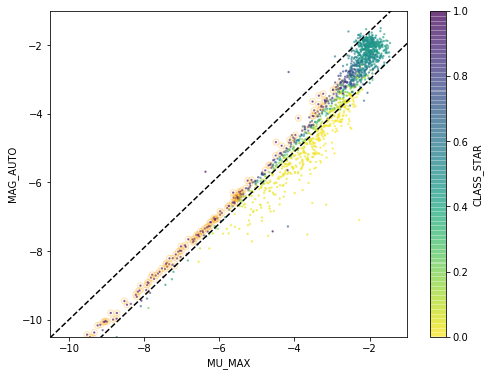

In [18]:
# Star cond
plt.figure(figsize=(8,6))
mag_auto = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
plt.scatter(Datacube.Tab_SE["MU_MAX"], mag_auto,
            c = Datacube.Tab_SE["CLASS_STAR"], s=2, cmap='viridis_r', alpha=0.5)

xx = np.linspace(-10.5,-1,100)
plt.plot(xx, 1.05*xx-0.9, 'k--', xx, 1.05*xx+0.5, 'k--')
plt.xlabel("MU_MAX")
plt.ylabel("MAG_AUTO")
plt.xlim(-10.5,-1.)
plt.ylim(-10.5,-1.)
cb = plt.colorbar()
cb.set_label("CLASS_STAR")

star_cond = ((abs(mag_auto-1.05*Datacube.Tab_SE["MU_MAX"]  + 0.2))<0.7) & (Datacube.Tab_SE['CLASS_STAR']>0.9)
plt.scatter(Datacube.Tab_SE["MU_MAX"][star_cond], mag_auto[star_cond],facecolors='none',color='orange',alpha=0.3)
np.sum(star_cond)

In [14]:
Y_pix, X_pix = np.indices(Datacube.mask_edge.shape)
dist_edge = np.array([np.sqrt((X_pix[~Datacube.mask_edge]-gal["X_IMAGE"])**2 + \
                              (Y_pix[~Datacube.mask_edge]-gal["Y_IMAGE"])**2).min() \
                      for gal in Datacube.Tab_SE])

47
79
6.1316345396457095
4.879670010370831


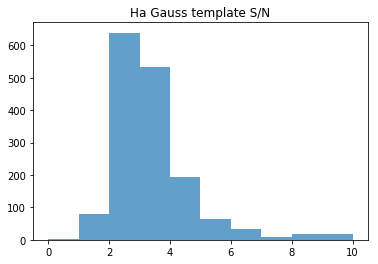

In [21]:
# Gaussian library Ha template (New CC method)
inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
SNRp_best_Ha = np.array([Datacube.CC_SNR_ps_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])

plt.hist(SNR_best_Ha,range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("Ha Gauss template S/N")

cond0 = (SNR_best_Ha>7) & (dist_edge>10) & (SNRp_best_Ha>4) & (~star_cond)  
cond2 = (SNR_best_Ha>5) & (SNR_best_Ha<7) & (SNRp_best_Ha>4) & (dist_edge>10) & (~star_cond)  

print(np.sum(cond0))
print(np.sum(cond2))

print(np.percentile(SNR_best_Ha, 95))
print(np.percentile(SNR_best_Ha, 90))

79
Best z: 0.21763193970896802 Best sigma: 1.8341303394555193
SE Object #11  z: 0.218  Peak R: 2.158  Detction S/N: 5.027 Peak S/N: 4.070


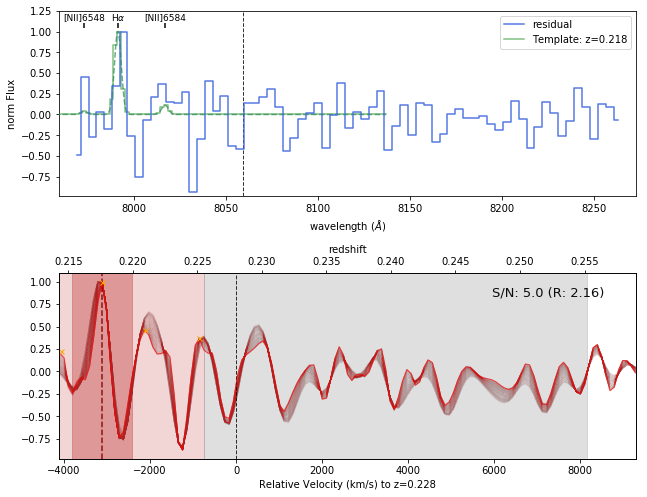

Best z: 0.21687691042909496 Best sigma: 5.0015147835707285
SE Object #14  z: 0.217  Peak R: 1.217  Detction S/N: 6.003 Peak S/N: 5.192


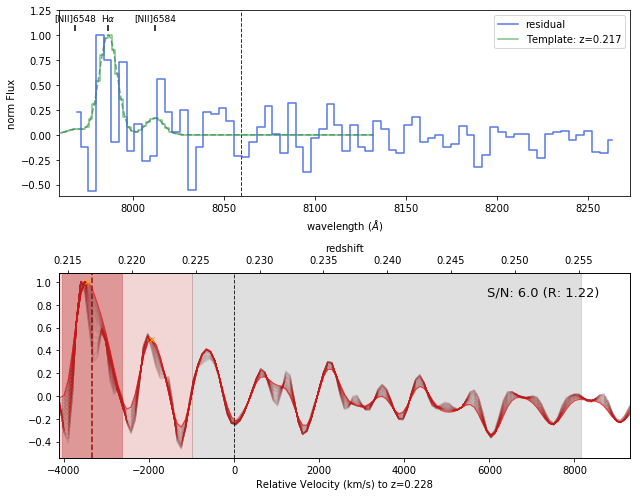

Best z: 0.22285968957236799 Best sigma: 3.8703060535295823
SE Object #21  z: 0.223  Peak R: 2.025  Detction S/N: 5.727 Peak S/N: 4.291


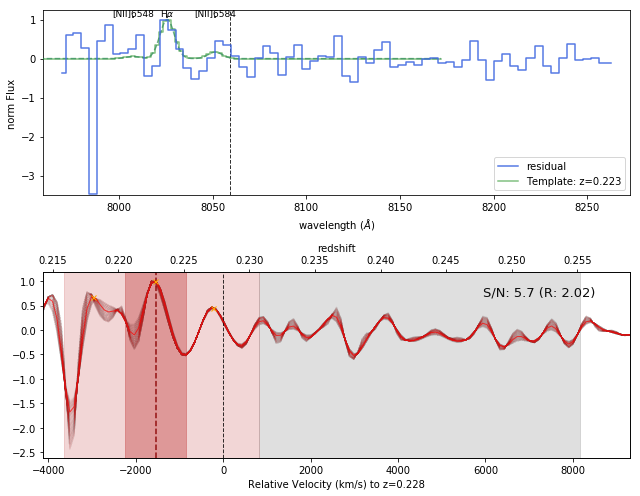

Best z: 0.22780921082048314 Best sigma: 5.0015147835707285
SE Object #41  z: 0.228  Peak R: 3.655  Detction S/N: 5.332 Peak S/N: 5.241


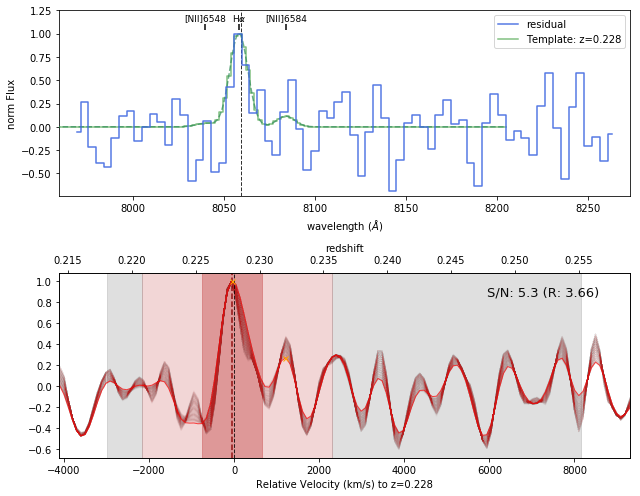

Best z: 0.21664308475435 Best sigma: 5.0015147835707285
SE Object #47  z: 0.217  Peak R: 1.766  Detction S/N: 5.863 Peak S/N: 4.754


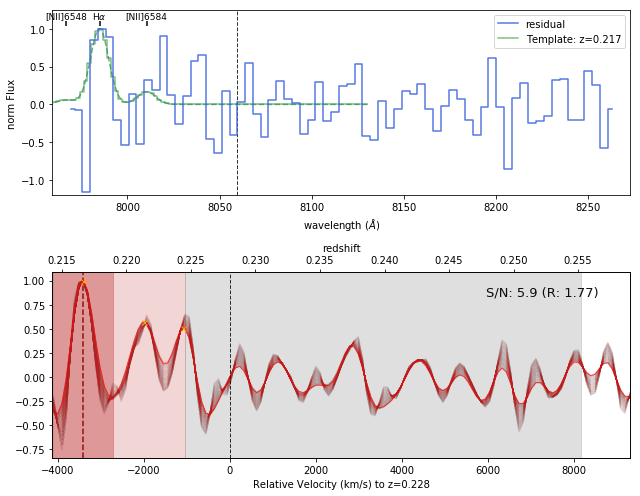

Best z: 0.22026801611093794 Best sigma: 1.8341303394555193
SE Object #50  z: 0.220  Peak R: 2.040  Detction S/N: 6.426 Peak S/N: 6.101


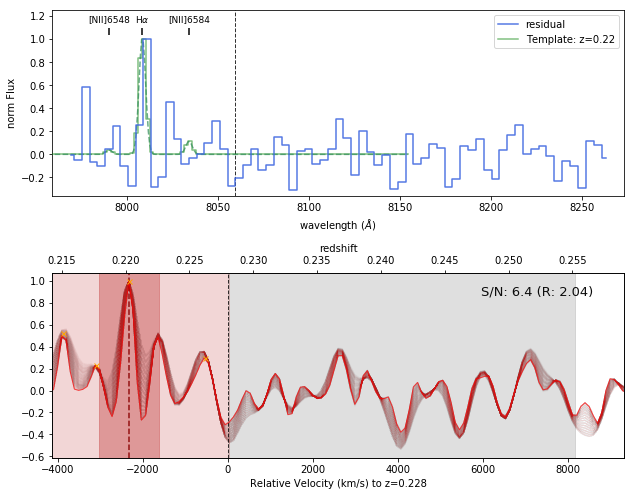

Best z: 0.2172975227940542 Best sigma: 5.0015147835707285
SE Object #69  z: 0.217  Peak R: 3.364  Detction S/N: 5.665 Peak S/N: 5.797


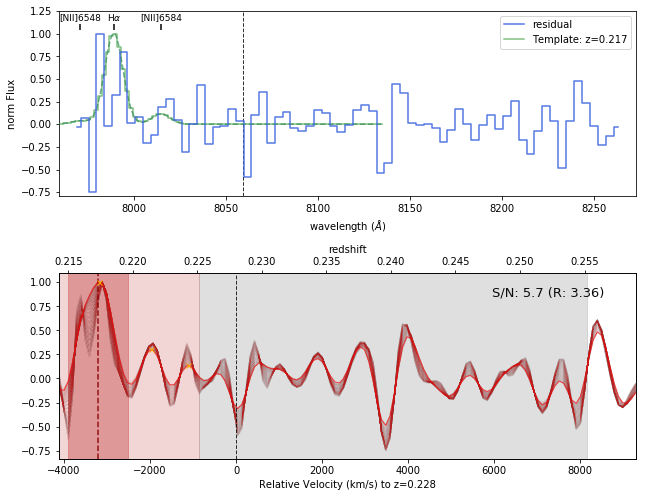

Best z: 0.23761420096060862 Best sigma: 5.0015147835707285
SE Object #112  z: 0.238  Peak R: 1.607  Detction S/N: 5.216 Peak S/N: 4.248


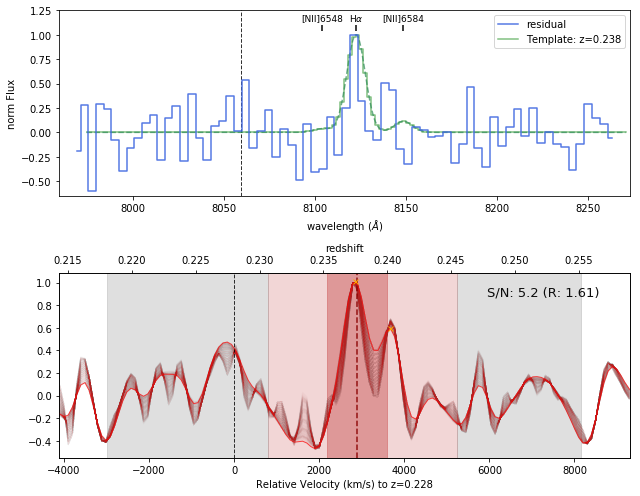

Best z: 0.22417120169576718 Best sigma: 4.54903129155427
SE Object #127  z: 0.224  Peak R: 1.535  Detction S/N: 5.129 Peak S/N: 4.330


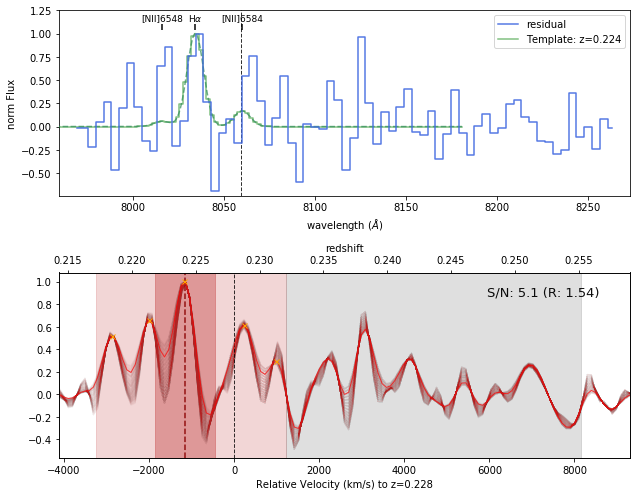

Best z: 0.21892515320217049 Best sigma: 5.0015147835707285
SE Object #164  z: 0.219  Peak R: 2.892  Detction S/N: 5.490 Peak S/N: 5.171


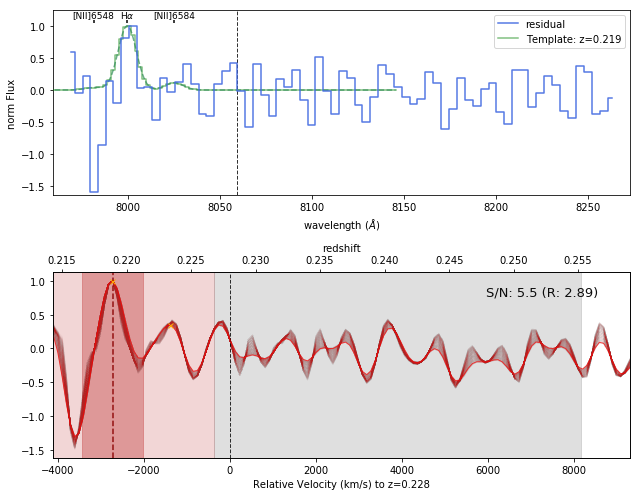

Best z: 0.2156908014471689 Best sigma: 1.8341303394555193
SE Object #201  z: 0.216  Peak R: 2.591  Detction S/N: 6.120 Peak S/N: 5.761


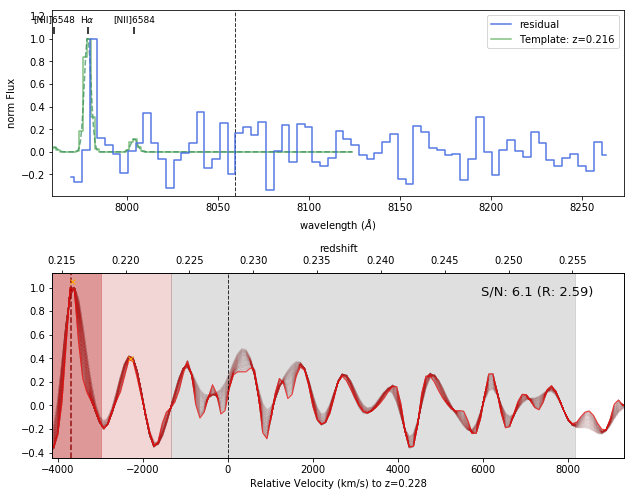

Best z: 0.21928438201838854 Best sigma: 5.0015147835707285
SE Object #217  z: 0.219  Peak R: 3.975  Detction S/N: 5.204 Peak S/N: 5.031


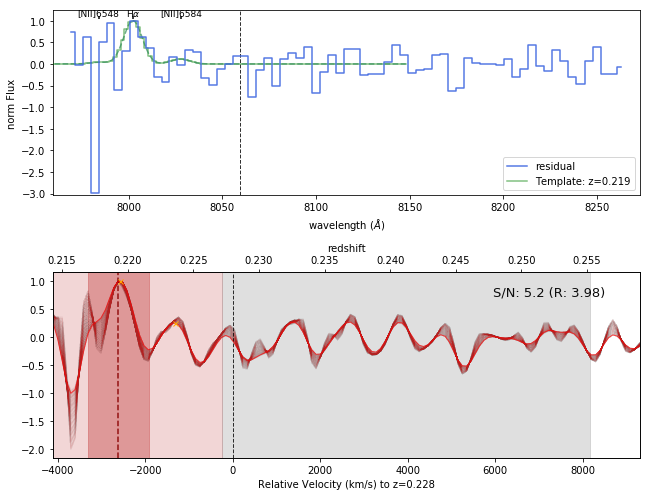

Best z: 0.21566206109283495 Best sigma: 3.6440643075213535
SE Object #225  z: 0.216  Peak R: 2.259  Detction S/N: 6.503 Peak S/N: 5.775


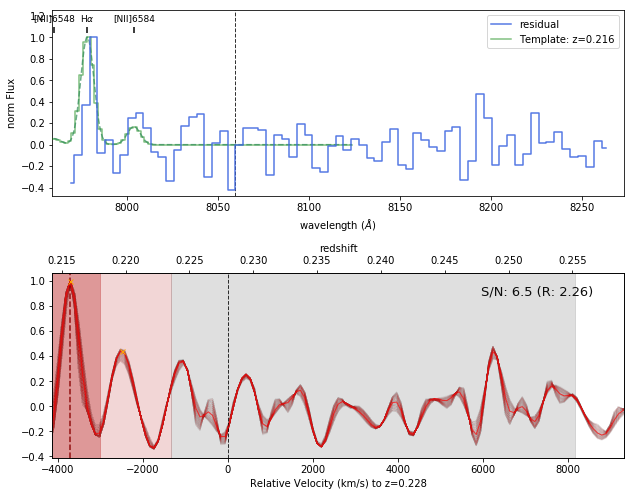

Best z: 0.2523687123488492 Best sigma: 5.0015147835707285
SE Object #229  z: 0.252  Peak R: 1.732  Detction S/N: 5.879 Peak S/N: 6.151


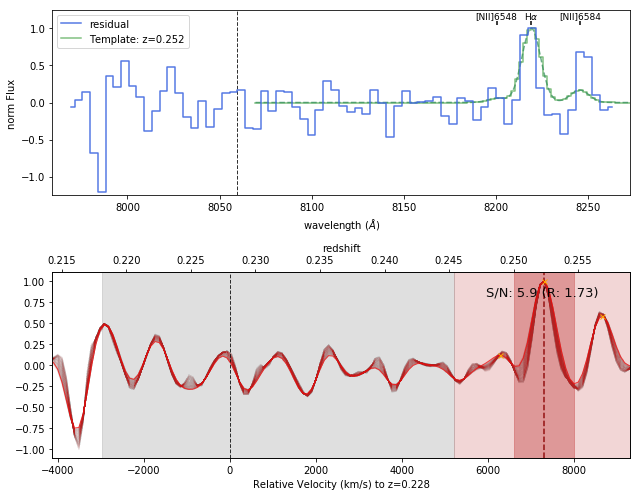

Best z: 0.2540081025030982 Best sigma: 5.0015147835707285
SE Object #242  z: 0.254  Peak R: 4.122  Detction S/N: 5.313 Peak S/N: 5.350


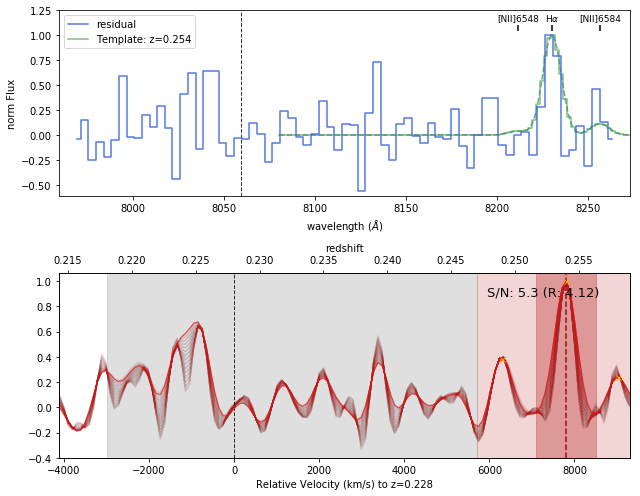

Best z: 0.21631781715453452 Best sigma: 5.0015147835707285
SE Object #258  z: 0.216  Peak R: 2.039  Detction S/N: 6.377 Peak S/N: 5.649


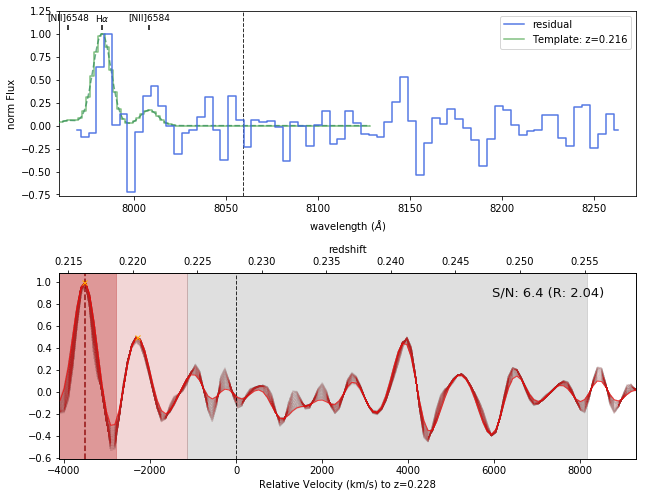

Best z: 0.21730145124708392 Best sigma: 1.8341303394555193
SE Object #304  z: 0.217  Peak R: 2.234  Detction S/N: 5.272 Peak S/N: 5.094


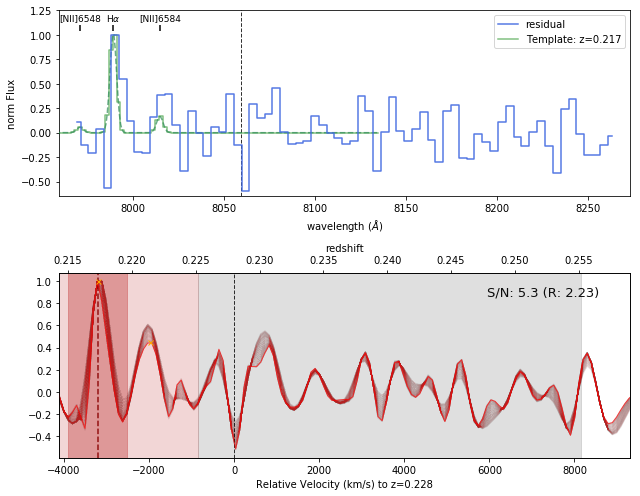

Best z: 0.21958090926387008 Best sigma: 5.0015147835707285
SE Object #330  z: 0.220  Peak R: 1.584  Detction S/N: 5.636 Peak S/N: 4.846


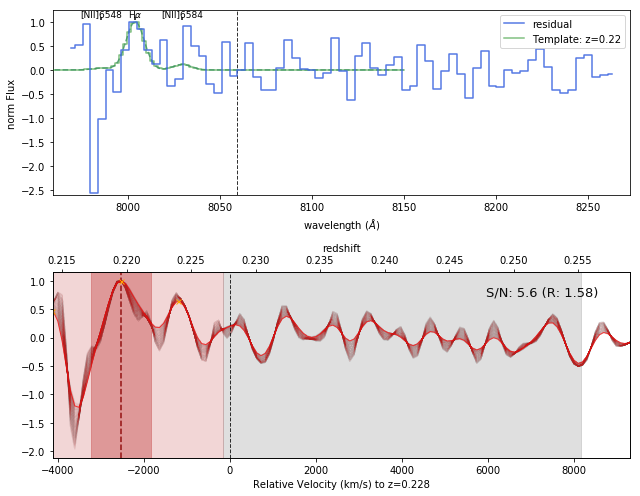

Best z: 0.21434793853840145 Best sigma: 1.8341303394555193
SE Object #334  z: 0.214  Peak R: 1.828  Detction S/N: 5.084 Peak S/N: 4.656


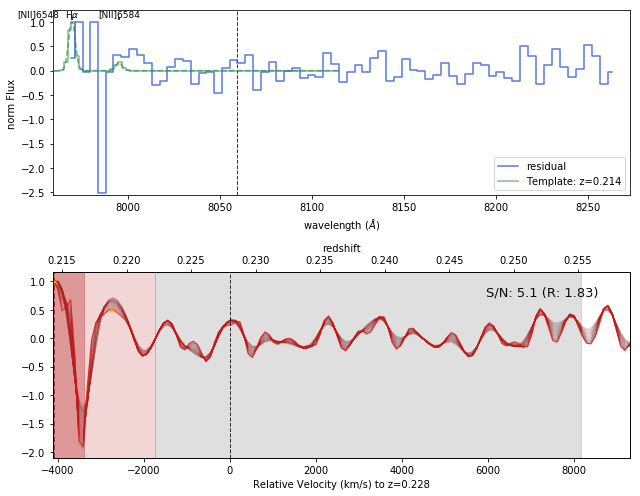

Best z: 0.24026857599277524 Best sigma: 5.0015147835707285
SE Object #352  z: 0.240  Peak R: 5.953  Detction S/N: 5.222 Peak S/N: 4.058


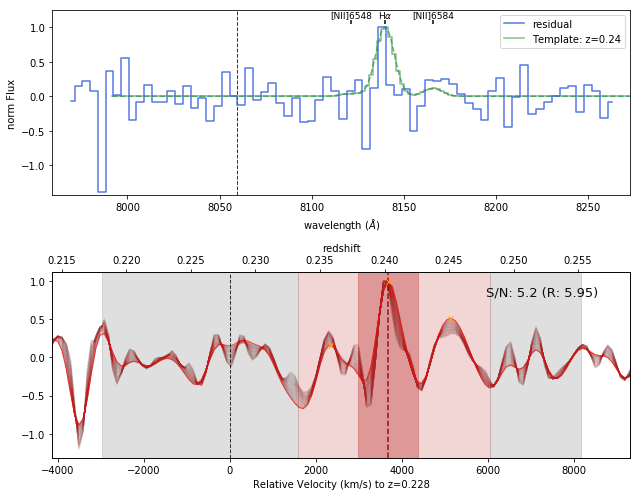

Best z: 0.21687691042909496 Best sigma: 5.0015147835707285
SE Object #361  z: 0.217  Peak R: 1.000  Detction S/N: 6.827 Peak S/N: 6.726


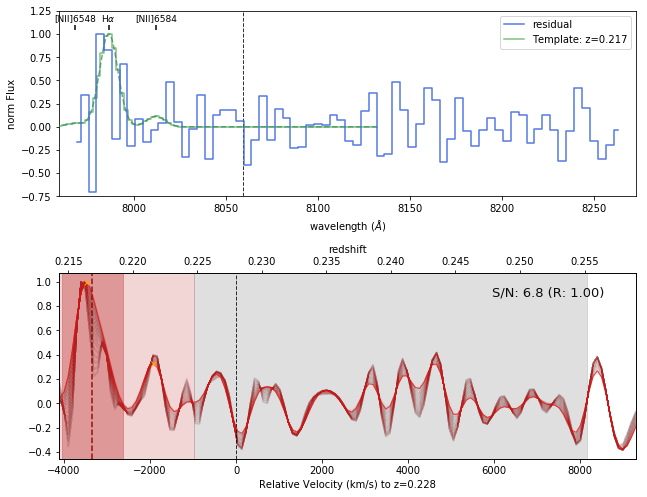

Best z: 0.21895650398753874 Best sigma: 5.0015147835707285
SE Object #378  z: 0.219  Peak R: 2.422  Detction S/N: 5.525 Peak S/N: 5.061


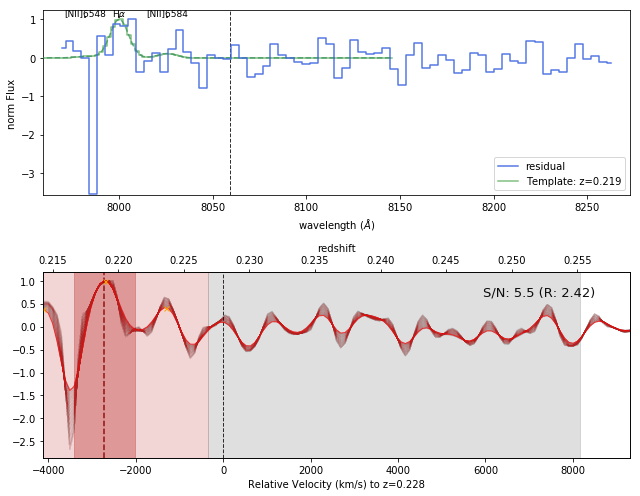

Best z: 0.2546638585647978 Best sigma: 5.0015147835707285
SE Object #390  z: 0.255  Peak R: 1.002  Detction S/N: 5.357 Peak S/N: 5.328


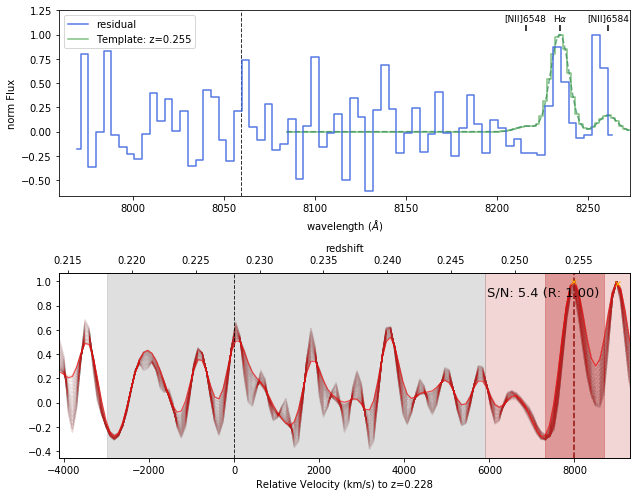

Best z: 0.21630083654633322 Best sigma: 1.8341303394555193
SE Object #402  z: 0.216  Peak R: 2.348  Detction S/N: 6.066 Peak S/N: 5.767


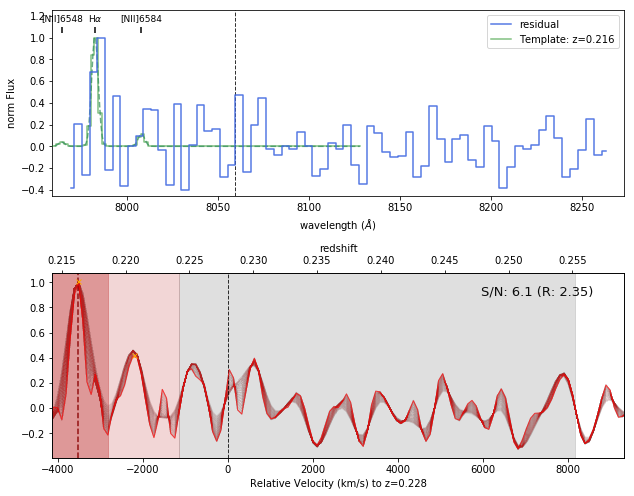

Best z: 0.24253237142335551 Best sigma: 3.191580815504895
SE Object #403  z: 0.243  Peak R: 9.288  Detction S/N: 5.039 Peak S/N: 4.499


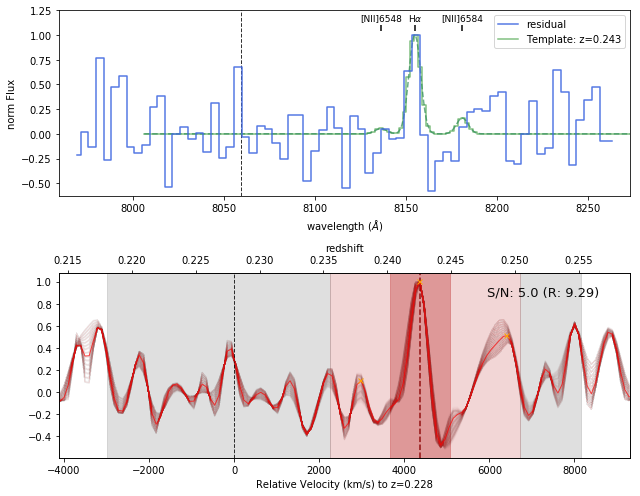

Best z: 0.22777786003511488 Best sigma: 2.9653390694966655
SE Object #405  z: 0.228  Peak R: 4.543  Detction S/N: 6.959 Peak S/N: 6.999


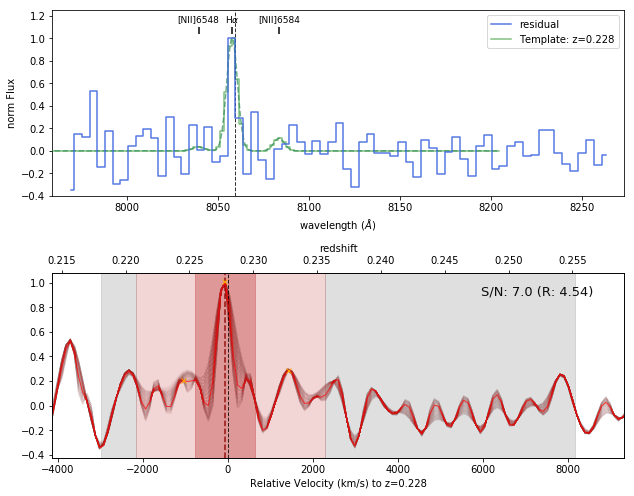

Best z: 0.2179558892867881 Best sigma: 5.0015147835707285
SE Object #411  z: 0.218  Peak R: 2.139  Detction S/N: 5.715 Peak S/N: 5.417


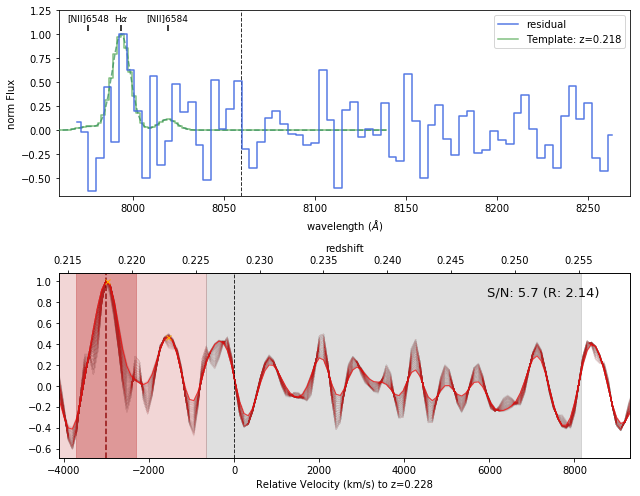

Best z: 0.21925303123302028 Best sigma: 4.775273037562499
SE Object #428  z: 0.219  Peak R: 2.046  Detction S/N: 5.099 Peak S/N: 4.092


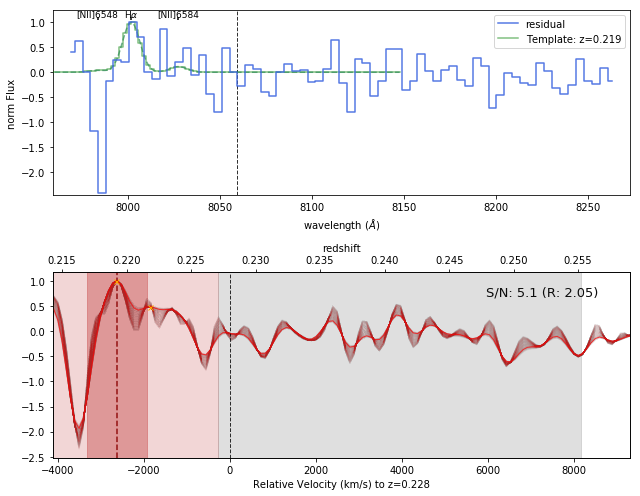

Best z: 0.21695659260803282 Best sigma: 5.0015147835707285
SE Object #437  z: 0.217  Peak R: 2.406  Detction S/N: 5.250 Peak S/N: 5.096


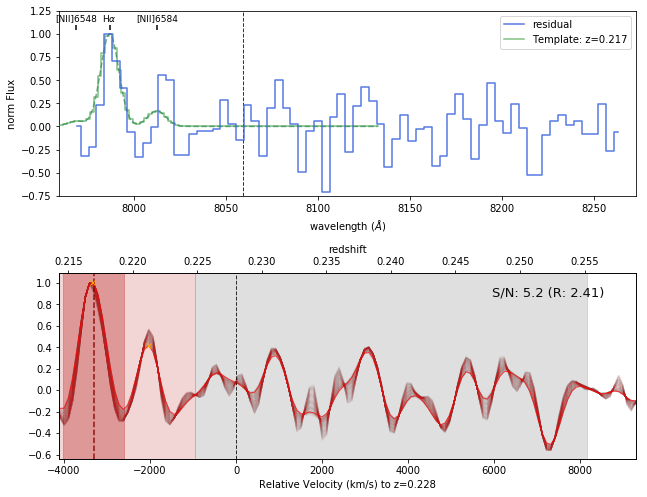

Best z: 0.2179558892867881 Best sigma: 5.0015147835707285
SE Object #453  z: 0.218  Peak R: 1.810  Detction S/N: 5.198 Peak S/N: 4.925


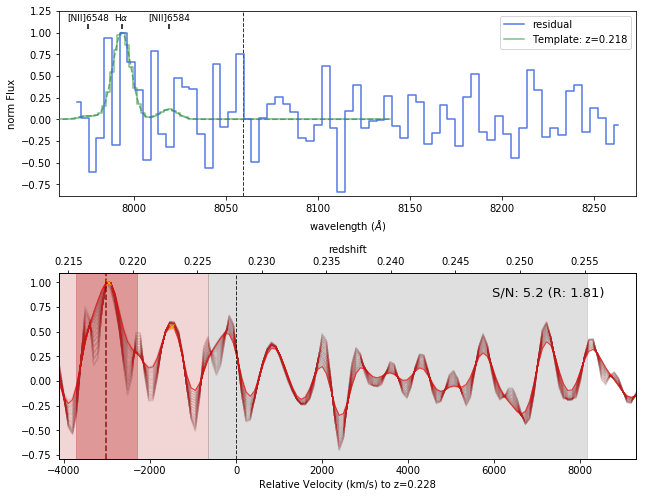

Best z: 0.2176423814331053 Best sigma: 5.0015147835707285
SE Object #470  z: 0.218  Peak R: 2.829  Detction S/N: 5.630 Peak S/N: 5.291


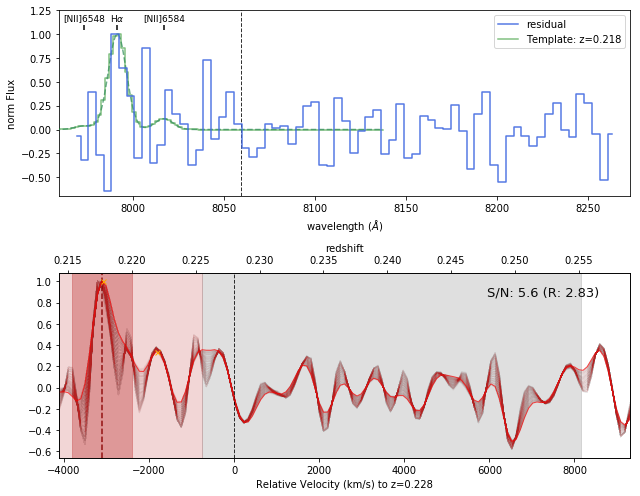

Best z: 0.21990878729471988 Best sigma: 5.0015147835707285
SE Object #471  z: 0.220  Peak R: 1.661  Detction S/N: 5.243 Peak S/N: 4.374


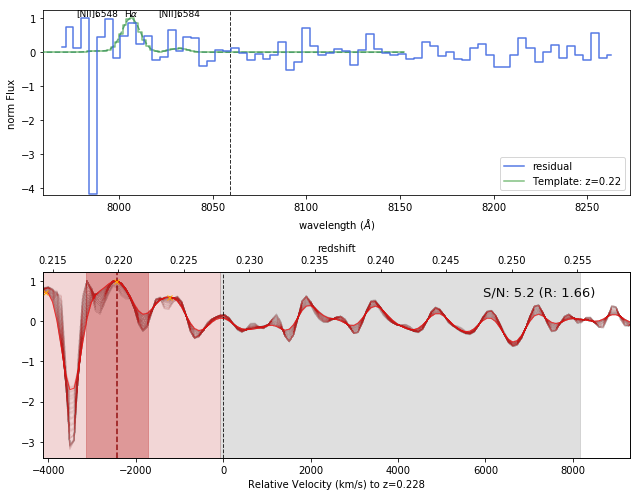

Best z: 0.24026857599277524 Best sigma: 5.0015147835707285
SE Object #494  z: 0.240  Peak R: 1.522  Detction S/N: 5.723 Peak S/N: 5.019


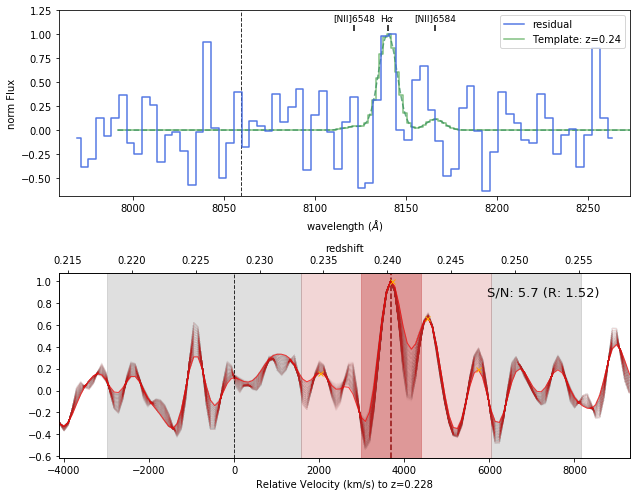

Best z: 0.2176423814331053 Best sigma: 5.0015147835707285
SE Object #504  z: 0.218  Peak R: 2.328  Detction S/N: 6.254 Peak S/N: 6.566


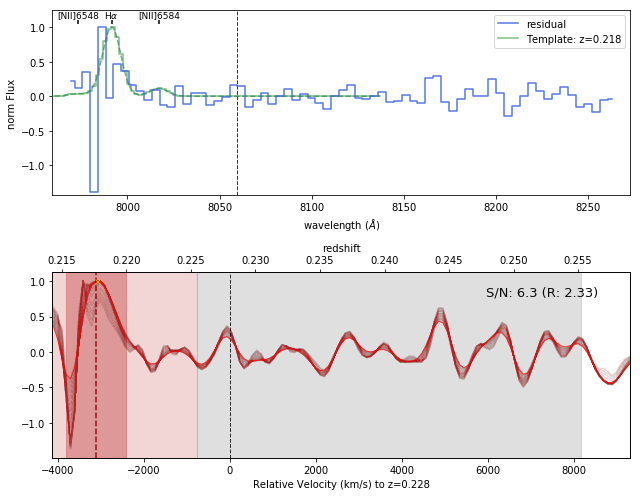

Best z: 0.22318756760321778 Best sigma: 1.8341303394555193
SE Object #566  z: 0.223  Peak R: 1.573  Detction S/N: 5.751 Peak S/N: 5.236


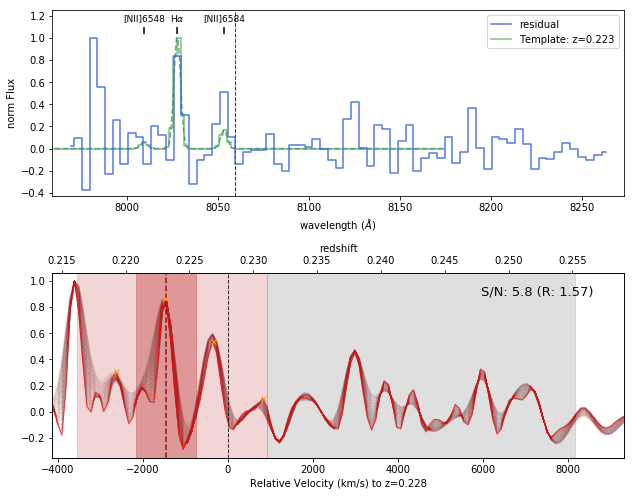

Best z: 0.2179558892867881 Best sigma: 5.0015147835707285
SE Object #577  z: 0.218  Peak R: 1.927  Detction S/N: 5.054 Peak S/N: 4.757


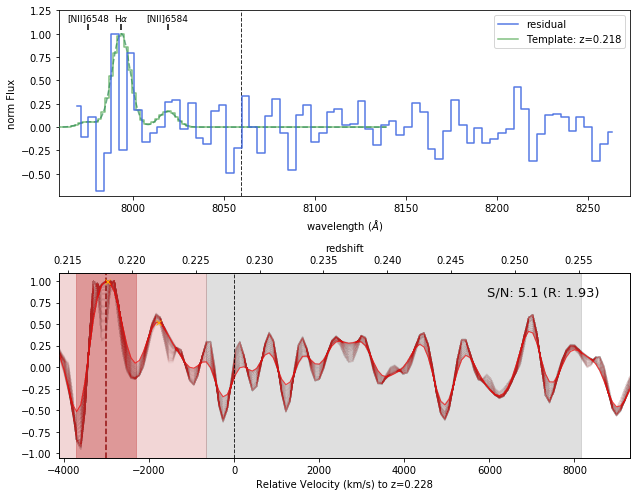

Best z: 0.21895650398753874 Best sigma: 5.0015147835707285
SE Object #592  z: 0.219  Peak R: 1.640  Detction S/N: 5.190 Peak S/N: 4.774


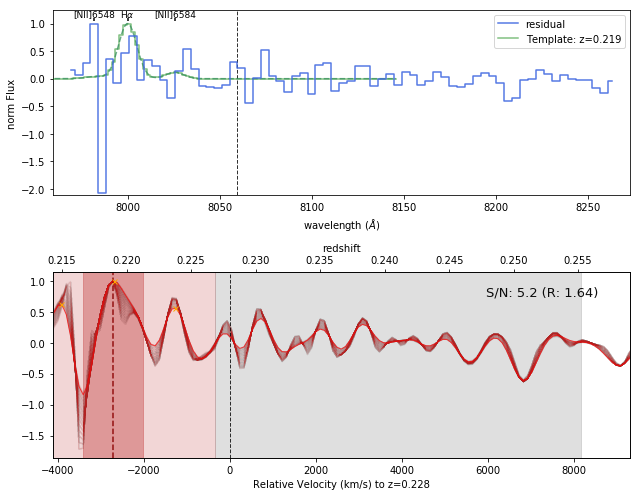

Best z: 0.21631520672350021 Best sigma: 2.512855577480207
SE Object #637  z: 0.216  Peak R: 2.444  Detction S/N: 5.830 Peak S/N: 5.665


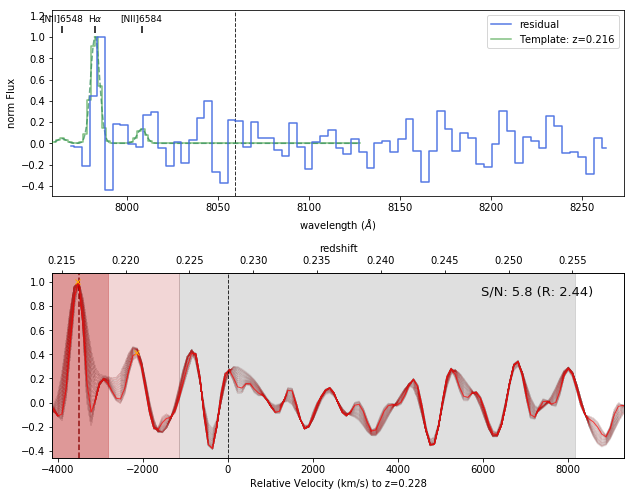

Best z: 0.2530244684105488 Best sigma: 3.8703060535295823
SE Object #682  z: 0.253  Peak R: 2.421  Detction S/N: 5.594 Peak S/N: 4.779


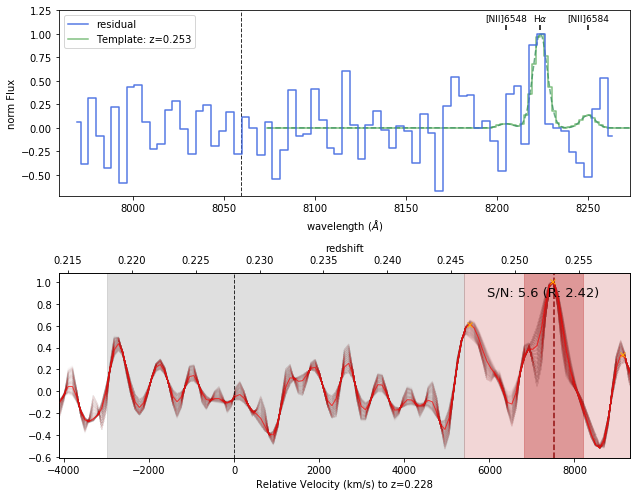

Best z: 0.24613902976270322 Best sigma: 5.0015147835707285
SE Object #706  z: 0.246  Peak R: 1.415  Detction S/N: 5.336 Peak S/N: 4.352


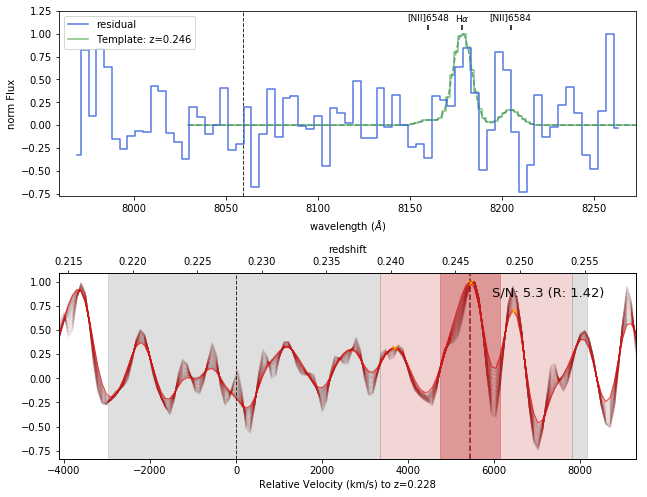

Best z: 0.2165490323982452 Best sigma: 5.0015147835707285
SE Object #707  z: 0.217  Peak R: 1.065  Detction S/N: 6.709 Peak S/N: 6.064


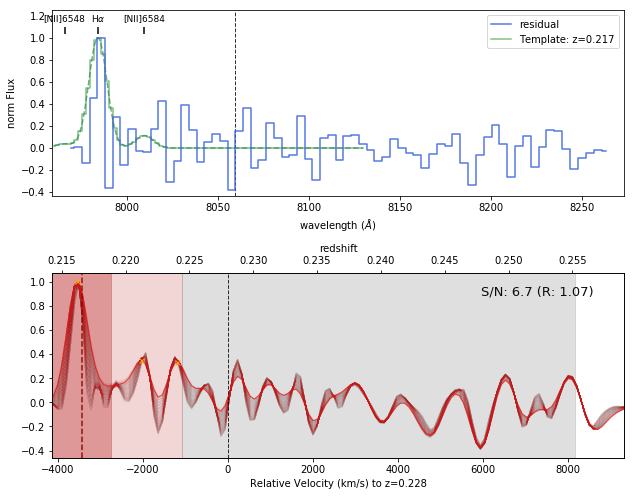

Best z: 0.2163256484476375 Best sigma: 5.0015147835707285
SE Object #734  z: 0.216  Peak R: 7.481  Detction S/N: 6.365 Peak S/N: 6.516


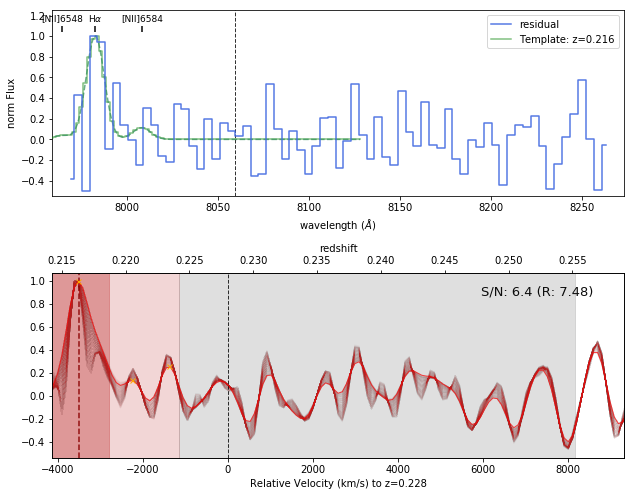

Best z: 0.21990878729471988 Best sigma: 2.739097323488436
SE Object #750  z: 0.220  Peak R: 1.277  Detction S/N: 5.231 Peak S/N: 4.492


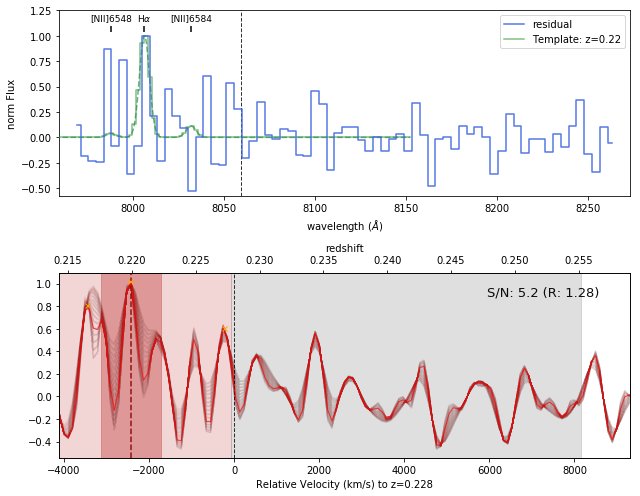

Best z: 0.21662871457718302 Best sigma: 3.6440643075213535
SE Object #752  z: 0.217  Peak R: 4.113  Detction S/N: 6.053 Peak S/N: 5.873


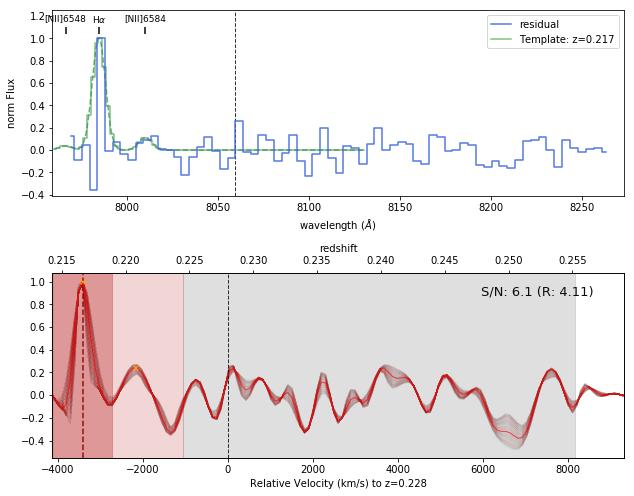

Best z: 0.21599254955471905 Best sigma: 5.0015147835707285
SE Object #755  z: 0.216  Peak R: 2.375  Detction S/N: 5.434 Peak S/N: 5.214


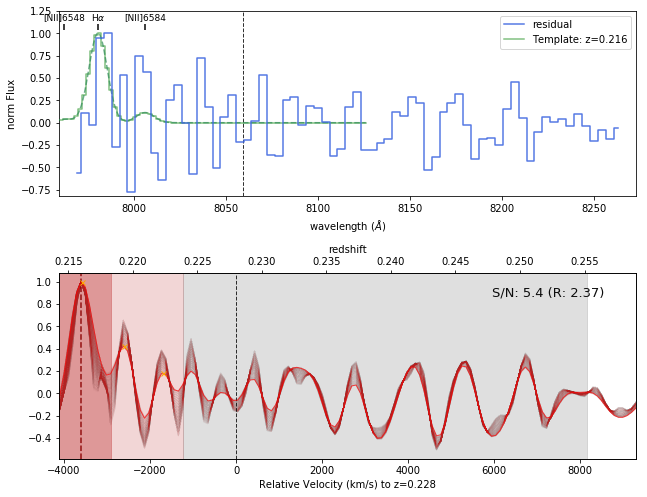

Best z: 0.23403889340662917 Best sigma: 4.775273037562499
SE Object #758  z: 0.234  Peak R: 5.589  Detction S/N: 6.071 Peak S/N: 6.529


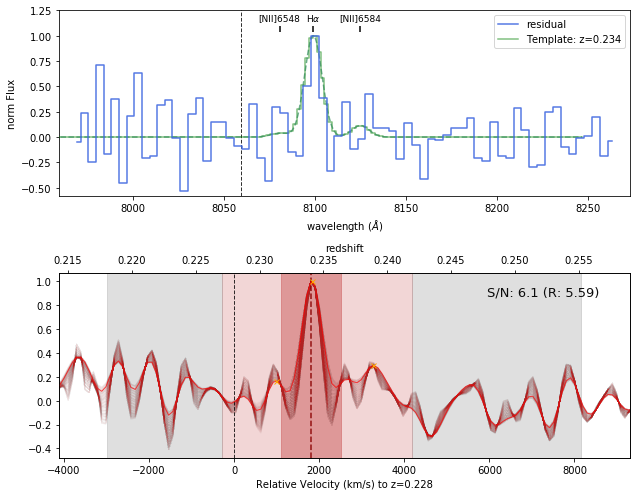

Best z: 0.21630605740840186 Best sigma: 2.512855577480207
SE Object #773  z: 0.216  Peak R: 2.985  Detction S/N: 6.514 Peak S/N: 6.478


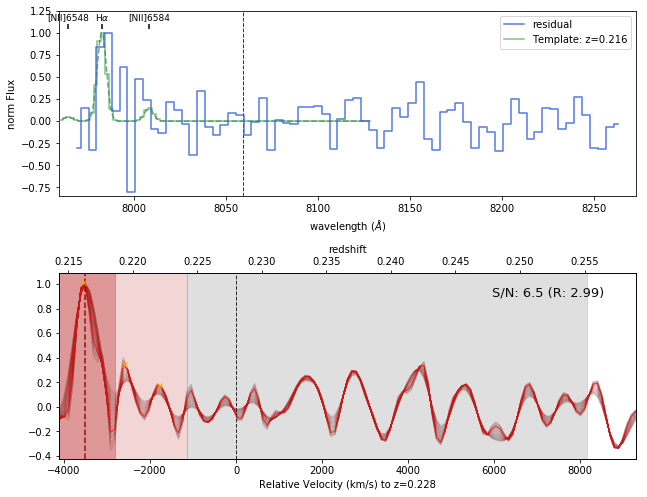

Best z: 0.21597817937755207 Best sigma: 2.0603720854637486
SE Object #774  z: 0.216  Peak R: 2.119  Detction S/N: 6.178 Peak S/N: 6.100


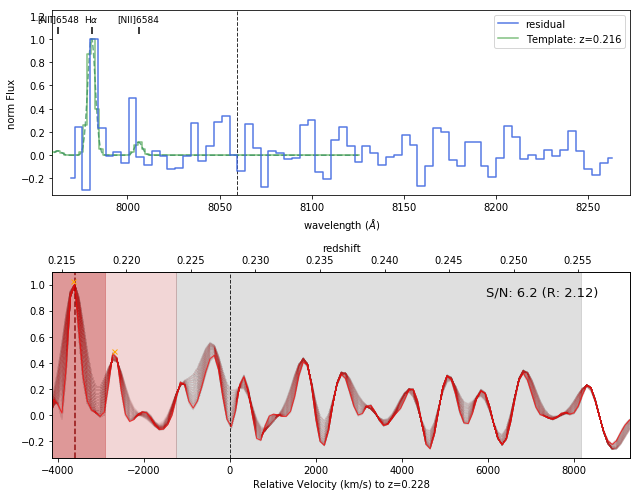

Best z: 0.21599254955471905 Best sigma: 5.0015147835707285
SE Object #786  z: 0.216  Peak R: 2.898  Detction S/N: 5.556 Peak S/N: 5.425


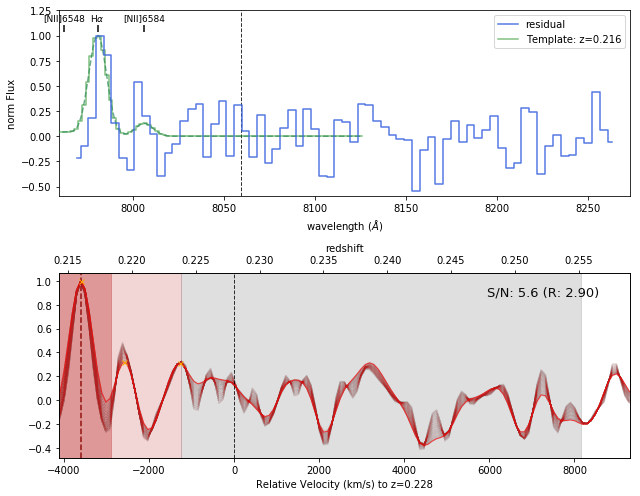

Best z: 0.2179558892867881 Best sigma: 2.9653390694966655
SE Object #798  z: 0.218  Peak R: 1.224  Detction S/N: 5.787 Peak S/N: 4.320


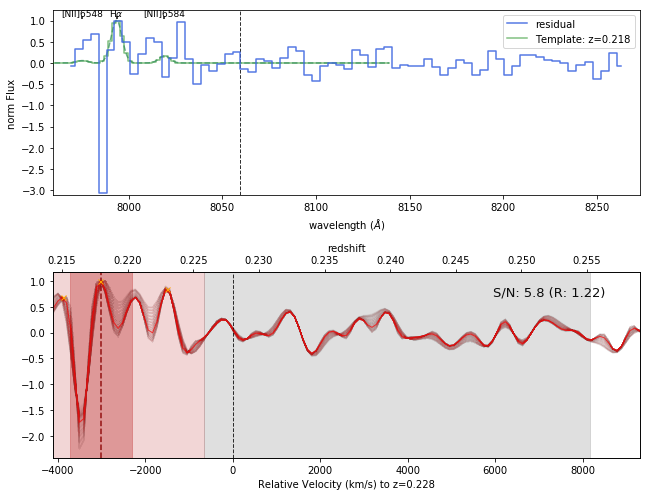

Best z: 0.21565945066180062 Best sigma: 5.0015147835707285
SE Object #828  z: 0.216  Peak R: 1.604  Detction S/N: 6.919 Peak S/N: 5.951


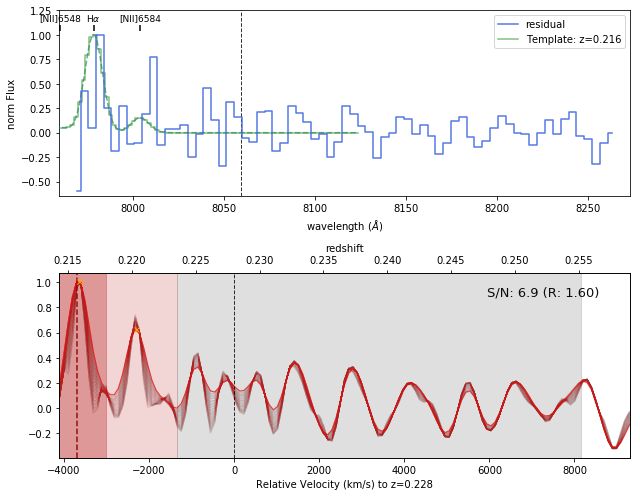

Best z: 0.21598732869265042 Best sigma: 2.512855577480207
SE Object #837  z: 0.216  Peak R: 2.641  Detction S/N: 6.498 Peak S/N: 6.505


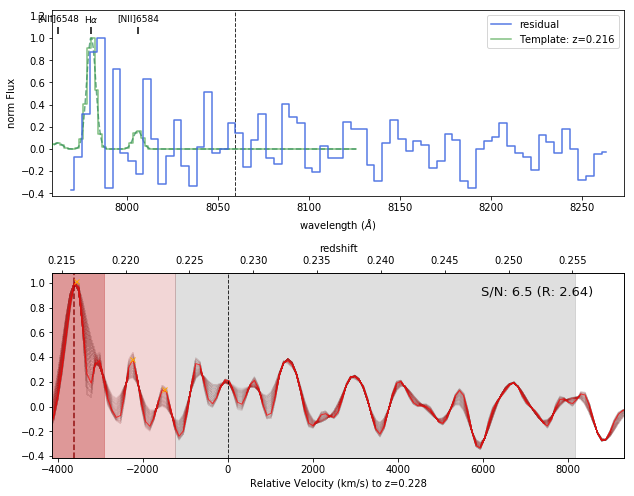

Best z: 0.22908937215851405 Best sigma: 5.0015147835707285
SE Object #843  z: 0.229  Peak R: 2.039  Detction S/N: 5.820 Peak S/N: 5.203


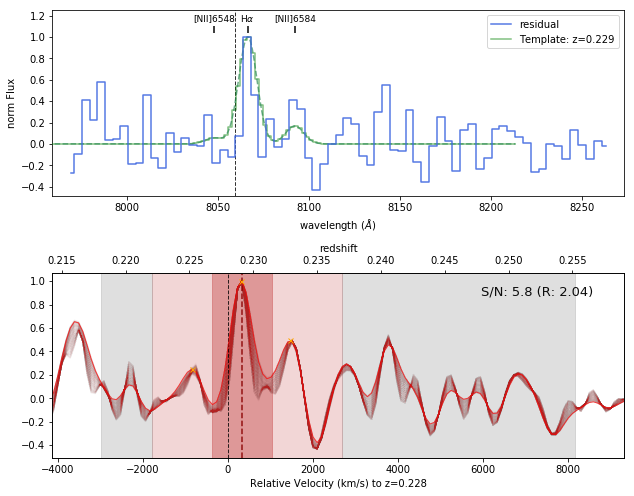

Best z: 0.2330552593140798 Best sigma: 4.775273037562499
SE Object #850  z: 0.233  Peak R: 5.400  Detction S/N: 5.513 Peak S/N: 4.079


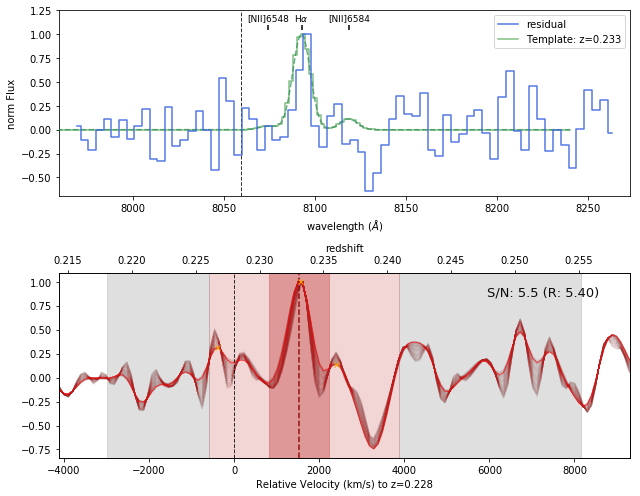

Best z: 0.2500735661329007 Best sigma: 5.0015147835707285
SE Object #854  z: 0.250  Peak R: 2.793  Detction S/N: 6.072 Peak S/N: 5.661


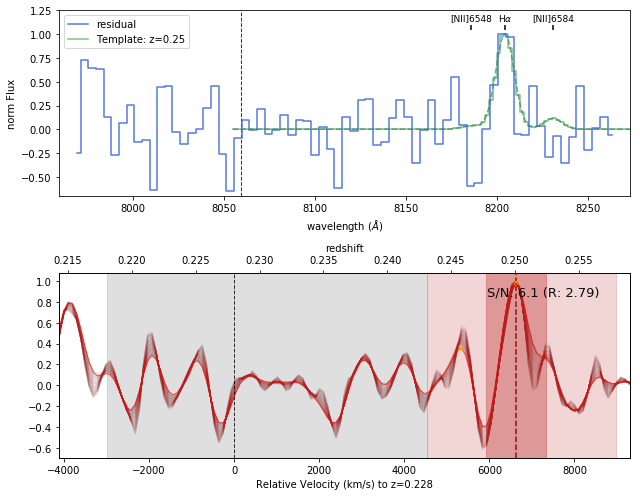

Best z: 0.2159807898085864 Best sigma: 5.0015147835707285
SE Object #886  z: 0.216  Peak R: 4.753  Detction S/N: 6.273 Peak S/N: 5.754


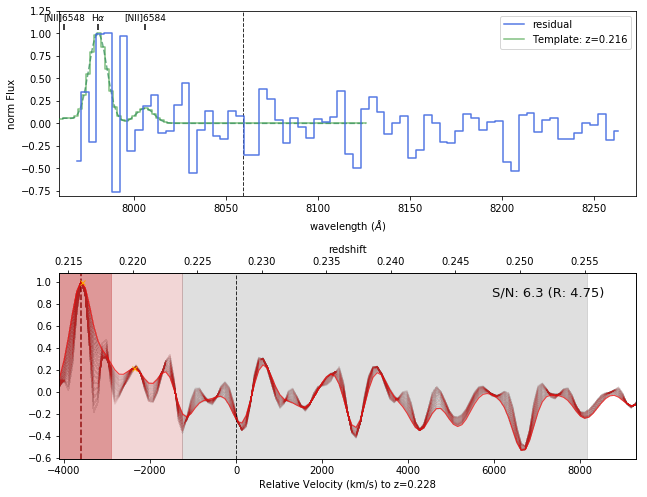

Best z: 0.22908937215851405 Best sigma: 4.096547799537811
SE Object #905  z: 0.229  Peak R: 3.951  Detction S/N: 5.570 Peak S/N: 5.644


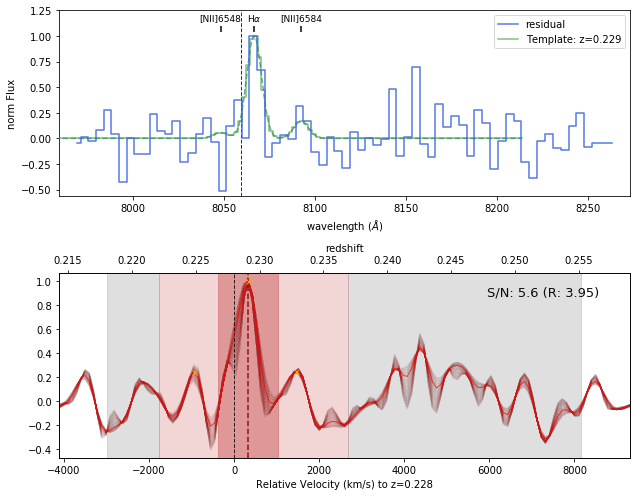

Best z: 0.22551406460453458 Best sigma: 2.9653390694966655
SE Object #912  z: 0.226  Peak R: 6.010  Detction S/N: 6.189 Peak S/N: 6.891


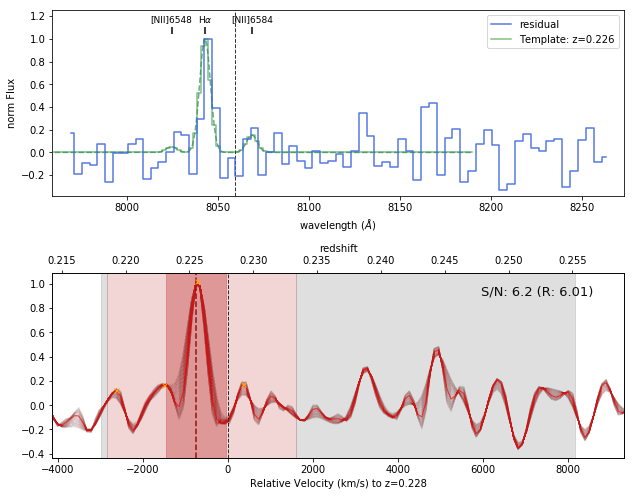

Best z: 0.24515539567015382 Best sigma: 3.417822561513124
SE Object #929  z: 0.245  Peak R: 2.007  Detction S/N: 5.569 Peak S/N: 4.215


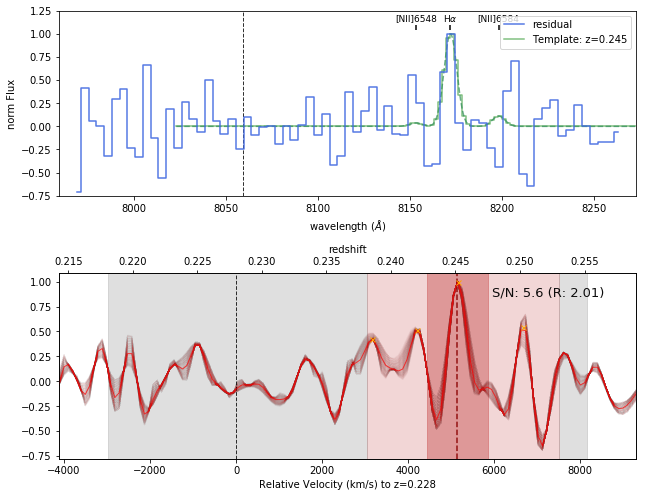

Best z: 0.2530244684105488 Best sigma: 5.0015147835707285
SE Object #979  z: 0.253  Peak R: 2.743  Detction S/N: 6.857 Peak S/N: 6.861


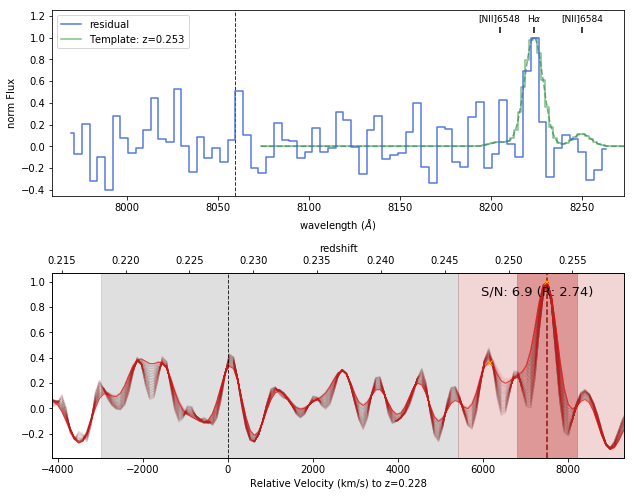

Best z: 0.22351544563406758 Best sigma: 4.775273037562499
SE Object #1025  z: 0.224  Peak R: 2.037  Detction S/N: 5.099 Peak S/N: 4.286


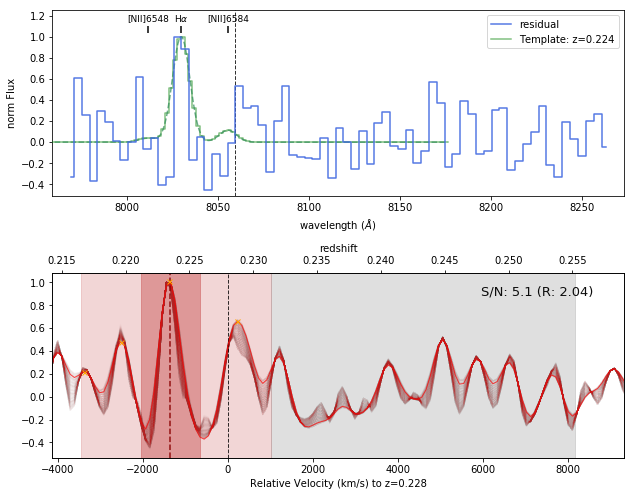

Best z: 0.22351544563406758 Best sigma: 5.0015147835707285
SE Object #1036  z: 0.224  Peak R: 2.469  Detction S/N: 5.152 Peak S/N: 5.222


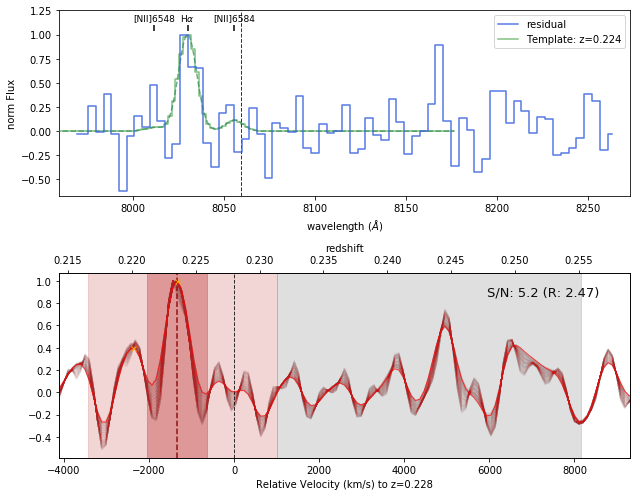

Best z: 0.2510885510108184 Best sigma: 5.0015147835707285
SE Object #1063  z: 0.251  Peak R: 3.813  Detction S/N: 5.362 Peak S/N: 5.565


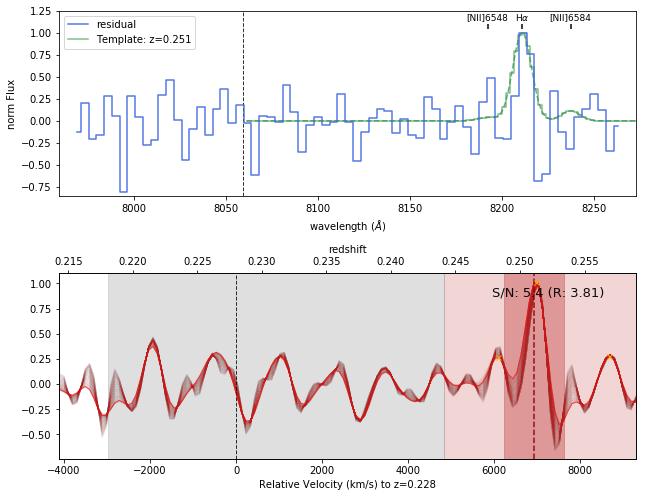

Best z: 0.25568145387374974 Best sigma: 3.417822561513124
SE Object #1067  z: 0.256  Peak R: 9.927  Detction S/N: 5.281 Peak S/N: 5.199


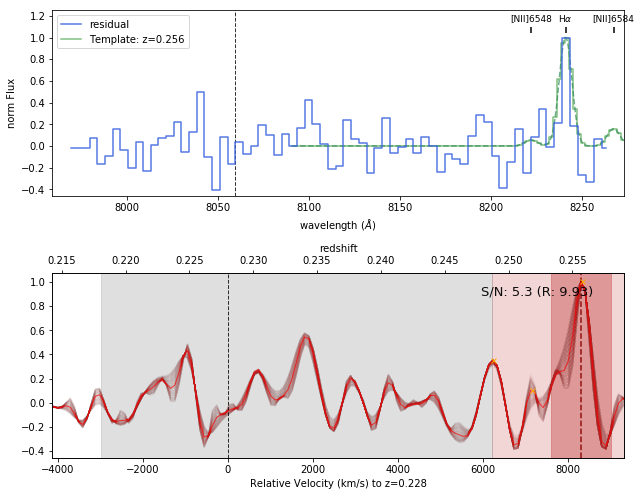

Best z: 0.24023722520740695 Best sigma: 4.322789545546041
SE Object #1120  z: 0.240  Peak R: 9.835  Detction S/N: 6.281 Peak S/N: 7.194


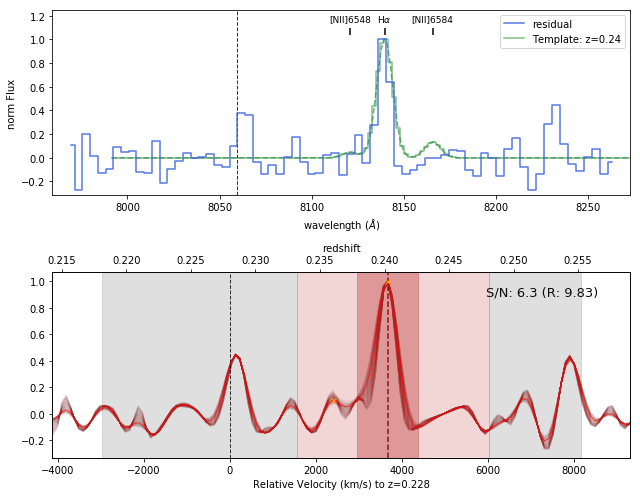

Best z: 0.21892515320217049 Best sigma: 5.0015147835707285
SE Object #1130  z: 0.219  Peak R: 9.707  Detction S/N: 6.294 Peak S/N: 6.808


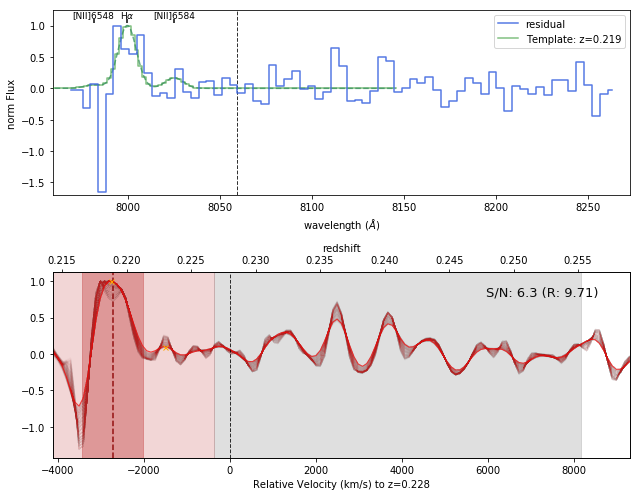

Best z: 0.22777786003511488 Best sigma: 1.8341303394555193
SE Object #1141  z: 0.228  Peak R: 1.618  Detction S/N: 5.026 Peak S/N: 4.437


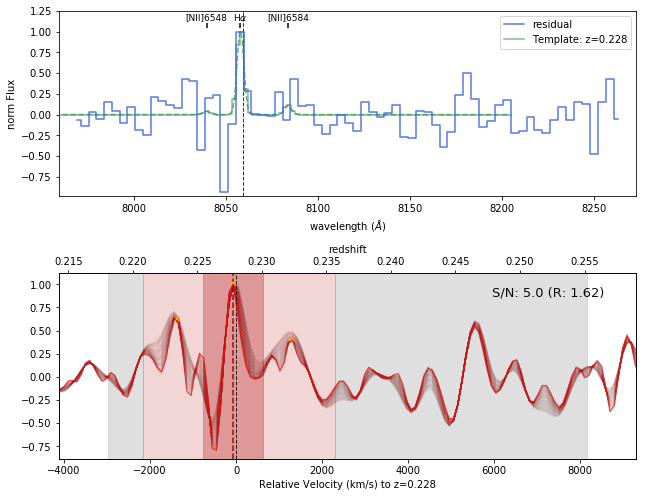

Best z: 0.25433598053394796 Best sigma: 5.0015147835707285
SE Object #1173  z: 0.254  Peak R: 1.179  Detction S/N: 5.564 Peak S/N: 5.791


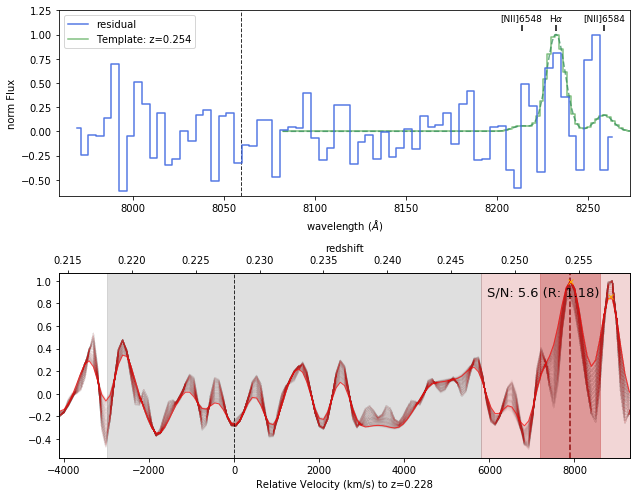

Best z: 0.23367966459041112 Best sigma: 5.0015147835707285
SE Object #1263  z: 0.234  Peak R: 1.421  Detction S/N: 5.038 Peak S/N: 4.307


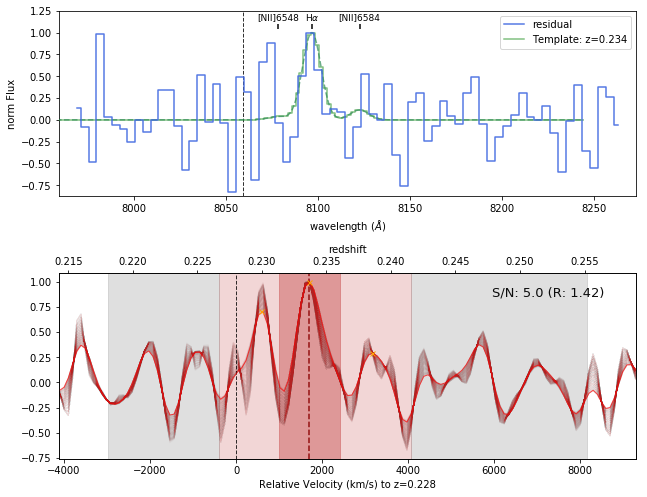

Best z: 0.2176423814331053 Best sigma: 2.9653390694966655
SE Object #1267  z: 0.218  Peak R: 2.655  Detction S/N: 6.117 Peak S/N: 5.710


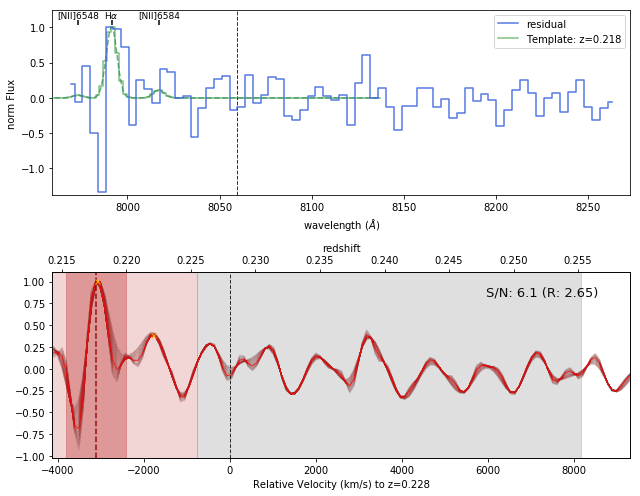

Best z: 0.23928494190022584 Best sigma: 5.0015147835707285
SE Object #1283  z: 0.239  Peak R: 1.925  Detction S/N: 5.611 Peak S/N: 5.298


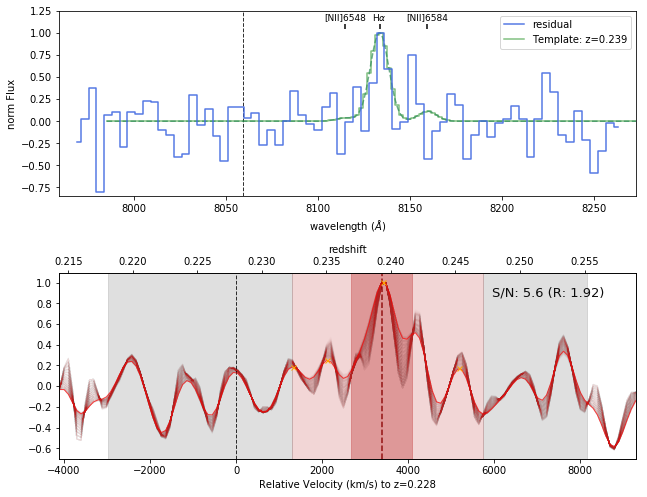

Best z: 0.2540394532884665 Best sigma: 5.0015147835707285
SE Object #1286  z: 0.254  Peak R: 4.562  Detction S/N: 5.881 Peak S/N: 5.665


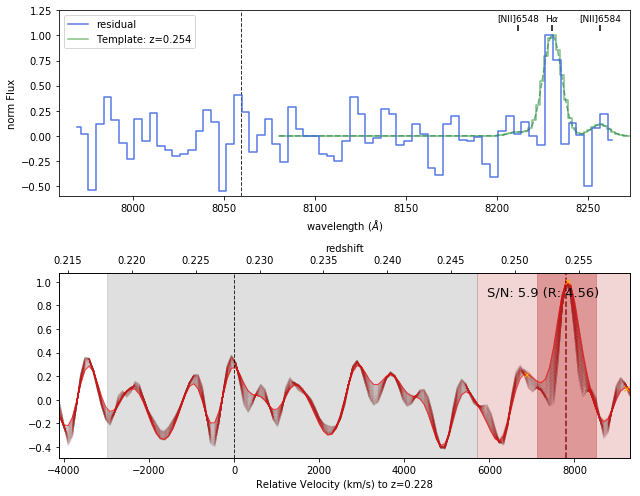

Best z: 0.2546638585647978 Best sigma: 4.54903129155427
SE Object #1299  z: 0.255  Peak R: 3.905  Detction S/N: 5.074 Peak S/N: 5.230


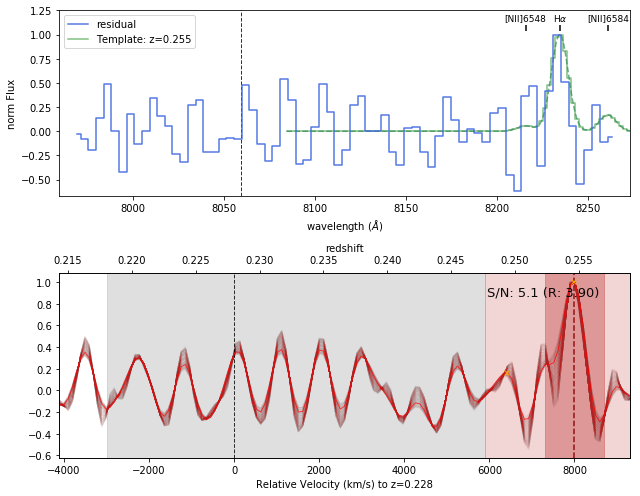

Best z: 0.23338313734492958 Best sigma: 5.0015147835707285
SE Object #1400  z: 0.233  Peak R: 2.098  Detction S/N: 5.978 Peak S/N: 5.191


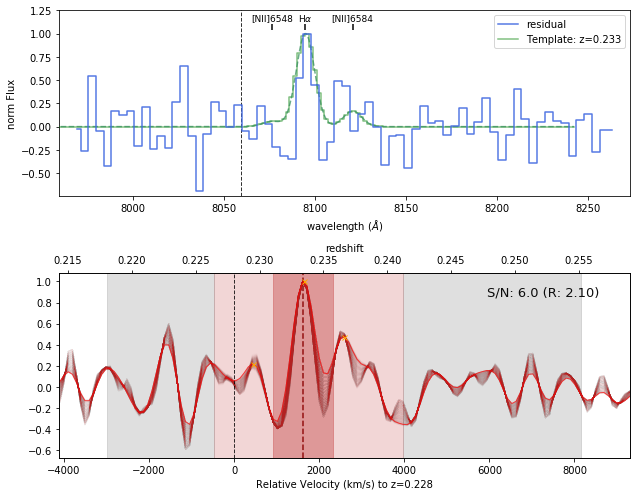

Best z: 0.22321891838858604 Best sigma: 5.0015147835707285
SE Object #1419  z: 0.223  Peak R: 8.540  Detction S/N: 5.255 Peak S/N: 5.303


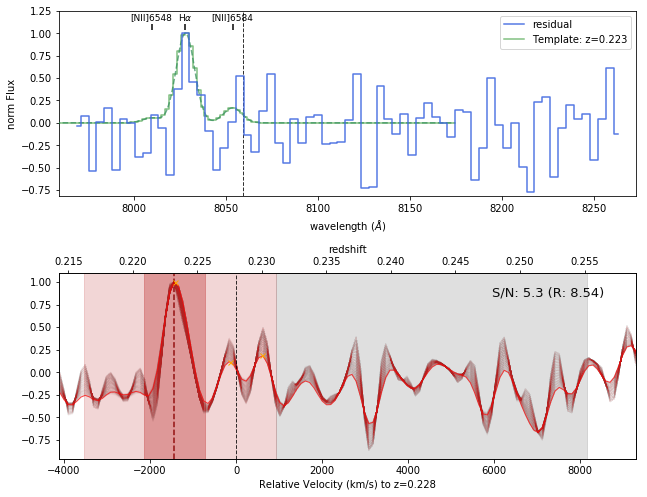

Best z: 0.2540081025030982 Best sigma: 5.0015147835707285
SE Object #1451  z: 0.254  Peak R: 1.000  Detction S/N: 6.726 Peak S/N: 6.971


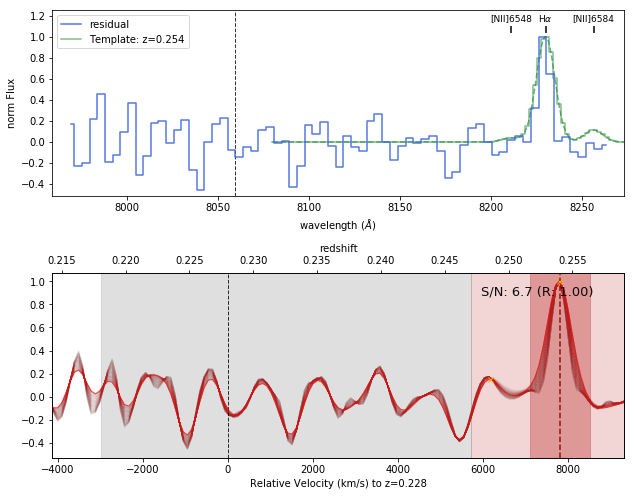

Best z: 0.2540394532884665 Best sigma: 5.0015147835707285
SE Object #1499  z: 0.254  Peak R: 1.377  Detction S/N: 5.022 Peak S/N: 4.738


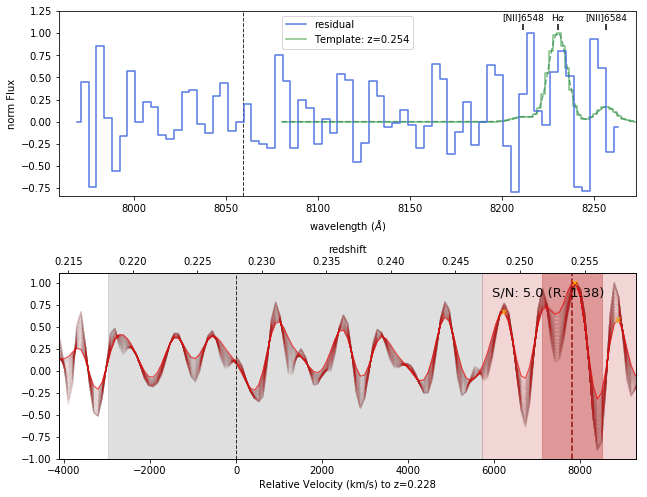

Best z: 0.217611030647737 Best sigma: 5.0015147835707285
SE Object #1535  z: 0.218  Peak R: 4.890  Detction S/N: 6.727 Peak S/N: 6.289


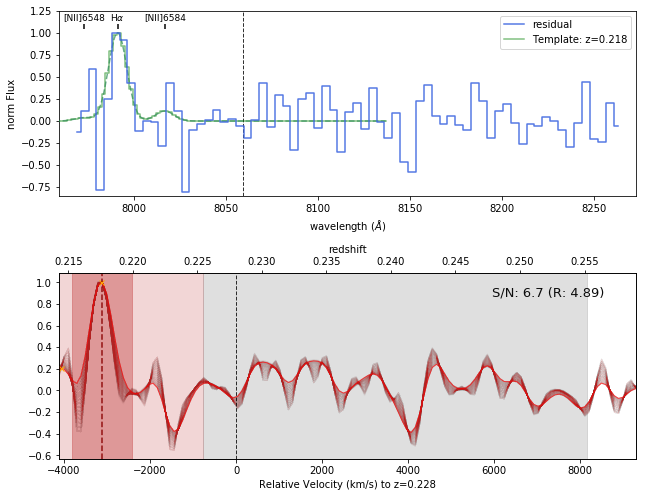

Best z: 0.2169905538244354 Best sigma: 5.0015147835707285
SE Object #1540  z: 0.217  Peak R: 2.100  Detction S/N: 5.194 Peak S/N: 4.841


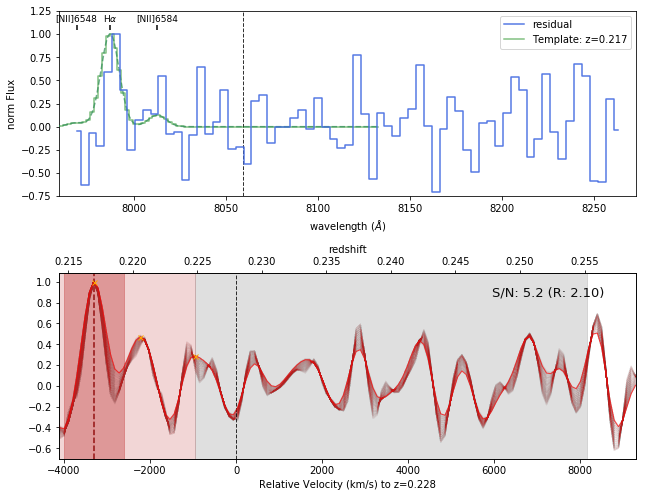

In [24]:
cond = cond2
print(np.sum(cond))
for j, (cc_num) in enumerate(Datacube.cc_nums[cond]):
    ccs, rv, z_ccs, Rs, Contrasts, SNRs, SNR_ps = Datacube.cross_correlation(cc_num, 
                                                                             temp_type="Ha-NII", temp_model="gauss")
    plt.savefig("./A2390NW/fig/xcorr_v1/SNb/CC#%d.png"%(cc_num), dpi=150)
    plt.show()
    plt.close()

20


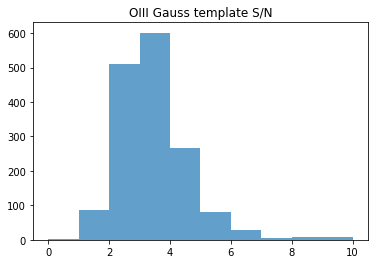

In [27]:
# Gaussian library Hb template (New CC method)
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])

plt.hist(SNR_best_Hb,range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("OIII Gauss template S/N")

cond_b = (SNR_best_Hb>6) & (SNR_best_Ha>3) & (SNR_best_Ha<5) & (dist_edge>10) & (~star_cond)  

print(np.sum(cond_b))

20
S/N Ha: 3.605924726768287
Best z: 0.6367552566941562 Best sigma: 5.0015147835707285
SE Object #110  z: 0.637  Peak R: 1.064  Detction S/N: 6.078 Peak S/N: 6.078


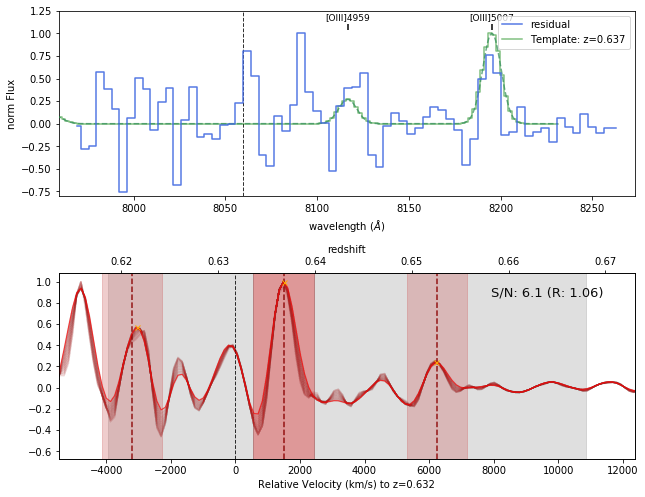

S/N Ha: 3.323210725977717
Best z: 0.6432905781655083 Best sigma: 1.8341303394555193
SE Object #262  z: 0.643  Peak R: 1.602  Detction S/N: 6.411 Peak S/N: 6.411


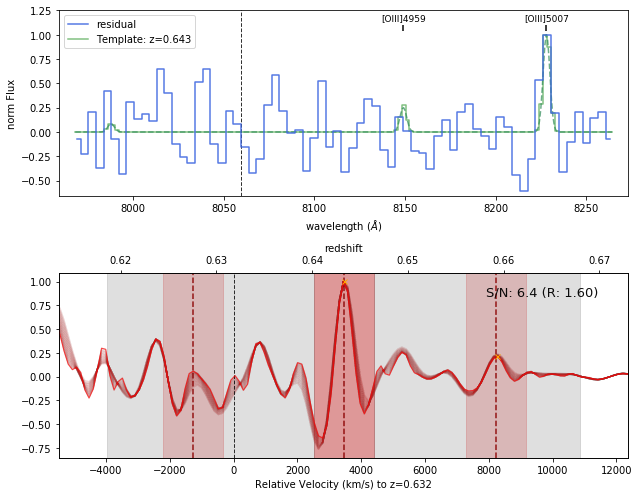

S/N Ha: 3.311217123159436
Best z: 0.6293068997424829 Best sigma: 5.0015147835707285
SE Object #375  z: 0.629  Peak R: 2.841  Detction S/N: 6.285 Peak S/N: 6.285


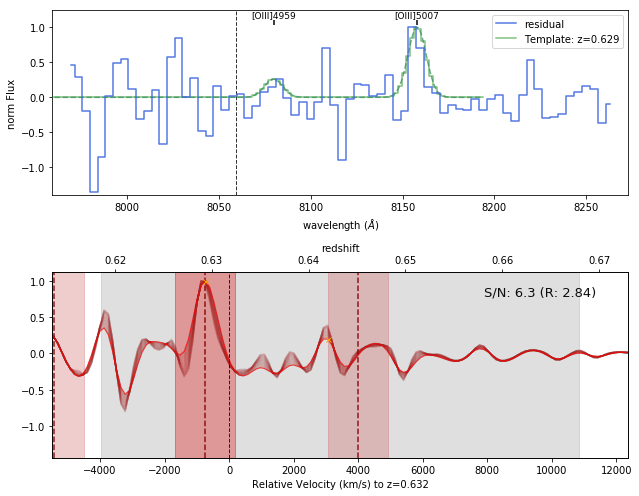

S/N Ha: 3.919951123098246
Best z: 0.6384563498023758 Best sigma: 4.775273037562499
SE Object #490  z: 0.638  Peak R: 2.413  Detction S/N: 6.850 Peak S/N: 6.850


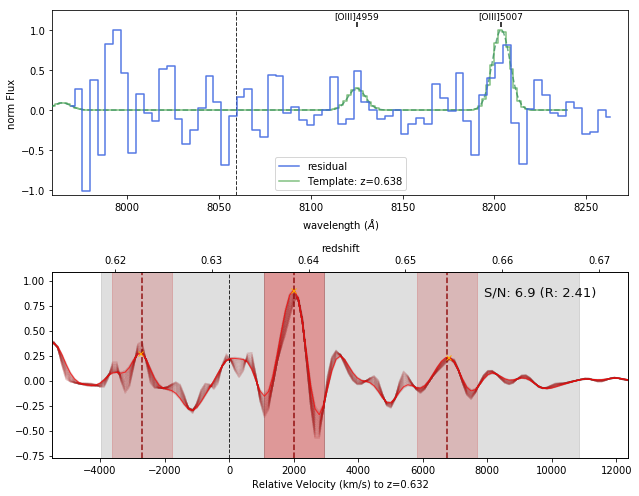

S/N Ha: 3.831100068448986
Best z: 0.629784247124714 Best sigma: 5.0015147835707285
SE Object #535  z: 0.630  Peak R: 4.022  Detction S/N: 6.809 Peak S/N: 6.809


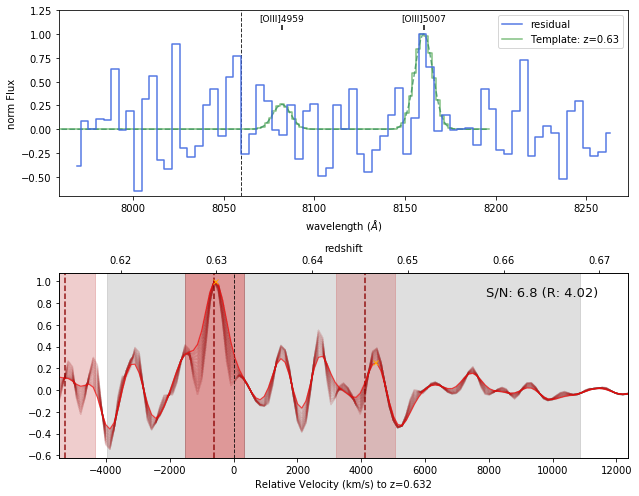

S/N Ha: 3.454379731619209
Best z: 0.6241203018495423 Best sigma: 2.0603720854637486
SE Object #589  z: 0.624  Peak R: 1.977  Detction S/N: 6.167 Peak S/N: 6.167


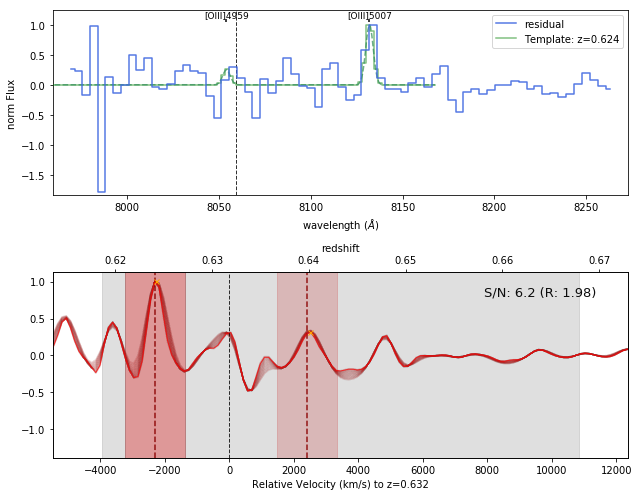

S/N Ha: 3.5216703059674836
Best z: 0.6228132375552718 Best sigma: 4.775273037562499
SE Object #621  z: 0.623  Peak R: 1.971  Detction S/N: 6.238 Peak S/N: 6.238


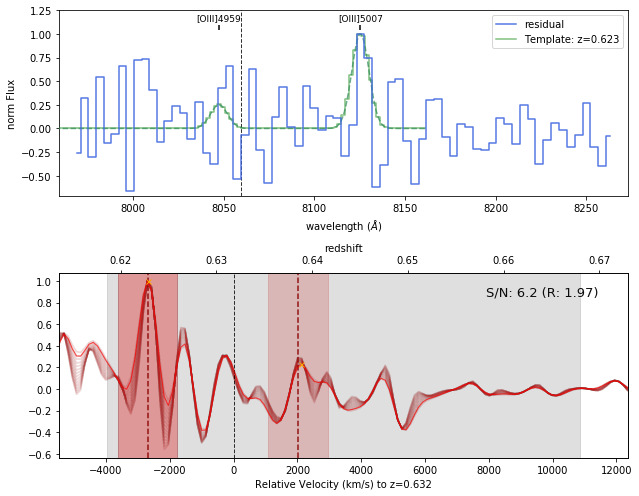

S/N Ha: 4.263087040249884
Best z: 0.6436846069794574 Best sigma: 3.191580815504895
SE Object #684  z: 0.644  Peak R: 1.303  Detction S/N: 6.946 Peak S/N: 6.946


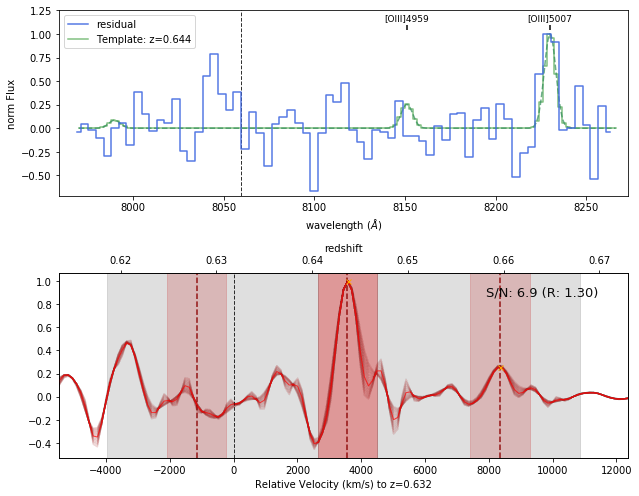

S/N Ha: 3.3791009254803446
Best z: 0.6280414947323535 Best sigma: 2.9653390694966655
SE Object #910  z: 0.628  Peak R: 2.284  Detction S/N: 6.097 Peak S/N: 6.097


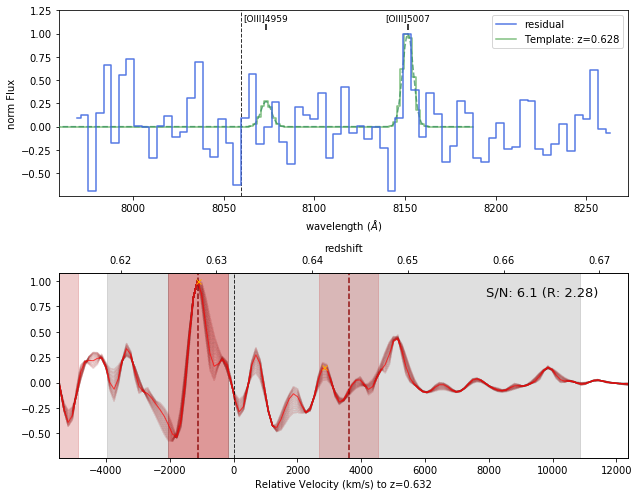

S/N Ha: 3.81735211456693
Best z: 0.623248925653362 Best sigma: 5.0015147835707285
SE Object #982  z: 0.623  Peak R: 3.288  Detction S/N: 6.005 Peak S/N: 6.005


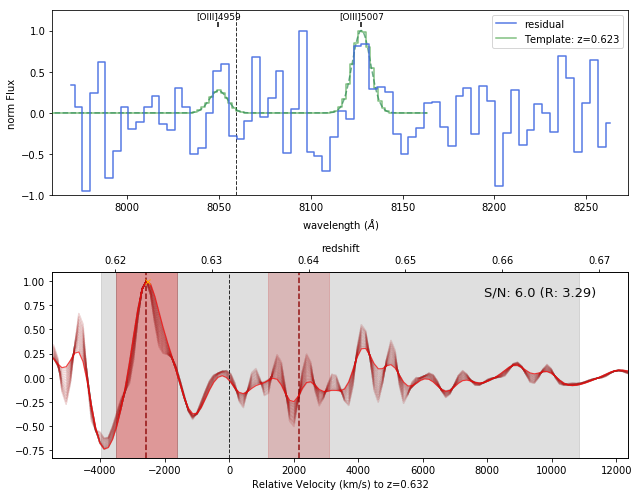

S/N Ha: 3.471964064642681
Best z: 0.6210704851629113 Best sigma: 5.0015147835707285
SE Object #1044  z: 0.621  Peak R: 1.582  Detction S/N: 9.261 Peak S/N: 9.261


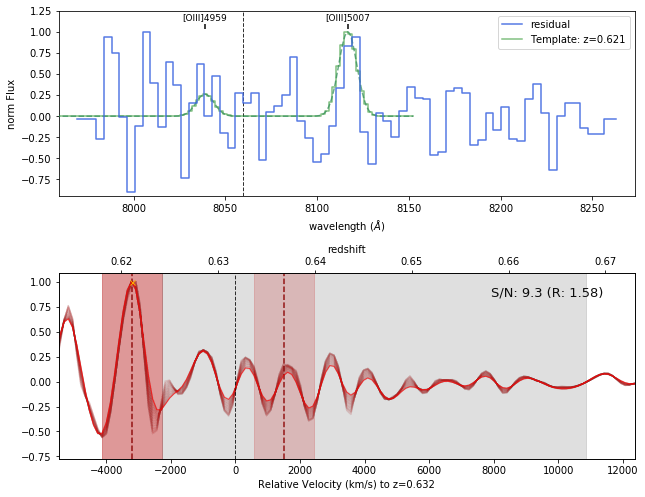

S/N Ha: 3.7502747833922676
Best z: 0.642419201969328 Best sigma: 2.512855577480207
SE Object #1085  z: 0.642  Peak R: 4.338  Detction S/N: 6.029 Peak S/N: 6.029


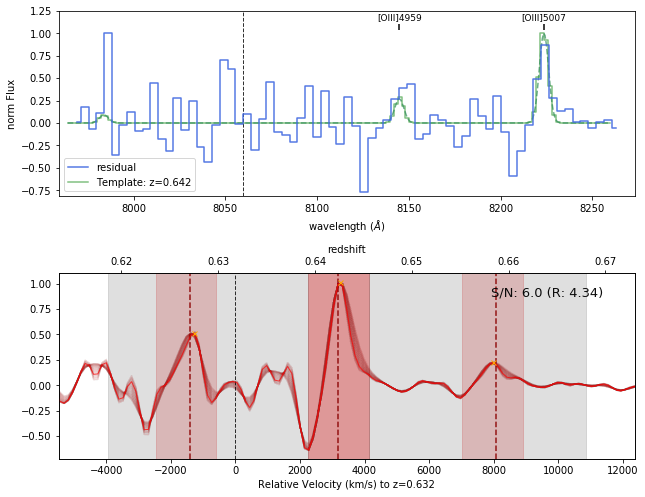

S/N Ha: 3.2813590240657824
Best z: 0.6245559899476324 Best sigma: 4.775273037562499
SE Object #1187  z: 0.625  Peak R: 2.595  Detction S/N: 6.456 Peak S/N: 6.456


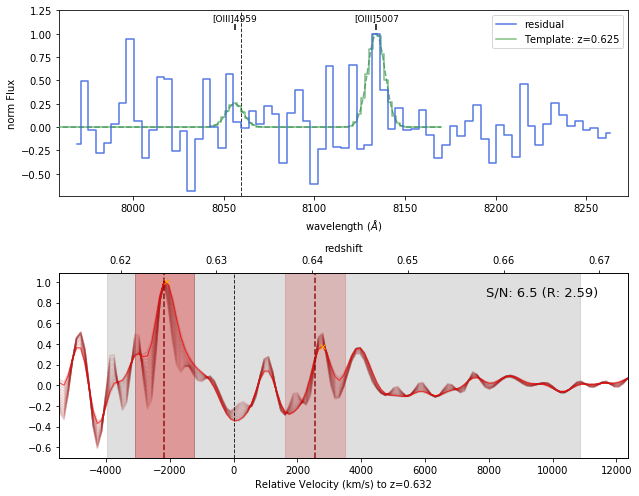

S/N Ha: 4.015127367110588
Best z: 0.6367552566941562 Best sigma: 5.0015147835707285
SE Object #1193  z: 0.637  Peak R: 7.770  Detction S/N: 6.623 Peak S/N: 6.623


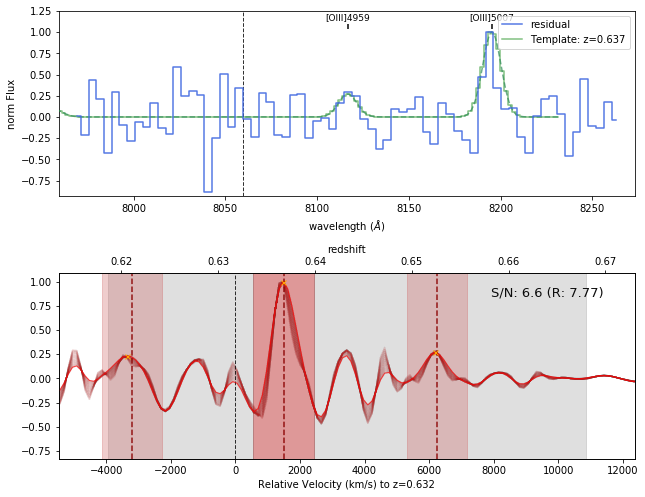

S/N Ha: 4.969897874486464
Best z: 0.6397634140966462 Best sigma: 2.9653390694966655
SE Object #1234  z: 0.640  Peak R: 1.736  Detction S/N: 8.433 Peak S/N: 8.433


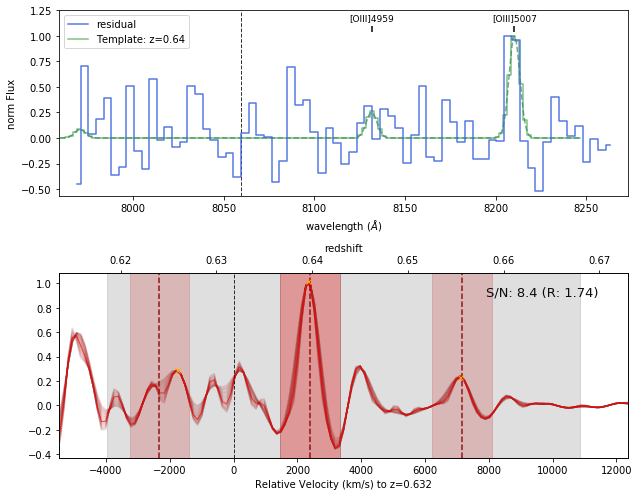

S/N Ha: 3.0868352252723343
Best z: 0.6197217615844999 Best sigma: 5.0015147835707285
SE Object #1243  z: 0.620  Peak R: 1.023  Detction S/N: 7.544 Peak S/N: 7.544


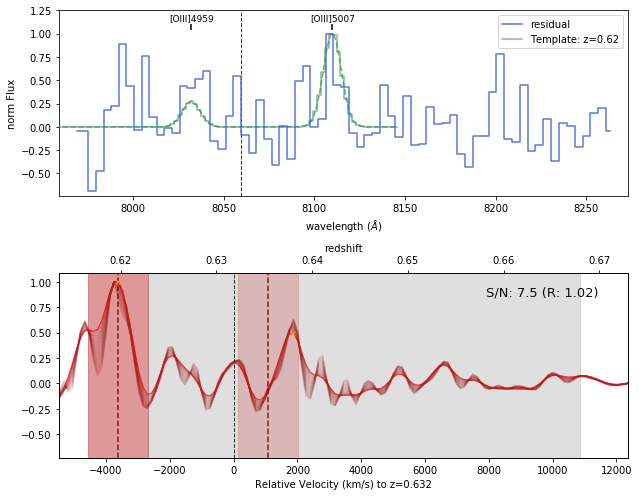

S/N Ha: 4.68503407772019
Best z: 0.6236846137514521 Best sigma: 1.8341303394555193
SE Object #1288  z: 0.624  Peak R: 1.616  Detction S/N: 6.796 Peak S/N: 6.796


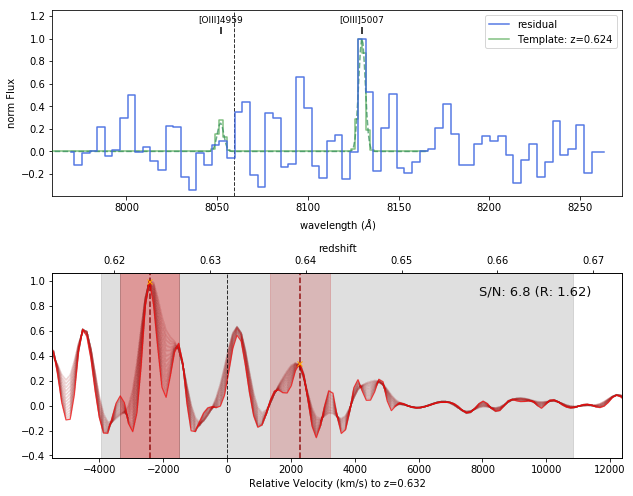

S/N Ha: 3.5488308098356387
Best z: 0.6215061732610014 Best sigma: 3.417822561513124
SE Object #1304  z: 0.622  Peak R: 1.088  Detction S/N: 6.489 Peak S/N: 6.489


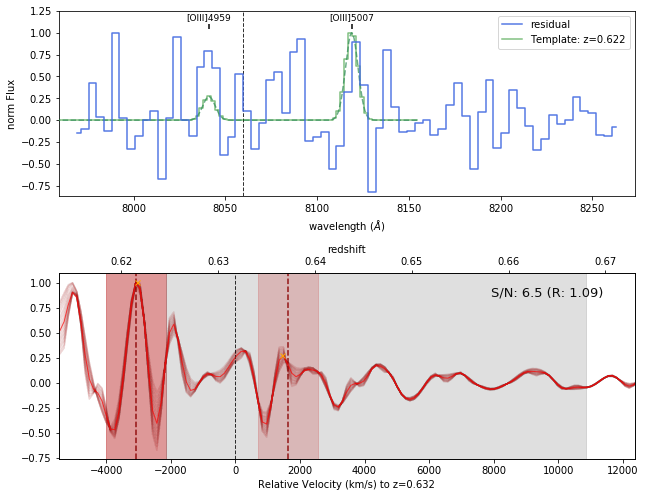

S/N Ha: 3.084801562548752
Best z: 0.6145178198376635 Best sigma: 5.0015147835707285
SE Object #1376  z: 0.615  Peak R: 4.019  Detction S/N: 9.084 Peak S/N: 9.084


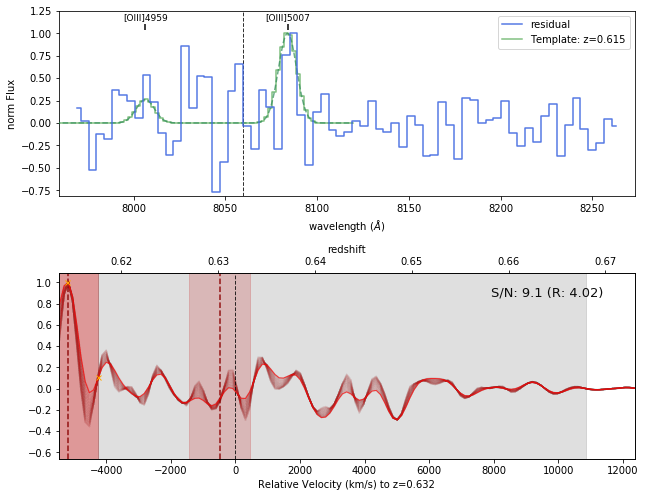

S/N Ha: 3.6688647715878346
Best z: 0.642377542685187 Best sigma: 4.096547799537811
SE Object #1522  z: 0.642  Peak R: 2.441  Detction S/N: 6.169 Peak S/N: 6.169


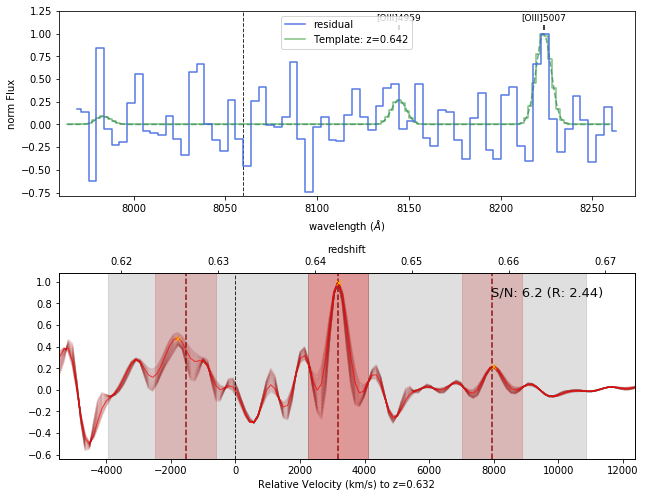

In [28]:
cond = cond_b
print(np.sum(cond))
for j, (cc_num) in enumerate(np.int64(Datacube.cc_nums[cond])):
    print("S/N Ha:",SNR_best_Ha[cc_num-1])
    ccs, rv, z_ccs, Rs, Contrasts, SNRs, SNR_ps = Datacube.cross_correlation(cc_num,
                                                                            temp_type="Hb-OIII", temp_model="gauss")
    plt.savefig("./A2390NW/fig/xcorr_v1/SNc/CC#%d.png"%(cc_num), dpi=150)
    plt.show()
    plt.close()

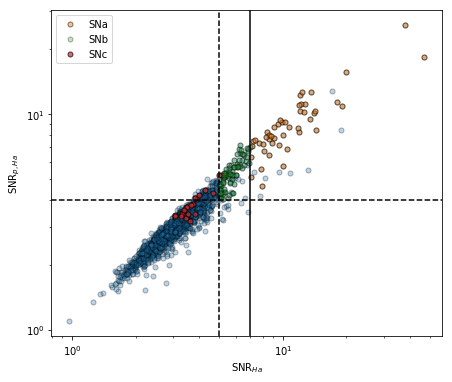

In [29]:
# Ha + Hb
plt.figure(figsize=(7,6))
plt.loglog(SNR_best_Ha, SNRp_best_Ha, ".", ms=10, mec='k', alpha=0.3)
plt.loglog(SNR_best_Ha[cond0], SNRp_best_Ha[cond0], ".", mec='k', ms=10, alpha=0.5, label="SNa")
plt.loglog(SNR_best_Ha[cond2], SNRp_best_Ha[cond2], ".", mec='k', ms=10, alpha=0.3, label="SNb")
plt.loglog(SNR_best_Ha[cond_b], SNRp_best_Ha[cond_b], ".", mec='k', ms=10, alpha=0.7, label="SNc")
plt.axvline(7, ls='-', color='k')
plt.axvline(5, ls='--', color='k')
plt.axhline(4, ls='--', color='k')
plt.xlabel("SNR$_{Ha}$")
plt.ylabel("SNR$_{p,Ha}$")
plt.legend(loc=2)

In [36]:
Datacube.wavl-25

array([7944.25047168, 7948.41848971, 7952.59086987, 7956.76761901,
       7960.94874401, 7965.13425174, 7969.32414909, 7973.51844298,
       7977.71714032, 7981.92024807, 7986.12777316, 7990.33972256,
       7994.55610327, 7998.77692227, 8003.00218658, 8007.23190322,
       8011.46607924, 8015.70472169, 8019.94783763, 8024.19543417,
       8028.44751839, 8032.70409742, 8036.96517838, 8041.23076842,
       8045.50087471, 8049.77550441, 8054.05466472, 8058.33836284,
       8062.626606  , 8066.91940144, 8071.21675641, 8075.51867817,
       8079.82517401, 8084.13625123, 8088.45191715, 8092.77217908,
       8097.09704439, 8101.42652043, 8105.76061457, 8110.09933421,
       8114.44268677, 8118.79067966, 8123.14332032, 8127.50061621,
       8131.86257481, 8136.2292036 , 8140.60051008, 8144.97650178,
       8149.35718623, 8153.74257099, 8158.13266362, 8162.52747171,
       8166.92700286, 8171.33126469, 8175.74026483, 8180.15401094,
       8184.57251067, 8188.99577172, 8193.42380179, 8197.85660

In [32]:
#Composite 
import re
import glob
el_ls = glob.glob("./A2390NW/fig/xcorr_v1/SNa/*.png")
for el in el_ls:
    img_cc = plt.imread(el)
    ind = re.compile(r'\d+').findall(el)[-1]
    img_spec = plt.imread("./A2390NW/fig/spec/SE#%s.png"%ind)
    img_thumb = plt.imread("./A2390NW/fig/img_thumb/SE#%s.png"%ind)
    plt.figure(figsize=(18,9))
    ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((2, 3), (0, 2), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid((2, 3), (1, 2), colspan=1, rowspan=1)
    ax1.imshow(img_cc)
    ax2.imshow(img_spec)
    ax3.imshow(img_thumb)
    ax1.axis("off")
    ax2.axis("off")
    ax3.axis("off")
#     plt.suptitle("Flag: 1",fontsize=18)
    plt.tight_layout()
    plt.savefig("./A2390NW/fig/candidate_v1/SNa/#EL-%s.png"%ind,dpi=150)
    plt.close()

## 5. Centroid Analysis

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import glob
import re
import warnings
warnings.filterwarnings('ignore')
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits", name="A390SE", z0=0.228, SE_catalog="./A2390NW/SE/A2390NW_run2.cat")
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE/segment_run2.fits')
Datacube.read_spec('./A2390NW/A2390NW-spec_v1.fits')
Datacube.generate_template(n_ratio=20, n_stddev=15, n_intp=2, sigma=4, ratio_range = (1.2, 9),
                           temp_type="Ha-NII", ratio_prior="uniform", temp_model='gauss')
Datacube.generate_template(n_ratio=8, n_stddev=15, n_intp=2, sigma=4, ratio_range = (2., 4.),
                           temp_type="Hb-OIII", ratio_prior="uniform", temp_model='gauss')
# Datacube.generate_template(n_ratio=8, n_stddev=15, n_intp=2, sigma=4,
#                            temp_type="OII", ratio_prior="uniform", temp_model='gauss')
Datacube.read_cc('./A2390NW/A2390NW-cc_Hb-OIII_gauss_v1.fits')
Datacube.read_cc('./A2390NW/A2390NW-cc_Ha-NII_gauss_v1.fits')

w = WCS(Datacube.hdu[0].header, naxis=2)
Datacube.assign_BCG_coordinate((328.40351201,17.69544013))
X_BCG, Y_BCG = Datacube.wcs.all_world2pix(Datacube.coord_BCG.ra, Datacube.coord_BCG.dec, 1)
Datacube.pos_BCG = (X_BCG, Y_BCG)

Template: Ha-NII_gauss  Total Number: 300
Template: Hb-OIII_gauss  Total Number: 120
Read cross-correlation result... Template:Hb-OIII_gauss
Read cross-correlation result... Template:Ha-NII_gauss
INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied h

In [6]:
el_ls_v = glob.glob("./A2390NW/fig/candidate_v1/visual/*.png")
ind_v = Num_v-1
Num_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_v]).astype("int"))
Num_v

array([  11,   23,   41,   57,   94,  109,  112,  146,  147,  182,  218,
        221,  229,  242,  288,  316,  341,  352,  359,  384,  405,  421,
        436,  446,  492,  516,  549,  561,  566,  589,  623,  662,  682,
        758,  820,  832,  843,  850,  854,  901,  905,  912,  916,  929,
        979, 1063, 1067, 1083, 1085, 1120, 1129, 1192, 1224, 1234, 1278,
       1282, 1283, 1286, 1298, 1299, 1316, 1400, 1419, 1435, 1451, 1494])

In [22]:
inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])

Num_va = Num_v[(SNR_best_Ha/SNR_best_Hb>1)[Num_v-1]]
ind_v = Num_va-1

Num_va

array([  11,   23,   41,   57,   94,  109,  112,  146,  147,  182,  218,
        221,  229,  316,  341,  359,  384,  405,  421,  436,  446,  492,
        516,  549,  566,  623,  662,  682,  758,  820,  832,  843,  850,
        901,  905,  912,  916,  929, 1083, 1129, 1192, 1224, 1278, 1282,
       1283, 1419, 1435, 1494])

In [23]:
Num_vp=Num_va[(Datacube.z_best[Num_va-1]<0.24) & (Datacube.z_best[Num_va-1]>0.216)]
# ind_v = Num_vp-1
Num_vp

array([  11,   23,   41,   57,  109,  112,  146,  147,  182,  218,  221,
        316,  341,  359,  384,  405,  421,  436,  446,  492,  516,  549,
        566,  623,  662,  758,  820,  832,  843,  850,  901,  905,  912,
        916, 1083, 1129, 1192, 1224, 1278, 1282, 1283, 1419, 1435, 1494])

66
48
44


Text(0.5,0,'A2390W Candidate Redshift')

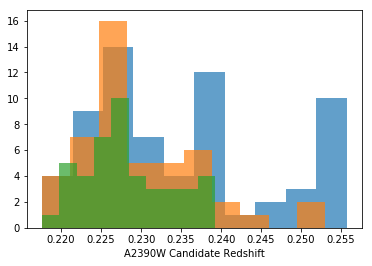

In [24]:
plt.hist(Datacube.z_best[Num_v-1],bins=10,alpha=0.7)
plt.hist(Datacube.z_best[Num_va-1],bins=10,alpha=0.7)
plt.hist(Datacube.z_best[Num_vp-1],bins=10,alpha=0.7)
print(len(Num_v))
print(len(Num_va))
print(len(Num_vp))
plt.xlabel("A2390W Candidate Redshift")

optimal aperture:2.2

PA: 128.857,  Cluster-centric angle: 147.240


(18.382562887597174, 0.5180168621878916, 0.09928943859916928)

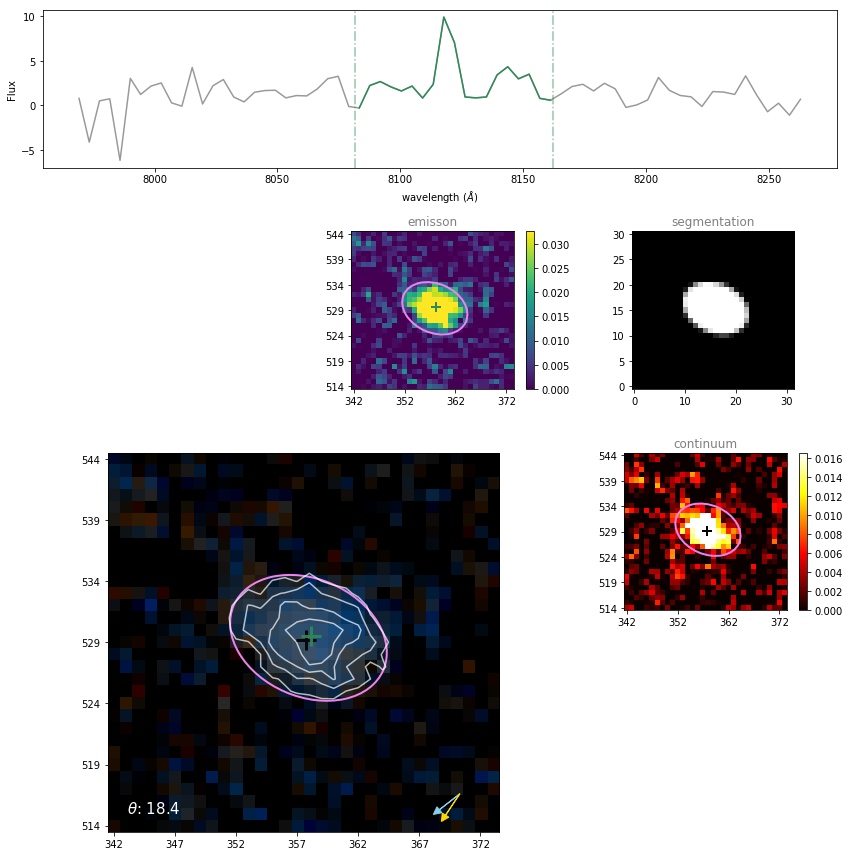

In [11]:
Datacube.centroid_analysis(num=492, centroid_type='APER')

optimal aperture:2.1

PA: 144.517,  Cluster-centric angle: 113.563


(30.95386128402626, 0.520931701196864, 0.19304463623080628)

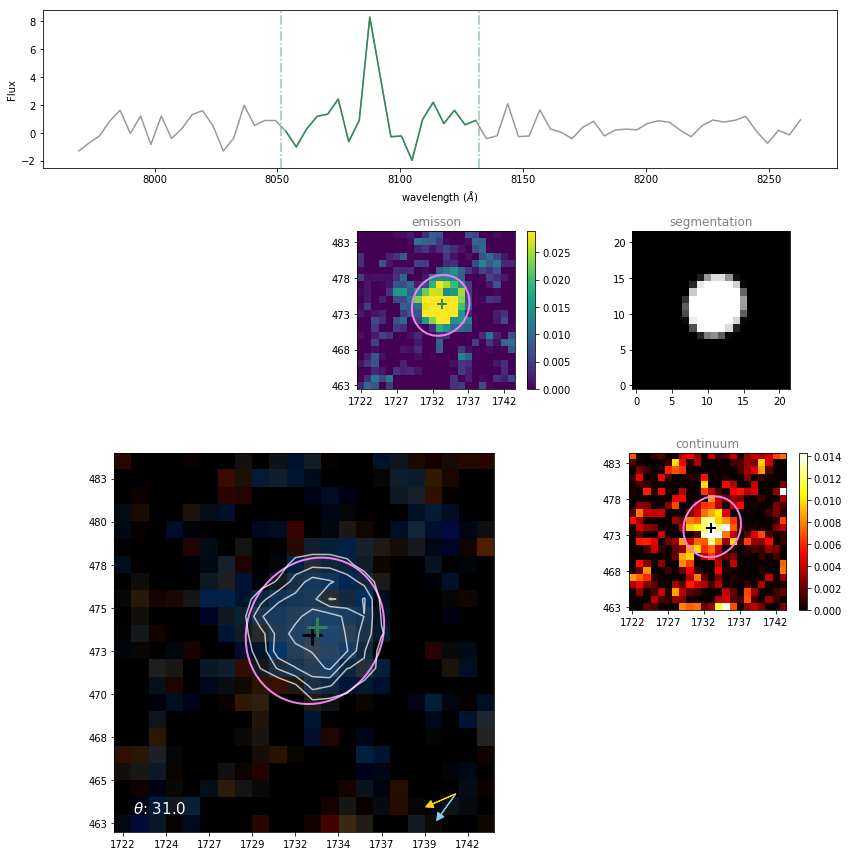

In [12]:
Datacube.centroid_analysis(num=446, centroid_type='APER')

In [10]:
Datacube.centroid_analysis_all(Num_v, centroid_type='APER')

Current Model:  Ha-NII_gauss
#EL-1
optimal aperture:4.5

PA: 46.337,  Cluster-centric angle: 105.612
#EL-2
optimal aperture:4.5
Unable to compute centroid! Error raised.
#EL-3
optimal aperture:4.5

PA: 219.498,  Cluster-centric angle: 106.106
#EL-4
optimal aperture:2.5

PA: 218.777,  Cluster-centric angle: 132.597
#EL-5
optimal aperture:2.0

PA: 7.287,  Cluster-centric angle: 101.905
#EL-6
optimal aperture:4.4

PA: 70.871,  Cluster-centric angle: 107.098
#EL-7
optimal aperture:2.6

PA: 118.083,  Cluster-centric angle: 126.905
#EL-8
optimal aperture:2.7

PA: 221.748,  Cluster-centric angle: 103.183
#EL-9
optimal aperture:2.1

PA: 179.484,  Cluster-centric angle: 133.609
#EL-10
optimal aperture:3.1

PA: 206.049,  Cluster-centric angle: 118.387
#EL-11
optimal aperture:1.9

PA: 232.106,  Cluster-centric angle: 115.137
#EL-12
optimal aperture:2.0

PA: 359.612,  Cluster-centric angle: 106.154
#EL-13
optimal aperture:2.0

PA: 171.491,  Cluster-centric angle: 141.289
#EL-14
optimal aperture:1.


PA: 84.237,  Cluster-centric angle: 103.082
#EL-113
optimal aperture:2.0

PA: 235.791,  Cluster-centric angle: 103.103
#EL-114
optimal aperture:1.8

PA: 288.861,  Cluster-centric angle: 105.486
#EL-115
optimal aperture:2.5

PA: 10.482,  Cluster-centric angle: 111.869
#EL-116
optimal aperture:3.1

PA: 139.430,  Cluster-centric angle: 113.375
#EL-117
optimal aperture:2.1

PA: 111.568,  Cluster-centric angle: 144.453
#EL-118
optimal aperture:2.2

PA: 202.779,  Cluster-centric angle: 102.866
#EL-119
optimal aperture:2.1

PA: 149.985,  Cluster-centric angle: 110.257
#EL-120
optimal aperture:2.0

PA: 349.774,  Cluster-centric angle: 107.625
#EL-121
optimal aperture:1.7

PA: 127.352,  Cluster-centric angle: 137.230
#EL-122
optimal aperture:2.3

PA: 321.775,  Cluster-centric angle: 116.620
#EL-123
optimal aperture:2.4

PA: 194.550,  Cluster-centric angle: 112.950
#EL-124
optimal aperture:2.1

PA: 306.919,  Cluster-centric angle: 104.283
#EL-125
optimal aperture:2.3

PA: 307.341,  Cluster-cent

optimal aperture:2.2

PA: 278.131,  Cluster-centric angle: 122.554
#EL-225
optimal aperture:2.1

PA: 235.969,  Cluster-centric angle: 139.610
#EL-226
optimal aperture:2.8

PA: 95.964,  Cluster-centric angle: 105.845
#EL-227
optimal aperture:3.1

PA: 215.764,  Cluster-centric angle: 106.539
#EL-228
optimal aperture:1.8

PA: 272.126,  Cluster-centric angle: 109.235
#EL-229
optimal aperture:2.2

PA: 97.519,  Cluster-centric angle: 149.253
#EL-230
optimal aperture:2.0

PA: 340.964,  Cluster-centric angle: 105.570
#EL-231
optimal aperture:2.4

PA: 43.867,  Cluster-centric angle: 121.336
#EL-232
optimal aperture:1.8

PA: 100.520,  Cluster-centric angle: 111.804
#EL-233
optimal aperture:1.8

PA: 22.308,  Cluster-centric angle: 107.699
#EL-234
optimal aperture:2.1

PA: 301.753,  Cluster-centric angle: 127.793
#EL-235
optimal aperture:2.3

PA: 255.415,  Cluster-centric angle: 110.836
#EL-236
optimal aperture:1.8

PA: 40.430,  Cluster-centric angle: 106.198
#EL-237
optimal aperture:3.6

PA: 321.

PA: 147.979,  Cluster-centric angle: 129.263
#EL-340
optimal aperture:3.6

PA: 286.755,  Cluster-centric angle: 113.159
#EL-341
optimal aperture:1.7

PA: 235.421,  Cluster-centric angle: 108.623
#EL-342
optimal aperture:2.3

PA: 132.316,  Cluster-centric angle: 148.307
#EL-343
optimal aperture:2.0

PA: 353.840,  Cluster-centric angle: 115.983
#EL-344
optimal aperture:2.1

PA: 23.687,  Cluster-centric angle: 145.663
#EL-345
optimal aperture:1.9

PA: 343.006,  Cluster-centric angle: 109.535
#EL-346
optimal aperture:2.6

PA: 27.272,  Cluster-centric angle: 142.643
#EL-347
optimal aperture:2.8

PA: 307.718,  Cluster-centric angle: 123.063
#EL-348
optimal aperture:2.4

PA: 339.318,  Cluster-centric angle: 109.632
#EL-349
optimal aperture:3.0

PA: 119.616,  Cluster-centric angle: 112.184
#EL-350
optimal aperture:1.8

PA: 42.681,  Cluster-centric angle: 122.117
#EL-351
optimal aperture:1.9

PA: 167.193,  Cluster-centric angle: 150.326
#EL-352
optimal aperture:1.9

PA: 180.759,  Cluster-centri

PA: 72.694,  Cluster-centric angle: 115.821
#EL-457
optimal aperture:2.1

PA: 119.933,  Cluster-centric angle: 152.212
#EL-458
optimal aperture:2.4

PA: 267.812,  Cluster-centric angle: 113.148
#EL-459
optimal aperture:4.5

PA: 223.638,  Cluster-centric angle: 115.277
#EL-460
optimal aperture:2.4

PA: 91.326,  Cluster-centric angle: 116.980
#EL-461
optimal aperture:2.3

PA: 139.703,  Cluster-centric angle: 127.634
#EL-462
optimal aperture:2.3

PA: 222.121,  Cluster-centric angle: 117.234
#EL-463
optimal aperture:2.6

PA: 286.577,  Cluster-centric angle: 116.950
#EL-464
optimal aperture:1.9

PA: 85.080,  Cluster-centric angle: 158.296
#EL-465
optimal aperture:2.1

PA: 247.128,  Cluster-centric angle: 114.234
#EL-466
optimal aperture:2.3

PA: 88.127,  Cluster-centric angle: 144.637
#EL-467
optimal aperture:2.0

PA: 44.487,  Cluster-centric angle: 140.192
#EL-468
optimal aperture:2.2

PA: 56.849,  Cluster-centric angle: 133.044
#EL-469
optimal aperture:2.5

PA: 333.282,  Cluster-centric a

PA: 288.334,  Cluster-centric angle: 114.496
#EL-576
optimal aperture:2.6

PA: 66.371,  Cluster-centric angle: 159.178
#EL-577
optimal aperture:2.3

PA: 126.702,  Cluster-centric angle: 144.080
#EL-578
optimal aperture:2.9

PA: 297.479,  Cluster-centric angle: 118.252
#EL-579
optimal aperture:2.6

PA: 347.235,  Cluster-centric angle: 129.046
#EL-580
optimal aperture:3.4

PA: 228.063,  Cluster-centric angle: 154.312
#EL-581
optimal aperture:2.1

PA: 200.315,  Cluster-centric angle: 148.862
#EL-582
optimal aperture:1.9

PA: 291.148,  Cluster-centric angle: 135.208
#EL-583
optimal aperture:1.8

PA: 236.792,  Cluster-centric angle: 120.040
#EL-584
optimal aperture:3.3

PA: 130.919,  Cluster-centric angle: 118.721
#EL-585
optimal aperture:2.4

PA: 70.165,  Cluster-centric angle: 120.822
#EL-586
optimal aperture:1.9

PA: 114.754,  Cluster-centric angle: 154.381
#EL-587
optimal aperture:2.5

PA: 8.279,  Cluster-centric angle: 135.151
#EL-588
optimal aperture:2.0

PA: 307.294,  Cluster-centric


PA: 91.513,  Cluster-centric angle: 129.178
#EL-692
optimal aperture:3.7

PA: 339.423,  Cluster-centric angle: 132.001
#EL-693
optimal aperture:1.6

PA: 353.190,  Cluster-centric angle: 126.643
#EL-694
optimal aperture:2.5

PA: 58.871,  Cluster-centric angle: 127.883
#EL-695
optimal aperture:4.5

PA: 268.070,  Cluster-centric angle: 159.764
#EL-696
optimal aperture:4.4

PA: 79.298,  Cluster-centric angle: 153.337
#EL-697
optimal aperture:2.4

PA: 69.644,  Cluster-centric angle: 157.152
#EL-698
optimal aperture:1.8

PA: 31.154,  Cluster-centric angle: 118.727
#EL-699
optimal aperture:3.3

PA: 289.960,  Cluster-centric angle: 129.915
#EL-700
optimal aperture:1.9

PA: 231.947,  Cluster-centric angle: 145.916
#EL-701
optimal aperture:2.5

PA: 152.629,  Cluster-centric angle: 123.963
#EL-702
optimal aperture:3.3

PA: 87.034,  Cluster-centric angle: 117.417
#EL-703
optimal aperture:2.4

PA: 34.609,  Cluster-centric angle: 141.765
#EL-704
optimal aperture:2.6

PA: 205.511,  Cluster-centric a


PA: 95.694,  Cluster-centric angle: 127.687
#EL-819
optimal aperture:2.0

PA: 59.256,  Cluster-centric angle: 122.436
#EL-820
optimal aperture:2.2

PA: 325.110,  Cluster-centric angle: 139.514
#EL-821
optimal aperture:2.2

PA: 212.639,  Cluster-centric angle: 154.936
#EL-822
optimal aperture:3.3

PA: 326.266,  Cluster-centric angle: 121.041
#EL-823
optimal aperture:2.3

PA: 301.132,  Cluster-centric angle: 151.947
#EL-824
optimal aperture:3.9

PA: 107.673,  Cluster-centric angle: 121.071
#EL-825
optimal aperture:3.4

PA: 10.108,  Cluster-centric angle: 130.620
#EL-826
optimal aperture:2.8

PA: 239.750,  Cluster-centric angle: 145.774
#EL-827
optimal aperture:4.0

PA: 327.310,  Cluster-centric angle: 152.811
#EL-828
optimal aperture:2.2

PA: 143.499,  Cluster-centric angle: 127.197
#EL-829
optimal aperture:2.3

PA: 89.338,  Cluster-centric angle: 152.913
#EL-830
optimal aperture:1.8

PA: 202.746,  Cluster-centric angle: 167.673
#EL-831
optimal aperture:2.1

PA: 212.100,  Cluster-centri


PA: 191.941,  Cluster-centric angle: 155.558
#EL-929
optimal aperture:2.2

PA: 164.579,  Cluster-centric angle: 139.626
#EL-930
optimal aperture:1.9

PA: 271.121,  Cluster-centric angle: 135.450
#EL-931
optimal aperture:3.7

PA: 59.211,  Cluster-centric angle: 139.291
#EL-932
optimal aperture:4.5

PA: 4.154,  Cluster-centric angle: 148.282
#EL-933
optimal aperture:3.7

PA: 189.220,  Cluster-centric angle: 172.573
#EL-934
optimal aperture:2.1

PA: 46.179,  Cluster-centric angle: 133.328
#EL-935
optimal aperture:2.1

PA: 90.213,  Cluster-centric angle: 144.916
#EL-936
optimal aperture:2.7

PA: 158.396,  Cluster-centric angle: 140.167
#EL-937
optimal aperture:3.0

PA: 174.919,  Cluster-centric angle: 132.727
#EL-938
optimal aperture:2.0

PA: 315.084,  Cluster-centric angle: 133.835
#EL-939
optimal aperture:2.6

PA: 186.840,  Cluster-centric angle: 143.179
#EL-940
optimal aperture:3.4

PA: 241.505,  Cluster-centric angle: 134.047
#EL-941
optimal aperture:1.9

PA: 204.781,  Cluster-centric

#EL-1049
optimal aperture:3.6

PA: 275.372,  Cluster-centric angle: 170.113
#EL-1050
optimal aperture:2.0

PA: 292.535,  Cluster-centric angle: 156.731
#EL-1051
optimal aperture:1.8

PA: 142.825,  Cluster-centric angle: 137.427
#EL-1052
optimal aperture:2.9

PA: 43.224,  Cluster-centric angle: 158.134
#EL-1053
optimal aperture:2.1

PA: 253.132,  Cluster-centric angle: 141.209
#EL-1054
optimal aperture:2.0

PA: 163.634,  Cluster-centric angle: 135.240
#EL-1055
optimal aperture:2.0

PA: 315.803,  Cluster-centric angle: 147.630
#EL-1056
optimal aperture:2.1

PA: 219.014,  Cluster-centric angle: 146.125
#EL-1057
optimal aperture:2.5

PA: 53.725,  Cluster-centric angle: 148.157
#EL-1058
optimal aperture:2.2

PA: 282.637,  Cluster-centric angle: 146.352
#EL-1059
optimal aperture:2.6

PA: 267.552,  Cluster-centric angle: 166.921
#EL-1060
optimal aperture:2.3

PA: 214.798,  Cluster-centric angle: 163.359
#EL-1061
optimal aperture:1.7

PA: 272.370,  Cluster-centric angle: 141.088
#EL-1062
optim

optimal aperture:2.6

PA: 343.454,  Cluster-centric angle: 143.870
#EL-1164
optimal aperture:2.5

PA: 194.321,  Cluster-centric angle: 143.383
#EL-1165
optimal aperture:2.3

PA: 178.657,  Cluster-centric angle: 159.044
#EL-1166
optimal aperture:2.0

PA: 30.038,  Cluster-centric angle: 129.927
#EL-1167
optimal aperture:2.5

PA: 160.604,  Cluster-centric angle: 134.933
#EL-1168
optimal aperture:2.0

PA: 191.151,  Cluster-centric angle: 145.746
#EL-1169
optimal aperture:2.7

PA: 354.000,  Cluster-centric angle: 131.503
#EL-1170
optimal aperture:3.3

PA: 260.549,  Cluster-centric angle: 157.521
#EL-1171
optimal aperture:2.3

PA: 166.621,  Cluster-centric angle: 135.690
#EL-1172
optimal aperture:1.8

PA: 342.699,  Cluster-centric angle: 156.939
#EL-1173
optimal aperture:1.9

PA: 86.913,  Cluster-centric angle: 153.232
#EL-1174
optimal aperture:2.2

PA: 155.597,  Cluster-centric angle: 132.710
#EL-1175
optimal aperture:2.3

PA: 181.095,  Cluster-centric angle: 139.737
#EL-1176
optimal apertu


PA: 253.852,  Cluster-centric angle: 145.803
#EL-1278
optimal aperture:2.6

PA: 186.547,  Cluster-centric angle: 153.401
#EL-1279
optimal aperture:2.5

PA: 310.629,  Cluster-centric angle: 136.930
#EL-1280
optimal aperture:1.8

PA: 177.988,  Cluster-centric angle: 132.072
#EL-1281
optimal aperture:2.2

PA: 138.706,  Cluster-centric angle: 145.206
#EL-1282
optimal aperture:2.1

PA: 358.688,  Cluster-centric angle: 142.683
#EL-1283
optimal aperture:2.4

PA: 212.648,  Cluster-centric angle: 148.121
#EL-1284
optimal aperture:2.6

PA: 272.158,  Cluster-centric angle: 169.900
#EL-1285
optimal aperture:2.1

PA: 334.047,  Cluster-centric angle: 152.234
#EL-1286
optimal aperture:2.2

PA: 114.570,  Cluster-centric angle: 142.368
#EL-1287
optimal aperture:2.5

PA: 107.841,  Cluster-centric angle: 150.732
#EL-1288
optimal aperture:2.9

PA: 333.883,  Cluster-centric angle: 128.911
#EL-1289
optimal aperture:3.4

PA: 133.380,  Cluster-centric angle: 137.457
#EL-1290
optimal aperture:4.1

PA: 273.767

optimal aperture:3.3

PA: 124.527,  Cluster-centric angle: 162.838
#EL-1389
optimal aperture:2.0

PA: 225.019,  Cluster-centric angle: 128.809
#EL-1390
optimal aperture:2.6

PA: 69.738,  Cluster-centric angle: 140.025
#EL-1391
optimal aperture:1.9

PA: 44.970,  Cluster-centric angle: 156.434
#EL-1392
optimal aperture:1.7

PA: 14.658,  Cluster-centric angle: 137.248
#EL-1393
optimal aperture:2.3

PA: 310.376,  Cluster-centric angle: 145.745
#EL-1394
optimal aperture:2.3

PA: 107.168,  Cluster-centric angle: 160.901
#EL-1395
optimal aperture:2.3

PA: 311.267,  Cluster-centric angle: 143.640
#EL-1396
optimal aperture:2.0

PA: 146.255,  Cluster-centric angle: 136.760
#EL-1397
optimal aperture:3.7

PA: 146.249,  Cluster-centric angle: 135.341
#EL-1398
optimal aperture:2.6

PA: 247.563,  Cluster-centric angle: 155.209
#EL-1399
optimal aperture:3.4

PA: 4.046,  Cluster-centric angle: 161.426
#EL-1400
optimal aperture:1.7

PA: 108.520,  Cluster-centric angle: 128.630
#EL-1401
optimal aperture:

#EL-1507
optimal aperture:2.8

PA: 190.500,  Cluster-centric angle: 160.423
#EL-1508
optimal aperture:2.0

PA: 314.600,  Cluster-centric angle: 161.277
#EL-1509
optimal aperture:1.7

PA: 102.983,  Cluster-centric angle: 170.987
#EL-1510
optimal aperture:2.7

PA: 237.130,  Cluster-centric angle: 144.373
#EL-1511
optimal aperture:2.4

PA: 138.586,  Cluster-centric angle: 153.941
#EL-1512
optimal aperture:3.5

PA: 295.677,  Cluster-centric angle: 129.253
#EL-1513
optimal aperture:3.4

PA: 129.933,  Cluster-centric angle: 141.528
#EL-1514
optimal aperture:4.4

PA: 309.265,  Cluster-centric angle: 149.230
#EL-1515
optimal aperture:2.1

PA: 266.772,  Cluster-centric angle: 149.434
#EL-1516
optimal aperture:2.2

PA: 256.227,  Cluster-centric angle: 139.962
#EL-1517
optimal aperture:2.1

PA: 46.625,  Cluster-centric angle: 137.315
#EL-1518
optimal aperture:1.9

PA: 315.560,  Cluster-centric angle: 169.175
#EL-1519
optimal aperture:2.5

PA: 55.839,  Cluster-centric angle: 143.042
#EL-1520
optim

-1.6681391358222852


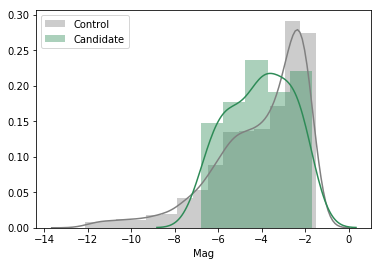

In [11]:
import seaborn as sns
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

mag_all = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
ind_notv = np.setdiff1d(Datacube.Tab_SE["NUMBER"]-1, ind_v)
mag_ctrl = pd.Series(mag_all[ind_notv]).dropna()
# mag_cut = (np.percentile(mag_no_nan, 2.5), np.percentile(mag_no_nan, 97.5))


sns.distplot(mag_ctrl,label="Control",color="gray",bins=15)
mag_el = pd.Series(mag_all[ind_v])
mag_cut = mag_el.max()
print (mag_cut)
sns.distplot(mag_el,label="Candidate",color="seagreen")
# plt.axvline(mag_cut[0],color='k',ls='--')
# plt.axvline(mag_cut[1],color='k',ls='--')
plt.xlabel("Mag")
plt.legend()

In [12]:
Datacube.construct_control(Num_v=Num_v, mag_cut=(mag_el.min(),mag_el.max()), dist_cut=50, bootstraped=False)

Datacube.diff_angles_v = Datacube.diff_angles[ind_v]
Datacube.diff_centroids_v = Datacube.diff_centroids[ind_v]
Datacube.dist_clus_cens_v = Datacube.dist_clus_cens[ind_v]
import warnings
warnings.filterwarnings('ignore')

Isophotal area threshold:  9.0
Distance to field edge threshold:  50
Control Sample : n=843


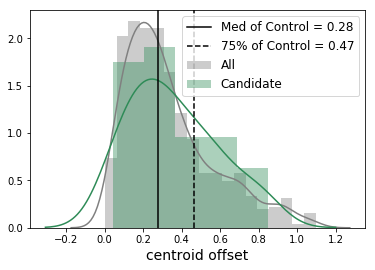

In [10]:
#ISO p (distortion corrected)
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5,0.75])

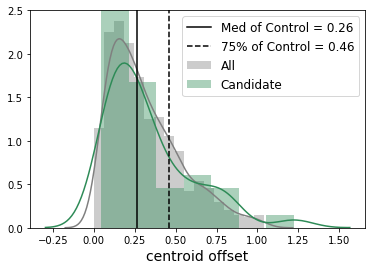

In [77]:
#APER p (distortion corrected)
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5,0.75])

# of offset > 50% : 29
# of offset > 75% : 16


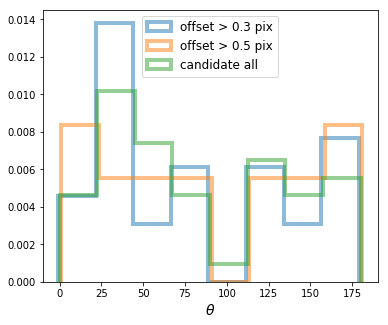

In [27]:
#ISO p (distortion corrected)
plt.figure(figsize=(6,5))
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.75], b=9)

# of offset > 50% : 19
# of offset > 75% : 10


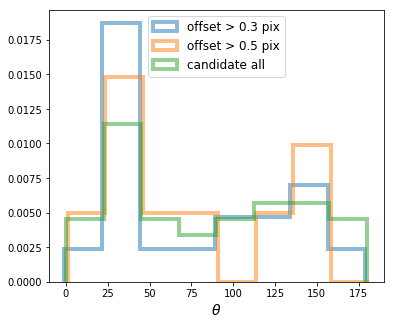

In [78]:
#APER p (distortion corrected)
plt.figure(figsize=(6,5))
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.75], b=9)

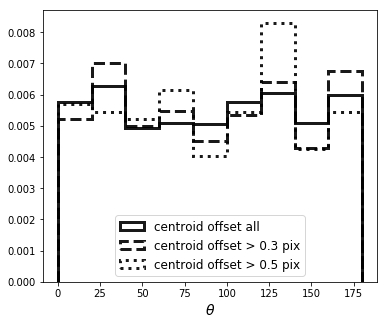

In [28]:
#ISO p (new CC)
plt.figure(figsize=(6,5))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.75],b=10)

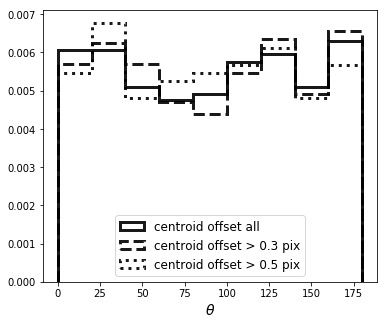

In [79]:
#APER iter p (new CC)
plt.figure(figsize=(6,5))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.75],b=10)

In [29]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#ISO p (new CC)
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,75)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c[Datacube.diff_centroids_c>p]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

K-S: p-value=0.488
K-S: p-value=0.962
K-S: p-value=0.355
K-S: p-value=0.982
Anderson_ksampResult(statistic=-0.3775645809146094, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.5174644536531582)
Anderson_ksampResult(statistic=-0.9282435188153914, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.9344609510844271)
Anderson_ksampResult(statistic=-0.18877388380191834, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.42404864737130005)
Anderson_ksampResult(statistic=-0.9594839048985904, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.9667685976721193)


In [32]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#APER iter p (new CC)
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,75)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c[Datacube.diff_centroids_c>p]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

K-S: p-value=0.302
K-S: p-value=0.323
K-S: p-value=0.339
K-S: p-value=0.392
Anderson_ksampResult(statistic=0.1757523251475053, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.29018902152348347)
Anderson_ksampResult(statistic=0.07679010075113596, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.32145096741163137)
Anderson_ksampResult(statistic=-0.027099317860072594, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.35809009278575354)
Anderson_ksampResult(statistic=-0.20605086984878937, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.4318131559920441)


In [14]:
import pandas as pd
df = pd.DataFrame({"diff_angle":np.concatenate([Datacube.diff_angles_v, Datacube.diff_angles_c]),
                 "diff_centroid":np.concatenate([Datacube.diff_centroids_v, Datacube.diff_centroids_c]),
                 "type":np.concatenate([['v']*len(Datacube.diff_centroids_v), ['c']*len(Datacube.diff_centroids_c)])})
df.to_csv('./A2390NW/centroid_analysis_A2390NW_iso.csv',sep=',',index=None)

In [13]:
import pandas as pd
coords = w.pixel_to_world(Datacube.Tab_SE["X_IMAGE"], Datacube.Tab_SE["Y_IMAGE"])
ind_v = Num_v-1
ind_c = Datacube.Num_c-1

inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])


df = pd.DataFrame({"ID":np.concatenate([ind_v + 1, Datacube.Num_c]),
                   "ra":np.concatenate([coords.ra[ind_v], coords.ra[ind_c]]),
                   "dec":np.concatenate([coords.dec[ind_v], coords.dec[ind_c]]),
                   "redshift":np.concatenate([Datacube.z_best[ind_v], Datacube.z_best[ind_c]]),
                   "SNR_Ha": np.concatenate([SNR_best_Ha[ind_v], SNR_best_Ha[ind_c]]),
                   "SNR_OIII": np.concatenate([SNR_best_Hb[ind_v], SNR_best_Hb[ind_c]]),
                   "dist_edge": np.concatenate([Datacube.dist_edge[ind_v], Datacube.dist_edge[ind_c]]),
                   "diff_angle":np.concatenate([Datacube.diff_angles_v, Datacube.diff_angles_c]),
                   "diff_centroid":np.concatenate([Datacube.diff_centroids_v, Datacube.diff_centroids_c]),
                   "type":np.concatenate([['v']*len(Datacube.diff_centroids_v), ['c']*len(Datacube.diff_centroids_c)])})
df.to_csv('./A2390NW/centroid_analysis_A2390NW_aper_all.csv',sep=',',index=None)

### Cross-match with Central Field

In [10]:
import pyregion
import glob
# Read flanking field
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits", name="A2390NW", z0=0.228, 
                         SE_catalog="./A2390NW/SE/A2390NW_run2.cat")

w = WCS(Datacube.hdu[0].header, naxis=2)
Datacube.assign_BCG_coordinate((328.40351201,17.69544013))

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

In [6]:
# Convert pix to world for SE field
RAs, DECs = w.all_pix2world(Datacube.Tab_SE["X_IMAGE"], Datacube.Tab_SE["Y_IMAGE"], 1)
Coords = SkyCoord(RAs, DECs, frame='icrs', unit="deg")
Coords

<SkyCoord (ICRS): (ra, dec) in deg
    [(328.19444005, 17.75120605), (328.19315031, 17.75044313),
     (328.24517187, 17.73906214), ..., (328.3312854 , 17.90893709),
     (328.19223948, 17.90368561), (328.2960641 , 17.90845903)]>

In [7]:
# Read central field
Datacube_C = Read_Datacube("/home/qliu/data/A2390C_cube.fits", name="A390C", z0=0.228, 
                           SE_catalog="./A2390C/SE/A2390C_run3.cat")

id_BCG_C = np.argmin((Datacube_C.Tab_SE["X_IMAGE"]-980)**2 + (Datacube_C.Tab_SE["Y_IMAGE"]-1315)**2)
Datacube_C.assign_BCG_position(id_BCG=id_BCG_C)

w_C = WCS(Datacube_C.hdu[0].header, naxis=2)
ra_BCG_C, dec_BCG_C = w_C.all_pix2world(Datacube_C.pos_BCG[0], Datacube_C.pos_BCG[1], 1)
Datacube_C.assign_BCG_coordinate((ra_BCG_C,dec_BCG_C))

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

In [8]:
RAs_C, DECs_C = w_C.all_pix2world(Datacube_C.Tab_SE["X_IMAGE"], Datacube_C.Tab_SE["Y_IMAGE"], 1)
Coords_C = SkyCoord(RAs_C, DECs_C, frame='icrs', unit="deg")
Coords_C

<SkyCoord (ICRS): (ra, dec) in deg
    [(328.42967535, 17.64398462), (328.39814878, 17.59551301),
     (328.39921577, 17.59424771), ..., (328.39642645, 17.71354617),
     (328.43121103, 17.67202567), (328.4844344 , 17.75326277)]>

NUMBER,EXT_NUMBER,FLUX_ISO,FLUXERR_ISO,FLUX_AUTO,FLUXERR_AUTO,FLUX_PETRO,FLUXERR_PETRO,KRON_RADIUS,PETRO_RADIUS,BACKGROUND,THRESHOLD,ISOAREA_IMAGE,XMIN_IMAGE,YMIN_IMAGE,XMAX_IMAGE,YMAX_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,X_IMAGE,Y_IMAGE,X_WORLD,Y_WORLD,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,MU_MAX,FLAGS,ELONGATION,CLASS_STAR
,,ct,ct,ct,ct,ct,ct,,,ct,ct,pix2,pix,pix,pix,pix,pix,pix,pix,pix,deg,deg,deg,deg,pix,pix,deg,mag / arcsec2,,,
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64
1212,1,31.30573,7.625828,30.77874,8.014441,32.04303,9.458308,3.5,5.28,-0.01570845,0.1817739,50,1418,2026,1443,2045,1421,2029,1422.1077,2030.2697,328.36068758,17.759185052,328.3606876,17.7591851,2.738,1.437,42.72,-2.6382,0,1.905,0.058
1256,1,62.50944,10.72343,65.75519,11.42999,61.71841,12.01109,3.5,4.62,-0.02252899,0.1817739,77,1339,1950,1350,1961,1345,1957,1344.7689,1956.317,328.36806645,17.752595057,328.3680665,17.7525951,2.675,1.791,52.31,-3.6974,0,1.493,0.305
1272,1,154.0452,16.76776,163.6725,17.58636,158.8006,18.66384,3.5,5.28,-0.01941453,0.1817739,120,1956,1917,1973,1930,1964,1925,1963.7766,1924.3346,328.30958308,17.749165936,328.3095831,17.7491659,3.228,2.043,32.15,-4.1435,3,1.58,0.029
1279,1,100.2143,13.5356,127.4809,15.5371,122.6558,17.02168,3.5,5.94,-0.02084837,0.1817739,94,1950,1910,1962,1921,1958,1918,1957.7144,1917.9169,328.3101622,17.748593641,328.3101622,17.7485936,3.216,1.974,42.42,-4.0871,3,1.629,0.074
1323,1,7.21373,3.662305,8.63656,4.416395,3.927846,5.686046,3.5,6.6,-0.02288923,0.1817739,17,1445,1894,1449,1898,1447,1897,1446.8401,1896.2225,328.35847327,17.74709545,328.3584733,17.7470954,1.244,1.051,44.84,-2.0374,0,1.183,0.263
1363,1,23.84214,6.651051,27.29962,7.469388,23.60388,8.380783,3.5,5.28,-0.02259886,0.1817739,42,1482,1838,1490,1844,1487,1841,1486.7234,1841.2084,328.35475414,17.742107596,328.3547541,17.7421076,1.982,1.558,-7.29,-2.7895,0,1.272,0.167
1371,1,182.9652,18.29709,184.5929,19.13655,175.7432,20.72886,3.5,5.28,-0.01851537,0.1817739,194,1333,1852,1352,1866,1342,1861,1341.1702,1860.1239,328.36849492,17.743938206,328.3684949,17.7439382,3.796,3.004,-4.27,-3.6352,2,1.264,0.026
1387,1,34.68552,8.030622,39.2473,9.256209,34.07201,11.44583,3.5,5.94,-0.0218646,0.1817739,71,1404,1873,1416,1883,1411,1879,1410.2434,1878.4912,328.36194893,17.74553128,328.3619489,17.7455313,2.993,1.878,38.06,-2.6381,0,1.594,0.01


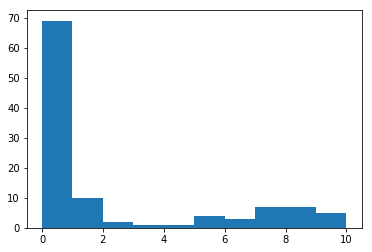

In [11]:
el_ls_C_v = glob.glob("./A2390C/fig/candidate_v3/visual/*.png")
Num_C_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_C_v]).astype("int"))

# Match two catalogs
idx, d2d, d3d = Coords.match_to_catalog_sky(Coords_C)
plt.hist(d2d.to(u.arcsec).value, range=[0,10])

Num_C_match = Datacube_C.Tab_SE["NUMBER"][idx[d2d<2*u.arcsec]]
Num_C_v_match = np.intersect1d(Num_C_match, Num_C_v)
Tab_match_C = Datacube_C.Tab_SE[Num_C_match-1]
Tab_match_C_v = Datacube_C.Tab_SE[Num_C_v_match-1]
Tab_match_C_v

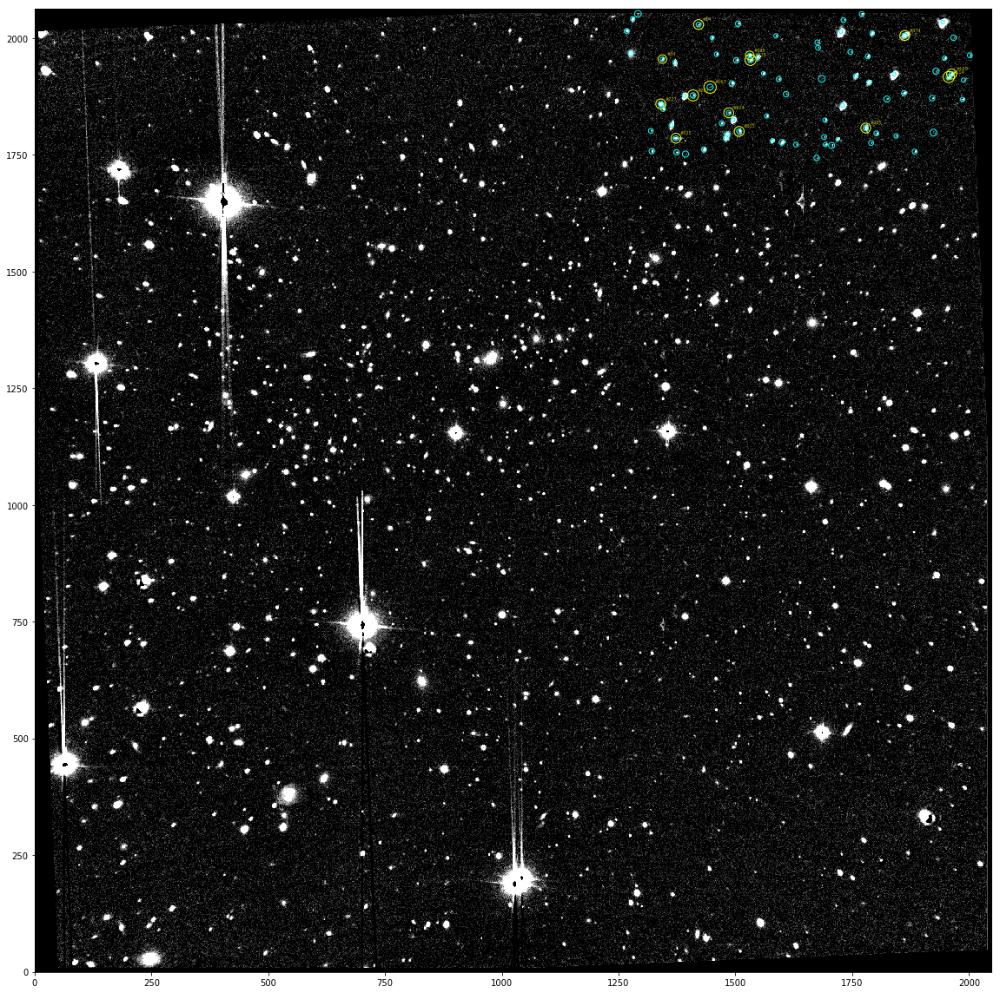

In [12]:
region_str = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], gal["PETRO_RADIUS"]) for gal in Tab_match_C])
region_str = "# Region file format: DS9 version 4.1\nglobal color=cyan dashlist=8 3 width=1\nimage\n"+region_str
regs = pyregion.parse(region_str)


region_str_v = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 2*gal["PETRO_RADIUS"]) for gal in Tab_match_C_v])
region_str_v = "# Region file format: DS9 version 4.1\nglobal color=yellow dashlist=8 3 width=1\nimage\n"+region_str_v
regs_v = pyregion.parse(region_str_v)

hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390C/SE/A2390C_stack.fits')
stack_field = hdu_field[0].data

plt.figure(figsize=(16,16))
ax = plt.subplot(111)
ax.imshow(stack_field,vmin=0.001,vmax=1,origin="lower",cmap="gray")

patch_list, artist_list = regs.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
patch_list, artist_list = regs_v.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)

Pos_C_v = np.array([(x,y) for (x,y) in zip(Tab_match_C_v["X_IMAGE"], Tab_match_C_v["Y_IMAGE"])])
for num, pos in zip(Num_C_v, Pos_C_v):
    ax.text(pos[0]+8, pos[1]+8, "#%d"%num, color="y", fontsize=5, alpha=1.0, zorder=3)
    
plt.tight_layout()
plt.savefig("/home/qliu/Pictures/cross_match-C+W.pdf",dpi=250)

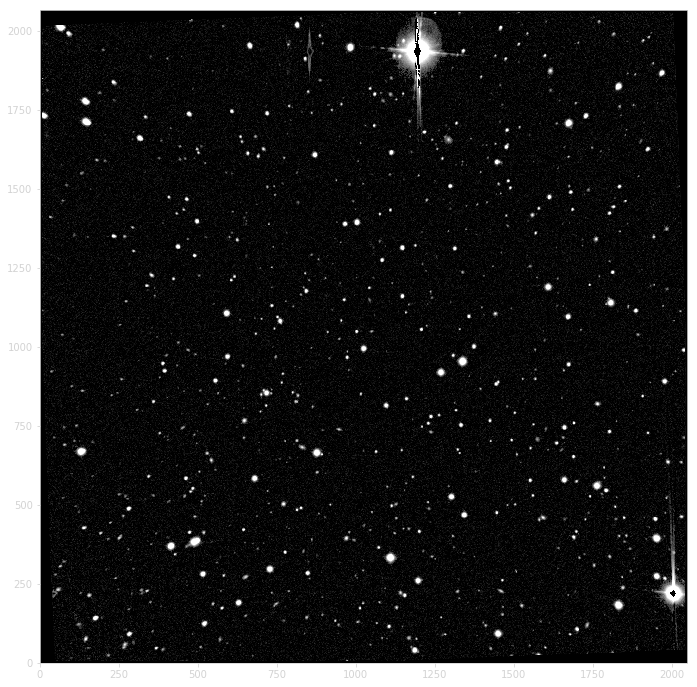

In [20]:
hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390NW/SE/A2390NW_stack.fits')
norm = ImageNormalize(stretch=AsinhStretch())
with plt.rc_context({'xtick.color':'lightgray', 'ytick.color':'lightgray', 'axes.labelcolor':'lightgray','axes.edgecolor':"lightgray"}):
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111)
    ax.imshow(hdu_field[0].data,vmin=0.001,vmax=10,norm=norm, origin="lower",cmap="gray")
    plt.savefig("pic_pre/Field_A2390NW.png",dpi=150,transparent=True)

##### Find Number in SE field that appeared in C field

NUMBER,EXT_NUMBER,FLUX_ISO,FLUXERR_ISO,FLUX_AUTO,FLUXERR_AUTO,FLUX_PETRO,FLUXERR_PETRO,KRON_RADIUS,PETRO_RADIUS,BACKGROUND,THRESHOLD,ISOAREA_IMAGE,XMIN_IMAGE,YMIN_IMAGE,XMAX_IMAGE,YMAX_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,X_IMAGE,Y_IMAGE,X_WORLD,Y_WORLD,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,MU_MAX,FLAGS,ELONGATION,CLASS_STAR
,,ct,ct,ct,ct,ct,ct,,,ct,ct,pix2,pix,pix,pix,pix,pix,pix,pix,pix,deg,deg,deg,deg,pix,pix,deg,mag / arcsec2,,,
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64
11,1,34.01354,7.938464,34.81407,9.108171,34.99788,10.0408,4.03,5.28,0.003879826,0.2397853,44,669,19,676,26,672,23,672.4422,22.9067,280.38907138,-60.121657347,280.3890714,-60.1216573,1.852,1.589,47.19,-3.0019,0,1.166,0.344
94,1,301.5699,23.5569,308.794,24.96875,295.7511,27.73745,3.5,5.28,-0.0001932671,0.2397853,268,99,113,136,145,123,123,123.9709,122.8139,257.58949291,-40.122504631,257.5894929,-40.1225046,4.405,3.542,-4.32,-3.7808,2,1.244,0.023
109,1,49.07366,9.549394,49.98884,10.6565,44.26102,12.43437,3.5,5.28,0.001924356,0.2397853,69,268,102,279,111,274,106,273.2571,106.6267,261.15062026,-44.819296084,261.1506203,-44.8192961,2.715,1.85,33.34,-2.7553,0,1.468,0.008
147,1,40.79652,8.740118,46.24128,10.23851,33.69767,13.11536,3.5,5.94,0.001467294,0.2397853,63,191,140,201,149,196,143,195.8699,144.0831,258.66680981,-41.47414445,258.6668098,-41.4741445,2.492,2.089,36.05,-2.7376,1,1.193,0.008
164,1,288.7209,22.94237,288.0097,23.39539,294.8667,24.73586,3.5,5.28,-0.001178429,0.2397853,162,540,179,554,196,547,187,547.4821,187.3975,269.00114421,-52.084917051,269.0011442,-52.0849171,3.171,2.399,68.29,-4.6111,0,1.322,0.029
218,1,172.4573,17.80234,178.4396,18.99782,168.0842,20.87955,3.53,5.28,-0.0002947557,0.2397853,148,314,223,329,238,320,231,321.0055,230.9427,259.98539264,-42.60300395,259.9853926,-42.6030039,3.272,2.764,18.68,-3.5934,3,1.184,0.021
229,1,83.28706,12.38368,76.99008,13.03626,67.43988,14.72845,3.5,5.28,0.001162827,0.2397853,85,124,217,136,226,129,221,129.2065,221.4795,256.04481106,-37.253911236,256.0448111,-37.2539112,2.846,1.89,29.06,-3.3615,0,1.506,0.018
288,1,42.12112,8.870732,46.98877,10.43462,42.18401,12.05345,3.72,5.28,-0.001989237,0.2397853,68,205,292,215,301,210,295,210.168,296.1602,256.22980359,-36.966953208,256.2298036,-36.9669532,2.88,1.731,34.82,-2.7811,0,1.664,0.008


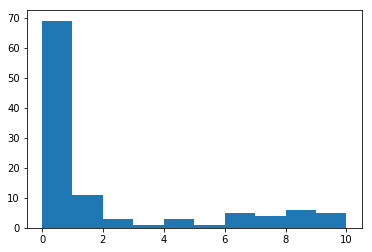

In [62]:
# Match two catalogs
idx, d2d, d3d = Coords_C.match_to_catalog_sky(Coords)
plt.hist(d2d.to(u.arcsec).value, range=[0,10],bins=10)

Num_match = Datacube.Tab_SE["NUMBER"][idx]
Num_v_match = np.intersect1d(Num_match[d2d<2*u.arcsec], Num_v)
Tab_v = Datacube.Tab_SE[Num_v-1]
Tab_match = Datacube.Tab_SE[Num_match[d2d<2*u.arcsec]-1]

ind_match_v = Num_v_match-1
Tab_match_v = Datacube.Tab_SE[ind_match_v]
Tab_match_v

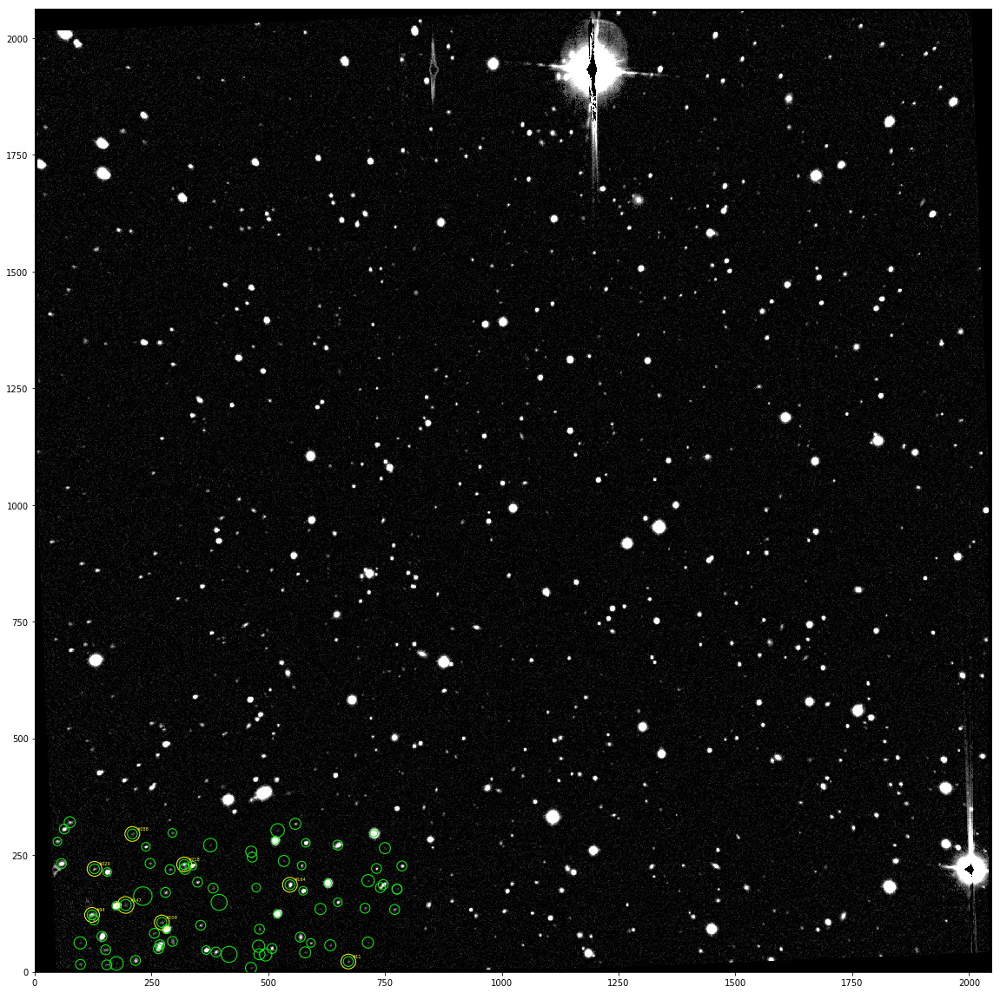

In [67]:
import pyregion

region_str = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 2*gal["PETRO_RADIUS"]) for gal in Tab_match])
region_str = "# Region file format: DS9 version 4.1\nglobal color=green dashlist=8 3 width=1\nimage\n"+region_str
regs_v = pyregion.parse(region_str)

region_str_v = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 3*gal["PETRO_RADIUS"]) for gal in Tab_match_v])
region_str_v = "# Region file format: DS9 version 4.1\nglobal color=yellow dashlist=8 3 width=1\nimage\n"+region_str_v
regs = pyregion.parse(region_str_v)

hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390NW/SE/A2390NW_stack.fits')
stack_field = hdu_field[0].data

plt.figure(figsize=(16,16))
ax = plt.subplot(111)
ax.imshow(stack_field,vmin=0.001,vmax=3,origin="lower",cmap="gray")

patch_list, artist_list = regs.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
patch_list, artist_list = regs_v.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
Pos_match_v = np.array([(x,y) for (x,y) in zip(Tab_match_v["X_IMAGE"], Tab_match_v["Y_IMAGE"])])
for num, pos in zip(Num_v_match, Pos_match_v):
    ax.text(pos[0]+8, pos[1]+8, "#%d"%num, color="yellow", fontsize=5, alpha=1.0, zorder=3)
    
plt.tight_layout()
plt.savefig("/home/qliu/Pictures/cross_match-NW.pdf",dpi=250)